<a href="https://colab.research.google.com/github/siim2mary/mkdir-my_projects/blob/main/Predict_coupon_acceptance_on_ecommerce_platform.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


“Predicting Coupon Acceptance on E-commerce Platforms” (repeated_batch)

Date:14-03-2024


# “Predicting Coupon Acceptance on E-commerce Platforms”

**The goal of this project is to leverage machine learning techniques to analyze driving scenarios and user attributes collected from an e-commerce website. By accurately predicting whether users will accept coupons during their journeys, the aim is to optimize coupon distribution strategies and enhance user engagement with the platform's offerings. #The survey describes different driving scenarios including the user’s destination, current time, weather, passenger, coupon attributes, user attributes, and contextual attributes, and then asks the user whether he/she will accept the coupon or not.**

In [ ]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

import warnings
warnings.filterwarnings("ignore")

In [ ]:
df= pd.read_csv("Data/Coupon_data.csv",encoding = 'latin1')

In [ ]:
df.head()

,destination,passanger,weather,temperature,coupon,expiration,gender,age,maritalStatus,has_children,...,CoffeeHouse,CarryAway,RestaurantLessThan20,Restaurant20To50,toCoupon_GEQ5min,toCoupon_GEQ15min,toCoupon_GEQ25min,direction_same,direction_opp,Accept(Y/N?)
0,No Urgent Place,Alone,Sunny,55,Restaurant(<20),1d,Female,21,Unmarried partner,1,...,never,NaN,4~8,1~3,1,0,0,0,1,1
1,No Urgent Place,Friend(s),Sunny,80,Coffee House,2h,Female,21,Unmarried partner,1,...,never,NaN,4~8,1~3,1,0,0,0,1,0
2,No Urgent Place,Friend(s),Sunny,80,Carry out & Take away,2h,Female,21,Unmarried partner,1,...,never,NaN,4~8,1~3,1,1,0,0,1,1
3,No Urgent Place,Friend(s),Sunny,80,Coffee House,2h,Female,21,Unmarried partner,1,...,never,NaN,4~8,1~3,1,1,0,0,1,0
4,No Urgent Place,Friend(s),Sunny,80,Coffee House,1d,Female,21,Unmarried partner,1,...,never,NaN,4~8,1~3,1,1,0,0,1,0


# Data Description

**destination - destination of traveler**

**passanger - who are the passengers in the car**

**weather - weather when the user is driving (Sunny, Rainy, Snowy)**

**temperature - temperature in Fahrenheit when the user is driving**

**coupon - Type of Coupon**

**expiration - Validity of Coupon**

**gender - Female, Male**

**age - 21, 46, 26, 31, 41, 50plus, 36, below21**

**maritalStatus - Unmarried partner, Single, Married partner, Divorced, Widowed**

**has_children - 1: has children, 0: No children**

**coffeeHouse - how many times does the user go to a coffeehouse every month?**

**CarryAway - how many times does the user get takeaway food every month?**

**RestaurantLessThan20 - how many times does the user go to a restaurant with an average expense per person of less than 20 every month?**

**Restaurant20to50 - how many times does the user go to a restaurant with an average expense per person of $20 — $50 every month**

**toCoupon_GEQ5min: driving distance to the restaurant/cafe/bar for using the coupon is greater than 5 minutes (0,1)**

**toCoupon_GEQ15min: driving distance to the restaurant/cafe/bar for using the coupon is greater than 15 minutes (0,1)**

**toCoupon_GEQ25min: driving distance to the restaurant/cafe/bar for using the coupon is greater than 25 minutes (0,1)**

**direction_same: whether the restaurant/cafe/bar is in the same direction as the traveler’s current destination (0,1)**

**direction_opp: whether the restaurant/cafe/bar is in the opposite direction as the user’s current destination (0,1)**

**Accept(Y/N?)- Target column( whether user will accept the coupon or not?)**
       
        
        

In [ ]:
df.shape

(12684, 25)

**There are 12684 rows and 25 columns in this dataset.**

# Information about variable type

In [ ]:
df.columns

Index(['destination', 'passanger', 'weather', 'temperature', 'coupon',
       'expiration', 'gender', 'age', 'maritalStatus', 'has_children',
       'education', 'occupation', 'income', 'car', 'Bar', 'CoffeeHouse',
       'CarryAway', 'RestaurantLessThan20', 'Restaurant20To50',
       'toCoupon_GEQ5min', 'toCoupon_GEQ15min', 'toCoupon_GEQ25min',
       'direction_same', 'direction_opp', 'Accept(Y/N?)'],
      dtype='object')

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12684 entries, 0 to 12683
Data columns (total 25 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   destination           12684 non-null  object
 1   passanger             12684 non-null  object
 2   weather               12684 non-null  object
 3   temperature           12684 non-null  int64 
 4   coupon                12684 non-null  object
 5   expiration            12684 non-null  object
 6   gender                12684 non-null  object
 7   age                   12684 non-null  object
 8   maritalStatus         12684 non-null  object
 9   has_children          12684 non-null  int64 
 10  education             12684 non-null  object
 11  occupation            12684 non-null  object
 12  income                12684 non-null  object
 13  car                   108 non-null    object
 14  Bar                   12577 non-null  object
 15  CoffeeHouse           12467 non-null

**Here temperature, toCoupon_GEQ5min, toCoupon_GEQ15,toCoupon_GEQ25min,direction_same,direction_opp,Accept(Y/N?) are   integer type rest all others are character types.**

# Description about Dataset

In [ ]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
temperature,12684.0,63.301798,19.154486,30.0,55.0,80.0,80.0,80.0
has_children,12684.0,0.414144,0.492593,0.0,0.0,0.0,1.0,1.0
toCoupon_GEQ5min,12684.0,1.000000,0.000000,1.0,1.0,1.0,1.0,1.0
toCoupon_GEQ15min,12684.0,0.561495,0.496224,0.0,0.0,1.0,1.0,1.0
toCoupon_GEQ25min,12684.0,0.119126,0.323950,0.0,0.0,0.0,0.0,1.0
direction_same,12684.0,0.214759,0.410671,0.0,0.0,0.0,0.0,1.0
direction_opp,12684.0,0.785241,0.410671,0.0,1.0,1.0,1.0,1.0
Accept(Y/N?),12684.0,0.568433,0.495314,0.0,0.0,1.0,1.0,1.0


**This describes only numerical values in data set.**

**Here temperature has a total of 12684 instances. The average temperature in the dataset is approximately 63.30 degrees Fahrenheit, with a standard deviation of 19.15. The temperature ranges from a minimum of 30 degrees to a maximum of 80 degrees.The 25th percentile temperature is 55 degrees, and the 75th percentile temperature is also 80 degrees.**

Temperature Range: The temperature in the dataset ranges from 30 to 80 degrees Fahrenheit, with an average of 63.30 degrees. Without further context or analysis, it's challenging to determine how this temperature range specifically influences coupon acceptance.

Percentile Values: The 25th and 75th percentile temperatures are 55 and 80 degrees Fahrenheit, respectively. This suggests that a significant portion of the observations fall within this range, indicating variability in temperature conditions.

Coupon Acceptance Rate: The average coupon acceptance rate is approximately 56.84%. While this statistic provides insight into overall acceptance trends, it doesn't directly indicate whether temperature influenced this acceptance rate.

In [ ]:
#check unique data for each feature in data frame
df.nunique()

destination              3
passanger                4
weather                  3
temperature              3
coupon                   5
expiration               2
gender                   2
age                      8
maritalStatus            5
has_children             2
education                6
occupation              25
income                   9
car                      5
Bar                      5
CoffeeHouse              5
CarryAway                5
RestaurantLessThan20     5
Restaurant20To50         5
toCoupon_GEQ5min         1
toCoupon_GEQ15min        2
toCoupon_GEQ25min        2
direction_same           2
direction_opp            2
Accept(Y/N?)             2
dtype: int64

# Cleaning Data

In [ ]:
df.shape

(12684, 25)

# Check for NA -not available data or values

In [ ]:
df.isna().sum()

destination                 0
passanger                   0
weather                     0
temperature                 0
coupon                      0
expiration                  0
gender                      0
age                         0
maritalStatus               0
has_children                0
education                   0
occupation                  0
income                      0
car                     12576
Bar                       107
CoffeeHouse               217
CarryAway                 151
RestaurantLessThan20      130
Restaurant20To50          189
toCoupon_GEQ5min            0
toCoupon_GEQ15min           0
toCoupon_GEQ25min           0
direction_same              0
direction_opp               0
Accept(Y/N?)                0
dtype: int64

**There are 12576 null values in car, 107 null values in bar,217 Null values in cofeeHouse, CarryAway has 151 null values,RestaurantLessThan20 has 130 null values and Restaurant20To50 has 189 null values.**

# Checking if there are null values or not

In [ ]:
df.isnull().sum()

destination                 0
passanger                   0
weather                     0
temperature                 0
coupon                      0
expiration                  0
gender                      0
age                         0
maritalStatus               0
has_children                0
education                   0
occupation                  0
income                      0
car                     12576
Bar                       107
CoffeeHouse               217
CarryAway                 151
RestaurantLessThan20      130
Restaurant20To50          189
toCoupon_GEQ5min            0
toCoupon_GEQ15min           0
toCoupon_GEQ25min           0
direction_same              0
direction_opp               0
Accept(Y/N?)                0
dtype: int64

# Percentage of Null values

In [ ]:
df.isnull().sum()/len(df)*100

destination              0.000000
passanger                0.000000
weather                  0.000000
temperature              0.000000
coupon                   0.000000
expiration               0.000000
gender                   0.000000
age                      0.000000
maritalStatus            0.000000
has_children             0.000000
education                0.000000
occupation               0.000000
income                   0.000000
car                     99.148534
Bar                      0.843582
CoffeeHouse              1.710817
CarryAway                1.190476
RestaurantLessThan20     1.024913
Restaurant20To50         1.490066
toCoupon_GEQ5min         0.000000
toCoupon_GEQ15min        0.000000
toCoupon_GEQ25min        0.000000
direction_same           0.000000
direction_opp            0.000000
Accept(Y/N?)             0.000000
dtype: float64

<Axes: >

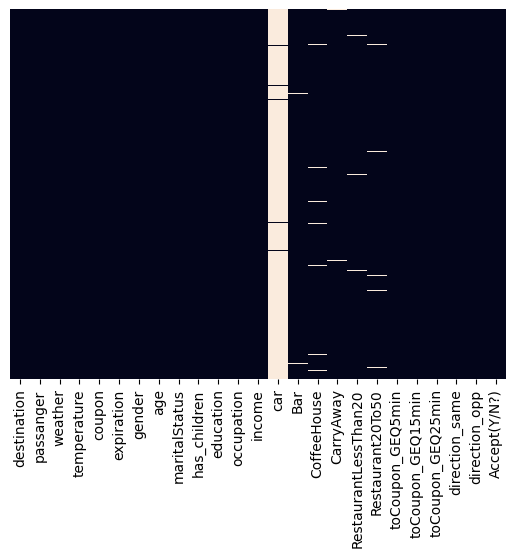

In [ ]:
sns.heatmap(df.isnull(),yticklabels = False, cbar = False)

# Clean data

In [ ]:
#Notavailable data
def data_clean(df):
    df.fillna(0,inplace = True)#Zero imputation
    print(df.isna().sum())
#fillnulla value with 0(Zero imputation) and doing it in the same dataframe itself we use inplace

In [ ]:
data_clean(df)

destination             0
passanger               0
weather                 0
temperature             0
coupon                  0
expiration              0
gender                  0
age                     0
maritalStatus           0
has_children            0
education               0
occupation              0
income                  0
car                     0
Bar                     0
CoffeeHouse             0
CarryAway               0
RestaurantLessThan20    0
Restaurant20To50        0
toCoupon_GEQ5min        0
toCoupon_GEQ15min       0
toCoupon_GEQ25min       0
direction_same          0
direction_opp           0
Accept(Y/N?)            0
dtype: int64


**Now we replaced all null values with 0.And the df shows a dataframe with all null values cleaned.Here we used zero imputation since it will be unfair if we use mean,median or mode for car since there are so many cars.So it's better to give cars with null values as 0 than mean,median or mode.**

<Axes: >

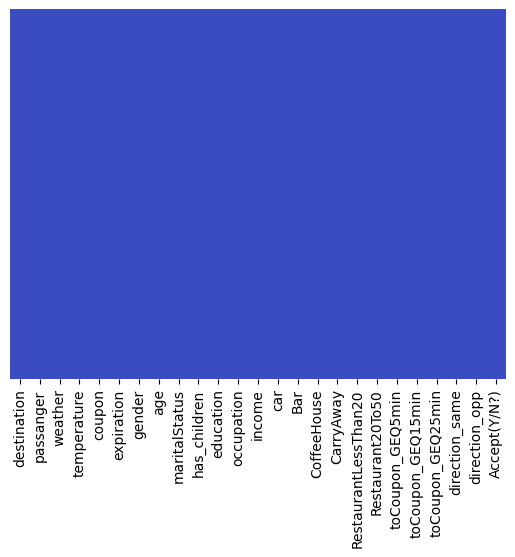

In [ ]:
sns.heatmap(df.isnull(),yticklabels = False, cbar = False, cmap = 'coolwarm')

**Now there are no null values.The Dataframe is cleaned.**

In [ ]:
df['has_children'].value_counts()

0    7431
1    5253
Name: has_children, dtype: int64

In [ ]:
df.has_children.nunique()


2

In [ ]:
list_columns = ['has_children','age']
for i in list_columns:
    print(f"{i} has unique values as{df[i].unique()}")

has_children has unique values as[1 0]
age has unique values as['21' '46' '26' '31' '41' '50plus' '36' 'below21']


In [ ]:
# Filter DataFrame to select rows where 'has_children' is 1 (indicating they have children)
df_with_children = df[df['has_children'] == 1]

# Further filter to select rows where 'Accept(Y/N?)' is 'Y' (indicating acceptance of token)
accepted_tokens_with_children = df_with_children[df_with_children['Accept(Y/N?)'] == 1]

# Further filter to select rows where 'Accept(Y/N?)' is 'N' (indicating rejection of token)
rejected_tokens_with_children = df_with_children[df_with_children['Accept(Y/N?)'] == 0]

# Print the results
print("People with children who have accepted the token:")
print(accepted_tokens_with_children)

print("\nPeople with children who have rejected the token:")
print(rejected_tokens_with_children)


People with children who have accepted the token:
           destination  passanger weather  temperature                 coupon  \
0      No Urgent Place      Alone   Sunny           55        Restaurant(<20)   
2      No Urgent Place  Friend(s)   Sunny           80  Carry out & Take away   
5      No Urgent Place  Friend(s)   Sunny           80        Restaurant(<20)   
6      No Urgent Place  Friend(s)   Sunny           55  Carry out & Take away   
7      No Urgent Place     Kid(s)   Sunny           80        Restaurant(<20)   
...                ...        ...     ...          ...                    ...   
12649  No Urgent Place     Kid(s)   Sunny           55        Restaurant(<20)   
12652             Home    Partner   Sunny           30                    Bar   
12653             Home      Alone   Sunny           80  Carry out & Take away   
12654             Home      Alone   Sunny           30  Carry out & Take away   
12658             Work      Alone   Rainy           55  Car

In [ ]:
accepted_tokens_with_children

,destination,passanger,weather,temperature,coupon,expiration,gender,age,maritalStatus,has_children,...,CoffeeHouse,CarryAway,RestaurantLessThan20,Restaurant20To50,toCoupon_GEQ5min,toCoupon_GEQ15min,toCoupon_GEQ25min,direction_same,direction_opp,Accept(Y/N?)
0,No Urgent Place,Alone,Sunny,55,Restaurant(<20),1d,Female,21,Unmarried partner,1,...,never,0,4~8,1~3,1,0,0,0,1,1
2,No Urgent Place,Friend(s),Sunny,80,Carry out & Take away,2h,Female,21,Unmarried partner,1,...,never,0,4~8,1~3,1,1,0,0,1,1
5,No Urgent Place,Friend(s),Sunny,80,Restaurant(<20),2h,Female,21,Unmarried partner,1,...,never,0,4~8,1~3,1,1,0,0,1,1
6,No Urgent Place,Friend(s),Sunny,55,Carry out & Take away,1d,Female,21,Unmarried partner,1,...,never,0,4~8,1~3,1,1,0,0,1,1
7,No Urgent Place,Kid(s),Sunny,80,Restaurant(<20),2h,Female,21,Unmarried partner,1,...,never,0,4~8,1~3,1,1,0,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12649,No Urgent Place,Kid(s),Sunny,55,Restaurant(<20),2h,Male,31,Married partner,1,...,never,4~8,gt8,less1,1,1,0,0,1,1
12652,Home,Partner,Sunny,30,Bar,2h,Male,31,Married partner,1,...,never,4~8,gt8,less1,1,1,1,0,1,1
12653,Home,Alone,Sunny,80,Carry out & Take away,2h,Male,31,Married partner,1,...,never,4~8,gt8,less1,1,1,0,1,0,1
12654,Home,Alone,Sunny,30,Carry out & Take away,1d,Male,31,Married partner,1,...,never,4~8,gt8,less1,1,0,0,0,1,1


In [ ]:
rejected_tokens_with_children

,destination,passanger,weather,temperature,coupon,expiration,gender,age,maritalStatus,has_children,...,CoffeeHouse,CarryAway,RestaurantLessThan20,Restaurant20To50,toCoupon_GEQ5min,toCoupon_GEQ15min,toCoupon_GEQ25min,direction_same,direction_opp,Accept(Y/N?)
1,No Urgent Place,Friend(s),Sunny,80,Coffee House,2h,Female,21,Unmarried partner,1,...,never,0,4~8,1~3,1,0,0,0,1,0
3,No Urgent Place,Friend(s),Sunny,80,Coffee House,2h,Female,21,Unmarried partner,1,...,never,0,4~8,1~3,1,1,0,0,1,0
4,No Urgent Place,Friend(s),Sunny,80,Coffee House,1d,Female,21,Unmarried partner,1,...,never,0,4~8,1~3,1,1,0,0,1,0
9,No Urgent Place,Kid(s),Sunny,80,Bar,1d,Female,21,Unmarried partner,1,...,never,0,4~8,1~3,1,1,0,0,1,0
15,Home,Alone,Sunny,80,Coffee House,2h,Female,21,Unmarried partner,1,...,never,0,4~8,1~3,1,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12656,Home,Alone,Snowy,30,Coffee House,2h,Male,31,Married partner,1,...,never,4~8,gt8,less1,1,1,0,0,1,0
12657,Home,Alone,Sunny,80,Restaurant(20-50),1d,Male,31,Married partner,1,...,never,4~8,gt8,less1,1,0,0,1,0,0
12659,Work,Alone,Snowy,30,Coffee House,1d,Male,31,Married partner,1,...,never,4~8,gt8,less1,1,0,0,1,0,0
12660,Work,Alone,Snowy,30,Bar,1d,Male,31,Married partner,1,...,never,4~8,gt8,less1,1,1,1,0,1,0


In [ ]:
df.columns

Index(['destination', 'passanger', 'weather', 'temperature', 'coupon',
       'expiration', 'gender', 'age', 'maritalStatus', 'has_children',
       'education', 'occupation', 'income', 'car', 'Bar', 'CoffeeHouse',
       'CarryAway', 'RestaurantLessThan20', 'Restaurant20To50',
       'toCoupon_GEQ5min', 'toCoupon_GEQ15min', 'toCoupon_GEQ25min',
       'direction_same', 'direction_opp', 'Accept(Y/N?)'],
      dtype='object')

# Clean Age

In [ ]:
# Convert '50plus' to numerical value
df['age'] = df['age'].replace('50plus', 55)

# Convert 'below21' to numerical value
df['age'] = df['age'].replace('below21', 18)

# Ensure the 'age' column is of numeric data type
df['age'] = pd.to_numeric(df['age'])

# Where do customers come from?(Spatial Analysis)

In [ ]:
df['Accept(Y/N?)']==1 #those who accept coupons

0         True
1        False
2         True
3        False
4        False
         ...  
12679     True
12680     True
12681    False
12682    False
12683    False
Name: Accept(Y/N?), Length: 12684, dtype: bool

In [ ]:
df[df["Accept(Y/N?)"]==1]['destination']

0        No Urgent Place
2        No Urgent Place
5        No Urgent Place
6        No Urgent Place
7        No Urgent Place
              ...       
12671    No Urgent Place
12676               Home
12677               Home
12679               Home
12680               Work
Name: destination, Length: 7210, dtype: object

In [ ]:
df[df["Accept(Y/N?)"]==1]['destination'].value_counts()

No Urgent Place    3982
Home               1639
Work               1589
Name: destination, dtype: int64

# **Destination based data for customers who accepted coupons**

In [ ]:
destination_based_data = df[df["Accept(Y/N?)"]==1]['destination'].value_counts().reset_index()

In [ ]:
destination_based_data = df[df["Accept(Y/N?)"]==1]['destination'].value_counts().reset_index()
destination_based_data.columns = ["Place","No: of customers"]
print(destination_based_data)

             Place  No: of customers
0  No Urgent Place              3982
1             Home              1639
2             Work              1589


In [ ]:
import plotly.express as px

In [ ]:
map_customers = px.bar(destination_based_data, x ="Place", y= "No: of customers",
                      title = "Number of customers based on Destination",
                      labels = {'Place':'Place where they come from',"No:of customers":'Number of customers'})
map_customers.show()

**Here No urgent place has highest customers who has accepted coupon 3982 followed by Home.**

# Finding acceptance rate based on destination

In [ ]:
# Filter data for accepted coupons (Accept(Y/N?) = 1)
accepted_coupons = df[df['Accept(Y/N?)'] == 1]

# Calculate coupon acceptance rates for each destination
acceptance_by_destination = accepted_coupons['destination'].value_counts(normalize=True).reset_index()
acceptance_by_destination.columns = ['Destination', 'Acceptance Rate']
acceptance_by_destination

,Destination,Acceptance Rate
0,No Urgent Place,0.552288
1,Home,0.227323
2,Work,0.220388


In [ ]:
# Plot the results using Plotly
fig = px.bar(acceptance_by_destination, x='Destination', y='Acceptance Rate',
             title='Coupon Acceptance Rates by Destination',
             labels={'Destination': 'Destination', 'Acceptance Rate': 'Acceptance Rate'},
             )
fig.show()

**Acceptance rate is more for customers with No urgent place of destination with a rate of 0.5522 and less for work with a rate of 0.220,For home its 0.2273.**

In [ ]:
# Display acceptance rates for each destination
print("Acceptance rates by destination:")
print("No Urgent Place:", acceptance_by_destination[acceptance_by_destination['Destination'] == 'No Urgent Place']['Acceptance Rate'].values[0])
print("Home:", acceptance_by_destination[acceptance_by_destination['Destination'] == 'Home']['Acceptance Rate'].values[0])
print("Work:", acceptance_by_destination[acceptance_by_destination['Destination'] == 'Work']['Acceptance Rate'].values[0])


Acceptance rates by destination:
No Urgent Place: 0.5522884882108183
Home: 0.22732316227461857
Work: 0.2203883495145631


**If the acceptance rate for "No Urgent Place" is 0.5522, it means that 55.22% of customers who had "No Urgent Place" as their destination accepted the coupon.
Similarly, if the acceptance rate for "Work" is 0.220, it means that 22.0% of customers who were at work when they interacted with the coupon accepted it.**

# How does the weather affect coupon acceptance rates?

In [ ]:
df['weather'].value_counts()

Sunny    10069
Snowy     1405
Rainy     1210
Name: weather, dtype: int64

In [ ]:
sunny_data = df[df['weather'] == 'Sunny']
sunny_data

,destination,passanger,weather,temperature,coupon,expiration,gender,age,maritalStatus,has_children,...,CoffeeHouse,CarryAway,RestaurantLessThan20,Restaurant20To50,toCoupon_GEQ5min,toCoupon_GEQ15min,toCoupon_GEQ25min,direction_same,direction_opp,Accept(Y/N?)
0,No Urgent Place,Alone,Sunny,55,Restaurant(<20),1d,Female,21,Unmarried partner,1,...,never,0,4~8,1~3,1,0,0,0,1,1
1,No Urgent Place,Friend(s),Sunny,80,Coffee House,2h,Female,21,Unmarried partner,1,...,never,0,4~8,1~3,1,0,0,0,1,0
2,No Urgent Place,Friend(s),Sunny,80,Carry out & Take away,2h,Female,21,Unmarried partner,1,...,never,0,4~8,1~3,1,1,0,0,1,1
3,No Urgent Place,Friend(s),Sunny,80,Coffee House,2h,Female,21,Unmarried partner,1,...,never,0,4~8,1~3,1,1,0,0,1,0
4,No Urgent Place,Friend(s),Sunny,80,Coffee House,1d,Female,21,Unmarried partner,1,...,never,0,4~8,1~3,1,1,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12673,Home,Alone,Sunny,30,Carry out & Take away,1d,Male,26,Single,0,...,never,1~3,4~8,1~3,1,0,0,0,1,0
12676,Home,Alone,Sunny,80,Restaurant(20-50),1d,Male,26,Single,0,...,never,1~3,4~8,1~3,1,0,0,1,0,1
12677,Home,Partner,Sunny,30,Restaurant(<20),1d,Male,26,Single,0,...,never,1~3,4~8,1~3,1,1,1,0,1,1
12678,Home,Partner,Sunny,30,Restaurant(<20),2h,Male,26,Single,0,...,never,1~3,4~8,1~3,1,1,0,1,0,0


In [ ]:
#filter data for accepted coupons
accepted_coupons = df[df['Accept(Y/N?)']==1]

#filter data based on waether
accepted_coupon_byweather= accepted_coupons['weather'].value_counts().reset_index()
accepted_coupon_byweather.columns = ["weather","No:of people based on weather"]



In [ ]:
accepted_coupon_byweather

,weather,No:of people based on weather
0,Sunny,5989
1,Snowy,661
2,Rainy,560


In [ ]:
plot_weather = px.bar(accepted_coupon_byweather, x = "weather", y = "No:of people based on weather")
plot_weather.show()

**Here we can see that the no of people who accepted coupon is more for sunny days, at a count of 5989.And less for Rainy season at a count of 560.For snowy season the acceptance has a count of 661.That means people has more interest in accepting coupon during sunny days and moderate at snowy days and less at Rainy season.**

"Based on the bar plot showing the number of people who accepted coupons for different weather conditions, we observe the following:

    The number of people who accepted coupons is highest during sunny days, with a count of 5989.
    In snowy conditions, the acceptance count is moderate, with 661 people accepting coupons.
    The acceptance count is the lowest during rainy days, with only 560 people accepting coupons.

This indicates that there is a higher interest in accepting coupons during sunny days, a moderate interest during snowy days, and a lower interest during rainy days."

This interpretation provides a clear summary of the findings from the data visualization, helping to understand the patterns of coupon acceptance based on weather conditions.


**The variation in coupon acceptance rates based on weather conditions can be influenced by several factors. Here are some possible explanations for the observed patterns:

    Outdoor Activities: Sunny weather often encourages people to engage in outdoor activities, such as shopping, dining out, or recreational activities. This increased outdoor activity might lead to more exposure to promotional offers, including coupons, resulting in higher acceptance rates.

    Mood and Behavior: Weather can affect people's mood and behavior. Sunny weather is typically associated with positive emotions and higher energy levels, which may make people more receptive to promotional offers. Conversely, rainy weather might dampen people's mood and reduce their inclination to engage with coupons.

    Accessibility: Inclement weather, such as heavy rain or snow, can make it difficult for people to travel or go outdoors. This could lead to fewer opportunities for people to encounter and utilize coupons, resulting in lower acceptance rates.

    Perceived Value: People's perception of the value offered by coupons may vary depending on the weather. For example, discounts on outdoor activities or products suitable for sunny weather may be perceived as more valuable during such conditions, leading to higher acceptance rates.

    Consumer Preferences: Individual preferences and habits may also play a role. Some people may prefer to shop or dine out more frequently during certain weather conditions, influencing their likelihood of accepting coupons.

Overall, these factors interact in complex ways to influence consumer behavior and ultimately impact coupon acceptance rates across different weather conditions. Understanding these dynamics can help businesses tailor their marketing strategies and promotional offers to better align with consumer preferences and behaviors under various weather conditions.**

# Incoperate those who accepted coupons on sunny data.

In [ ]:
sunny_accepted_coupon = sunny_data[sunny_data['Accept(Y/N?)']==1]
sunny_data_coupon_accepted = sunny_accepted_coupon['temperature'].value_counts().reset_index()

In [ ]:
sunny_data_coupon_accepted.columns = ["temperature","No of people accepted coupon on sunny days"]

In [ ]:
sunny_data_coupon_accepted

,temperature,No of people accepted coupon on sunny days
0,80,3919
1,55,1501
2,30,569


In [ ]:
# Filter sunny_accepted_coupon DataFrame for temperature equal to 80
sunny_temp_80 = sunny_accepted_coupon[sunny_accepted_coupon['temperature'] == 80]
# display sunny_accepted_coupon DataFrame for temperature equal to 80
sunny_temp_80

,destination,passanger,weather,temperature,coupon,expiration,gender,age,maritalStatus,has_children,...,CoffeeHouse,CarryAway,RestaurantLessThan20,Restaurant20To50,toCoupon_GEQ5min,toCoupon_GEQ15min,toCoupon_GEQ25min,direction_same,direction_opp,Accept(Y/N?)
2,No Urgent Place,Friend(s),Sunny,80,Carry out & Take away,2h,Female,21,Unmarried partner,1,...,never,0,4~8,1~3,1,1,0,0,1,1
5,No Urgent Place,Friend(s),Sunny,80,Restaurant(<20),2h,Female,21,Unmarried partner,1,...,never,0,4~8,1~3,1,1,0,0,1,1
7,No Urgent Place,Kid(s),Sunny,80,Restaurant(<20),2h,Female,21,Unmarried partner,1,...,never,0,4~8,1~3,1,1,0,0,1,1
8,No Urgent Place,Kid(s),Sunny,80,Carry out & Take away,2h,Female,21,Unmarried partner,1,...,never,0,4~8,1~3,1,1,0,0,1,1
10,No Urgent Place,Kid(s),Sunny,80,Restaurant(<20),1d,Female,21,Unmarried partner,1,...,never,0,4~8,1~3,1,0,0,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12648,No Urgent Place,Alone,Sunny,80,Restaurant(<20),2h,Male,31,Married partner,1,...,never,4~8,gt8,less1,1,0,0,0,1,1
12653,Home,Alone,Sunny,80,Carry out & Take away,2h,Male,31,Married partner,1,...,never,4~8,gt8,less1,1,1,0,1,0,1
12662,No Urgent Place,Friend(s),Sunny,80,Restaurant(<20),2h,Male,26,Single,0,...,never,1~3,4~8,1~3,1,0,0,0,1,1
12668,No Urgent Place,Alone,Sunny,80,Restaurant(<20),2h,Male,26,Single,0,...,never,1~3,4~8,1~3,1,0,0,0,1,1


In [ ]:
plot_sunny = px.bar(sunny_temp_80, x = "temperature", y = "weather",color ="destination", color_continuous_scale='Viridis')
plot_sunny.show()

In [ ]:
# Calculate the range of temperatures for sunny, rainy, and snowy weather
sunny_range = (df[df['weather'] == 'Sunny']['temperature'].min(), df[df['weather'] == 'Sunny']['temperature'].max())
rainy_range = (df[df['weather'] == 'Rainy']['temperature'].min(), df[df['weather'] == 'Rainy']['temperature'].max())
snowy_range = (df[df['weather'] == 'Snowy']['temperature'].min(), df[df['weather'] == 'Snowy']['temperature'].max())

print("Range of temperatures for Sunny weather:", sunny_range)
print("Range of temperatures for Rainy weather:", rainy_range)
print("Range of temperatures for Snowy weather:", snowy_range)


Range of temperatures for Sunny weather: (30, 80)
Range of temperatures for Rainy weather: (55, 55)
Range of temperatures for Snowy weather: (30, 30)


In [ ]:
# Filter data for rainy weather
rainy_data = df[df['weather'] == 'Rainy']

# Filter rainy data for those who accepted coupons
rainy_accepted_coupon = rainy_data[rainy_data['Accept(Y/N?)'] == 1]


In [ ]:
rainy_accepted_coupon

,destination,passanger,weather,temperature,coupon,expiration,gender,age,maritalStatus,has_children,...,CoffeeHouse,CarryAway,RestaurantLessThan20,Restaurant20To50,toCoupon_GEQ5min,toCoupon_GEQ15min,toCoupon_GEQ25min,direction_same,direction_opp,Accept(Y/N?)
6582,No Urgent Place,Kid(s),Rainy,55,Coffee House,1d,Male,36,Married partner,1,...,0,less1,less1,never,1,0,0,0,1,1
6583,No Urgent Place,Kid(s),Rainy,55,Carry out & Take away,1d,Male,36,Married partner,1,...,0,less1,less1,never,1,1,0,0,1,1
6588,No Urgent Place,Friend(s),Rainy,55,Restaurant(<20),2h,Male,36,Married partner,1,...,0,less1,less1,never,1,0,0,0,1,1
6602,Work,Alone,Rainy,55,Bar,1d,Male,36,Married partner,1,...,0,less1,less1,never,1,0,0,0,1,1
6604,No Urgent Place,Kid(s),Rainy,55,Coffee House,1d,Male,36,Married partner,1,...,never,less1,1~3,1~3,1,0,0,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12629,Home,Partner,Rainy,55,Carry out & Take away,1d,Female,21,Unmarried partner,0,...,4~8,1~3,1~3,less1,1,0,0,1,0,1
12630,Work,Alone,Rainy,55,Carry out & Take away,1d,Female,21,Unmarried partner,0,...,4~8,1~3,1~3,less1,1,0,0,0,1,1
12658,Work,Alone,Rainy,55,Carry out & Take away,1d,Male,31,Married partner,1,...,never,4~8,gt8,less1,1,0,0,0,1,1
12679,Home,Partner,Rainy,55,Carry out & Take away,1d,Male,26,Single,0,...,never,1~3,4~8,1~3,1,0,0,1,0,1


In [ ]:
# Filter data for snowy weather
snowy_data = df[df['weather'] == 'Snowy']

# Filter snowy data for those who accepted coupons
snowy_accepted_coupon = snowy_data[snowy_data['Accept(Y/N?)'] == 1]


In [ ]:
snowy_accepted_coupon

,destination,passanger,weather,temperature,coupon,expiration,gender,age,maritalStatus,has_children,...,CoffeeHouse,CarryAway,RestaurantLessThan20,Restaurant20To50,toCoupon_GEQ5min,toCoupon_GEQ15min,toCoupon_GEQ25min,direction_same,direction_opp,Accept(Y/N?)
6596,Home,Alone,Snowy,30,Coffee House,1d,Male,36,Married partner,1,...,0,less1,less1,never,1,1,0,1,0,1
6603,Work,Alone,Snowy,30,Restaurant(<20),2h,Male,36,Married partner,1,...,0,less1,less1,never,1,1,1,0,1,1
6616,Home,Kid(s),Snowy,30,Restaurant(20-50),2h,Male,36,Married partner,1,...,never,less1,1~3,1~3,1,1,0,0,1,1
6625,Work,Alone,Snowy,30,Restaurant(<20),2h,Male,36,Married partner,1,...,never,less1,1~3,1~3,1,1,1,0,1,1
6643,Work,Alone,Snowy,30,Carry out & Take away,1d,Male,26,Single,0,...,1~3,1~3,1~3,less1,1,1,1,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12621,No Urgent Place,Partner,Snowy,30,Restaurant(<20),1d,Female,21,Unmarried partner,0,...,4~8,1~3,1~3,less1,1,0,0,0,1,1
12631,Work,Alone,Snowy,30,Coffee House,1d,Female,21,Unmarried partner,0,...,4~8,1~3,1~3,less1,1,0,0,1,0,1
12646,No Urgent Place,Friend(s),Snowy,30,Restaurant(<20),1d,Male,31,Married partner,1,...,never,4~8,gt8,less1,1,0,0,0,1,1
12666,No Urgent Place,Friend(s),Snowy,30,Restaurant(<20),1d,Male,26,Single,0,...,never,1~3,4~8,1~3,1,0,0,0,1,1


In [ ]:
# Create histogram of temperature distribution during snowy weather
histogram_snowy_temperature = px.box(snowy_accepted_coupon, x='temperature',
                                           title='Temperature Distribution During Snowy Weather (Accepted Coupons)',
                                           labels={'temperature': 'Temperature (Fahrenheit)', 'count': 'Frequency'})
histogram_snowy_temperature.update_traces(marker_color='skyblue', marker_line_color='black', marker_line_width=1)
histogram_snowy_temperature.update_layout(xaxis_title='Temperature (Fahrenheit)', yaxis_title='Frequency')
histogram_snowy_temperature.show()

# Extract data for sunny season with temperature range 30-80

**Extract people who accepted coupon on Sunny days.**

In [ ]:
sunny_accepted_coupon = df[(df['weather']== 'Sunny') & (df['temperature'] >=30) & (df['temperature'] <=80) &
                          (df['Accept(Y/N?)'] == 1)]

In [ ]:
sunny_accepted_coupon

,destination,passanger,weather,temperature,coupon,expiration,gender,age,maritalStatus,has_children,...,CoffeeHouse,CarryAway,RestaurantLessThan20,Restaurant20To50,toCoupon_GEQ5min,toCoupon_GEQ15min,toCoupon_GEQ25min,direction_same,direction_opp,Accept(Y/N?)
0,No Urgent Place,Alone,Sunny,55,Restaurant(<20),1d,Female,21,Unmarried partner,1,...,never,0,4~8,1~3,1,0,0,0,1,1
2,No Urgent Place,Friend(s),Sunny,80,Carry out & Take away,2h,Female,21,Unmarried partner,1,...,never,0,4~8,1~3,1,1,0,0,1,1
5,No Urgent Place,Friend(s),Sunny,80,Restaurant(<20),2h,Female,21,Unmarried partner,1,...,never,0,4~8,1~3,1,1,0,0,1,1
6,No Urgent Place,Friend(s),Sunny,55,Carry out & Take away,1d,Female,21,Unmarried partner,1,...,never,0,4~8,1~3,1,1,0,0,1,1
7,No Urgent Place,Kid(s),Sunny,80,Restaurant(<20),2h,Female,21,Unmarried partner,1,...,never,0,4~8,1~3,1,1,0,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12665,No Urgent Place,Friend(s),Sunny,30,Carry out & Take away,2h,Male,26,Single,0,...,never,1~3,4~8,1~3,1,0,0,0,1,1
12668,No Urgent Place,Alone,Sunny,80,Restaurant(<20),2h,Male,26,Single,0,...,never,1~3,4~8,1~3,1,0,0,0,1,1
12669,No Urgent Place,Partner,Sunny,30,Restaurant(20-50),1d,Male,26,Single,0,...,never,1~3,4~8,1~3,1,0,0,0,1,1
12676,Home,Alone,Sunny,80,Restaurant(20-50),1d,Male,26,Single,0,...,never,1~3,4~8,1~3,1,0,0,1,0,1


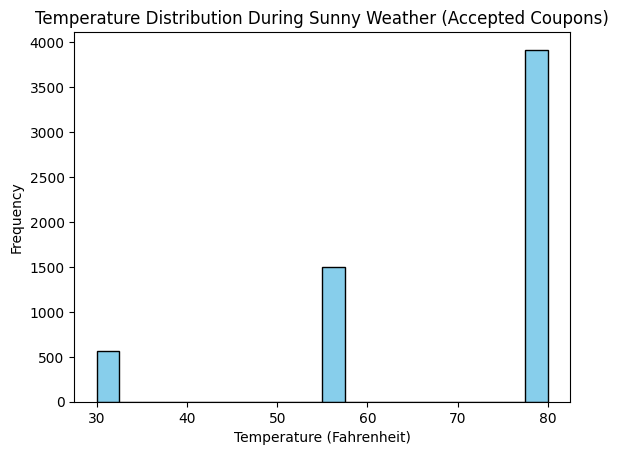

In [ ]:
import matplotlib.pyplot as plt

# Plot histogram of temperature distribution
plt.hist(sunny_accepted_coupon['temperature'], bins=20, color='skyblue', edgecolor='black')
plt.xlabel('Temperature (Fahrenheit)')
plt.ylabel('Frequency')
plt.title('Temperature Distribution During Sunny Weather (Accepted Coupons)')
plt.show()


In [ ]:
import plotly.express as px

# Create histogram of temperature distribution using Plotly Express
histogram = px.histogram(sunny_accepted_coupon, x='temperature', nbins=20,
                          labels={'temperature': 'Temperature (Fahrenheit)', 'count': 'Frequency'},
                          title='Temperature Distribution During Sunny Weather (Accepted Coupons)')
histogram.update_traces(marker_color='skyblue', marker_line_color='black', marker_line_width=1)
histogram.update_layout(xaxis=dict(title='Temperature (Fahrenheit)'),
                        yaxis=dict(title='Frequency'),
                        title={'x': 0.5, 'xanchor': 'center'})
histogram.show()


# How does temperature affect coupon acceptance?

In [ ]:
df['temperature'].value_counts()

80    6528
55    3840
30    2316
Name: temperature, dtype: int64

In [ ]:
accepted_coupon = df[df['Accept(Y/N?)']==1]#filter only those accepted coupons
#filter only the people accepted coupon based on temperature
accepted_coupon_bytemperature = accepted_coupon['temperature'].value_counts().reset_index()
accepted_coupon_bytemperature.columns = ["Temperature","No: of people based on temperature"]

In [ ]:
accepted_coupon_bytemperature

,Temperature,No: of people based on temperature
0,80,3919
1,55,2061
2,30,1230


In [ ]:
plot_temperature = px.bar(accepted_coupon_bytemperature, x = "Temperature", y = "No: of people based on temperature",
                         title= " Customers accepted coupon based on temperature",
                         labels = {'Temperature':'Temperature','No: of people based on temperature':'No:of people accepted coupon'})
plot_temperature.show()

**No of people who accepted coupon based on temperature range 30 is 1230 which is the least among all 3 ranges.The no of people who accepted coupon is higher at temperature range 80 is 3919.And for temperature 55 its 2061 .**

# To find does age has any significant impact with temperature

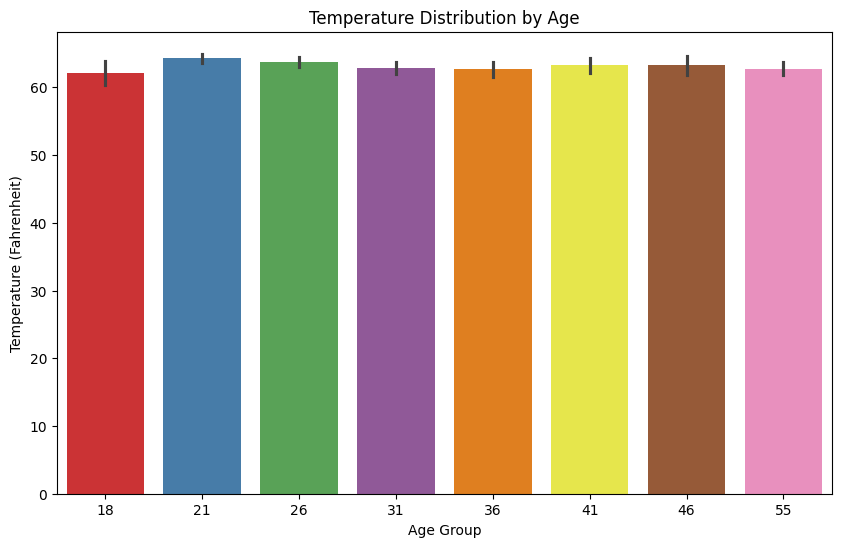

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create box plot of temperature by age group during snowy weather
plt.figure(figsize=(10, 6))
sns.barplot(x='age', y='temperature', data=df, palette='Set1')
plt.title('Temperature Distribution by Age')
plt.xlabel('Age Group')
plt.ylabel('Temperature (Fahrenheit)')
plt.show()


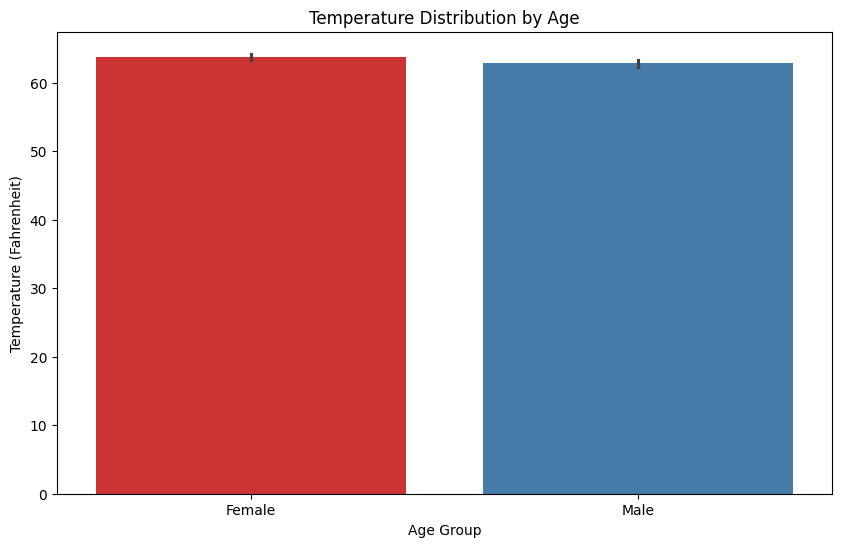

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create box plot of temperature by age group during snowy weather
plt.figure(figsize=(10, 6))
sns.barplot(x='gender', y='temperature', data=df, palette='Set1')
plt.title('Temperature Distribution by Age')
plt.xlabel('Age Group')
plt.ylabel('Temperature (Fahrenheit)')
plt.show()

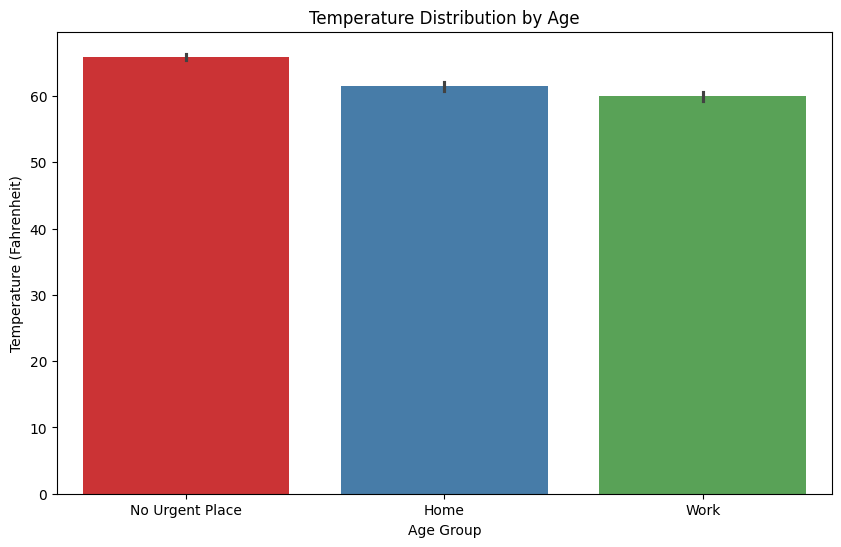

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create box plot of temperature by age group during snowy weather
plt.figure(figsize=(10, 6))
sns.barplot(x='destination', y='temperature', data=df, palette='Set1')
plt.title('Temperature Distribution by Age')
plt.xlabel('Age Group')
plt.ylabel('Temperature (Fahrenheit)')
plt.show()

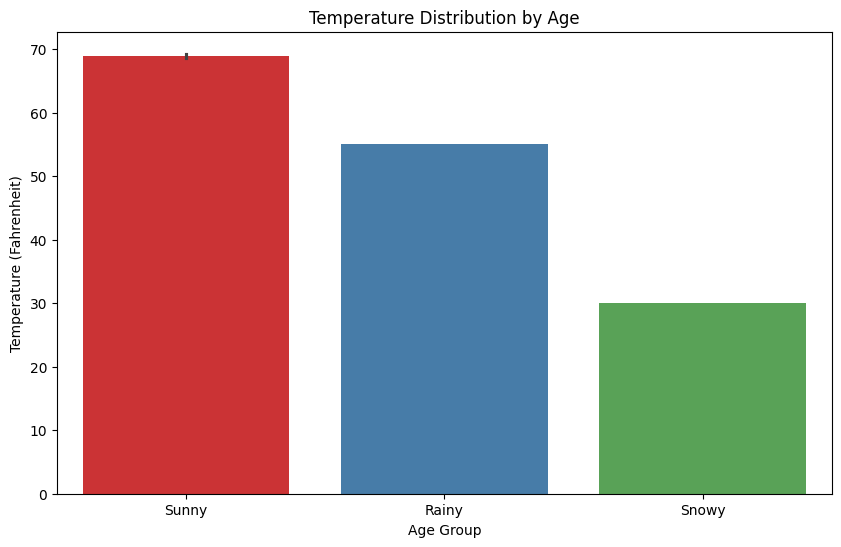

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create box plot of temperature by age group during snowy weather
plt.figure(figsize=(10, 6))
sns.barplot(x='weather', y='temperature', data=df, palette='Set1')
plt.title('Temperature Distribution by Age')
plt.xlabel('Age Group')
plt.ylabel('Temperature (Fahrenheit)')
plt.show()

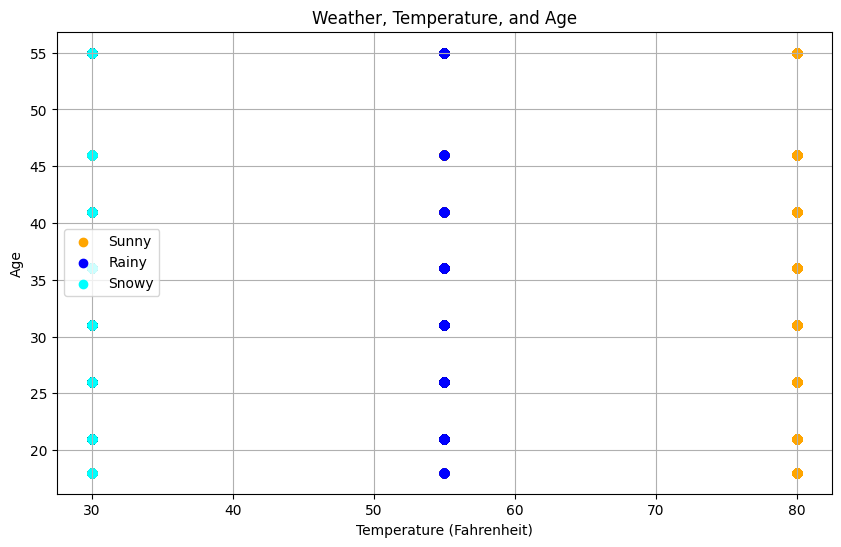

In [ ]:
import matplotlib.pyplot as plt

# Define colors for each weather condition
color_mapping = {'Sunny': 'orange', 'Rainy': 'blue', 'Snowy': 'cyan'}

# Create scatter plot of temperature vs. age colored by weather condition
plt.figure(figsize=(10, 6))
for weather, color in color_mapping.items():
    subset = df[df['weather'] == weather]
    plt.scatter(subset['temperature'], subset['age'], color=color, label=weather)

plt.xlabel('Temperature (Fahrenheit)')
plt.ylabel('Age')
plt.title('Weather, Temperature, and Age')
plt.legend()
plt.grid(True)
plt.show()


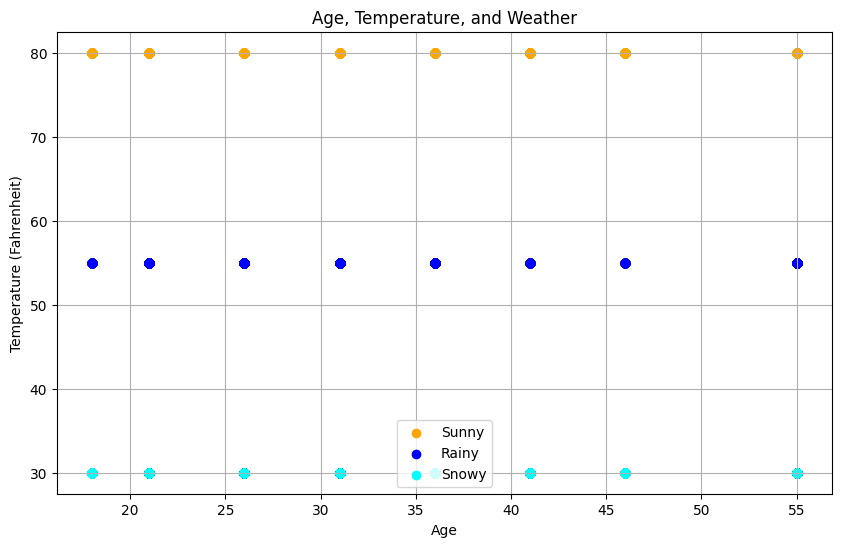

In [ ]:
import matplotlib.pyplot as plt

# Define colors for each weather condition
color_mapping = {'Sunny': 'orange', 'Rainy': 'blue', 'Snowy': 'cyan'}

# Create scatter plot of age vs. temperature colored by weather condition
plt.figure(figsize=(10, 6))
for weather, color in color_mapping.items():
    subset = df[df['weather'] == weather]
    plt.scatter(subset['age'], subset['temperature'], color=color, label=weather)

plt.xlabel('Age')
plt.ylabel('Temperature (Fahrenheit)')
plt.title('Age, Temperature, and Weather')
plt.legend()
plt.grid(True)
plt.show()


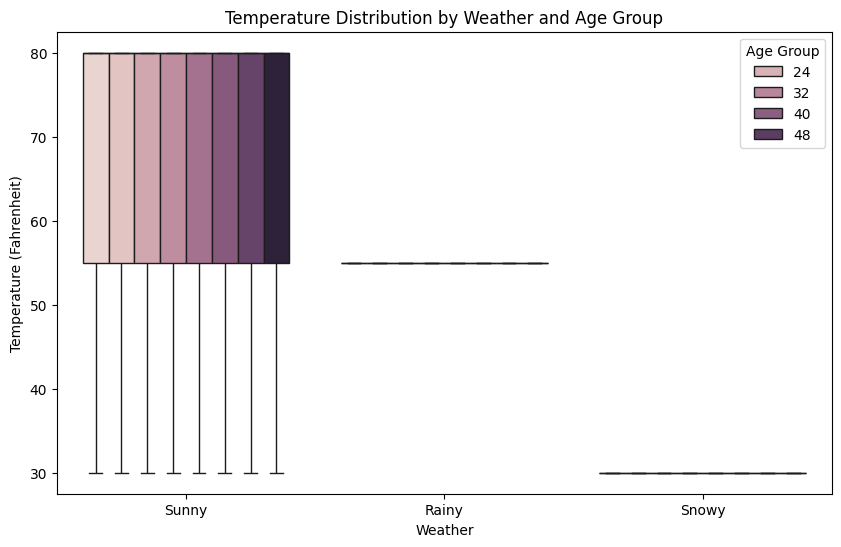

In [ ]:
# Create a box plot
plt.figure(figsize=(10, 6))
sns.boxplot(x='weather', y='temperature', hue='age', data=df)
plt.title('Temperature Distribution by Weather and Age Group')
plt.xlabel('Weather')
plt.ylabel('Temperature (Fahrenheit)')
plt.legend(title='Age Group')
plt.show()


# Data Engineering and cleaning

In [ ]:
df.columns

Index(['destination', 'passanger', 'weather', 'temperature', 'coupon',
       'expiration', 'gender', 'age', 'maritalStatus', 'has_children',
       'education', 'occupation', 'income', 'car', 'Bar', 'CoffeeHouse',
       'CarryAway', 'RestaurantLessThan20', 'Restaurant20To50',
       'toCoupon_GEQ5min', 'toCoupon_GEQ15min', 'toCoupon_GEQ25min',
       'direction_same', 'direction_opp', 'Accept(Y/N?)'],
      dtype='object')

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12684 entries, 0 to 12683
Data columns (total 25 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   destination           12684 non-null  object
 1   passanger             12684 non-null  object
 2   weather               12684 non-null  object
 3   temperature           12684 non-null  int64 
 4   coupon                12684 non-null  object
 5   expiration            12684 non-null  object
 6   gender                12684 non-null  object
 7   age                   12684 non-null  int64 
 8   maritalStatus         12684 non-null  object
 9   has_children          12684 non-null  int64 
 10  education             12684 non-null  object
 11  occupation            12684 non-null  object
 12  income                12684 non-null  object
 13  car                   12684 non-null  object
 14  Bar                   12684 non-null  object
 15  CoffeeHouse           12684 non-null

In [ ]:
df["Accept(Y/N?)"].value_counts()

1    7210
0    5474
Name: Accept(Y/N?), dtype: int64

In [ ]:
df["Accept(Y/N?)"].unique()

array([1, 0], dtype=int64)

In [ ]:
df["Accept(Y/N?)"]

0        1
1        0
2        1
3        0
4        0
        ..
12679    1
12680    1
12681    0
12682    0
12683    0
Name: Accept(Y/N?), Length: 12684, dtype: int64

# Rename columns

In [ ]:
df.rename(columns ={"Accept(Y/N?)":"accept"}, inplace = True)
df.rename(columns= {"RestaurantLessThan20": "Rest20"},inplace = True)
df.rename(columns = {"Restaurant20To50":"Rest50"},inplace =True)
df.rename(columns = {"CarryAway":"takeaway"}, inplace = True)
df.rename(columns = {"toCoupon_GEQ5min":"coupon5"},inplace = True)
df.rename(columns = {"toCoupon_GEQ15min":"coupon15"},inplace = True)
df.rename(columns = {"toCoupon_GEQ25min": "coupon25"},inplace = True)
df.rename(columns = {"direction_same":"samedir"}, inplace = True)
df.rename(columns = {"direction_opp":"oppdir"}, inplace = True)

In [ ]:
df.head()

,destination,passanger,weather,temperature,coupon,expiration,gender,age,maritalStatus,has_children,...,CoffeeHouse,takeaway,Rest20,Rest50,coupon5,coupon15,coupon25,samedir,oppdir,accept
0,No Urgent Place,Alone,Sunny,55,Restaurant(<20),1d,Female,21,Unmarried partner,1,...,never,0,4~8,1~3,1,0,0,0,1,1
1,No Urgent Place,Friend(s),Sunny,80,Coffee House,2h,Female,21,Unmarried partner,1,...,never,0,4~8,1~3,1,0,0,0,1,0
2,No Urgent Place,Friend(s),Sunny,80,Carry out & Take away,2h,Female,21,Unmarried partner,1,...,never,0,4~8,1~3,1,1,0,0,1,1
3,No Urgent Place,Friend(s),Sunny,80,Coffee House,2h,Female,21,Unmarried partner,1,...,never,0,4~8,1~3,1,1,0,0,1,0
4,No Urgent Place,Friend(s),Sunny,80,Coffee House,1d,Female,21,Unmarried partner,1,...,never,0,4~8,1~3,1,1,0,0,1,0


In [ ]:
df["destination"].value_counts()

No Urgent Place    6283
Home               3237
Work               3164
Name: destination, dtype: int64

In [ ]:
df["destination"].unique()

array(['No Urgent Place', 'Home', 'Work'], dtype=object)

In [ ]:
df.columns

Index(['destination', 'passanger', 'weather', 'temperature', 'coupon',
       'expiration', 'gender', 'age', 'maritalStatus', 'has_children',
       'education', 'occupation', 'income', 'car', 'Bar', 'CoffeeHouse',
       'takeaway', 'Rest20', 'Rest50', 'coupon5', 'coupon15', 'coupon25',
       'samedir', 'oppdir', 'accept'],
      dtype='object')

In [ ]:
df["destination"]

0        No Urgent Place
1        No Urgent Place
2        No Urgent Place
3        No Urgent Place
4        No Urgent Place
              ...       
12679               Home
12680               Work
12681               Work
12682               Work
12683               Work
Name: destination, Length: 12684, dtype: object

# considering only destination with accept 1 or only accept coupons

In [ ]:
dest = df[df["accept"] == 1]

In [ ]:
dest

,destination,passanger,weather,temperature,coupon,expiration,gender,age,maritalStatus,has_children,...,CoffeeHouse,takeaway,Rest20,Rest50,coupon5,coupon15,coupon25,samedir,oppdir,accept
0,No Urgent Place,Alone,Sunny,55,Restaurant(<20),1d,Female,21,Unmarried partner,1,...,never,0,4~8,1~3,1,0,0,0,1,1
2,No Urgent Place,Friend(s),Sunny,80,Carry out & Take away,2h,Female,21,Unmarried partner,1,...,never,0,4~8,1~3,1,1,0,0,1,1
5,No Urgent Place,Friend(s),Sunny,80,Restaurant(<20),2h,Female,21,Unmarried partner,1,...,never,0,4~8,1~3,1,1,0,0,1,1
6,No Urgent Place,Friend(s),Sunny,55,Carry out & Take away,1d,Female,21,Unmarried partner,1,...,never,0,4~8,1~3,1,1,0,0,1,1
7,No Urgent Place,Kid(s),Sunny,80,Restaurant(<20),2h,Female,21,Unmarried partner,1,...,never,0,4~8,1~3,1,1,0,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12671,No Urgent Place,Partner,Snowy,30,Restaurant(<20),1d,Male,26,Single,0,...,never,1~3,4~8,1~3,1,0,0,0,1,1
12676,Home,Alone,Sunny,80,Restaurant(20-50),1d,Male,26,Single,0,...,never,1~3,4~8,1~3,1,0,0,1,0,1
12677,Home,Partner,Sunny,30,Restaurant(<20),1d,Male,26,Single,0,...,never,1~3,4~8,1~3,1,1,1,0,1,1
12679,Home,Partner,Rainy,55,Carry out & Take away,1d,Male,26,Single,0,...,never,1~3,4~8,1~3,1,0,0,1,0,1


In [ ]:
df["coupon"]

0              Restaurant(<20)
1                 Coffee House
2        Carry out & Take away
3                 Coffee House
4                 Coffee House
                 ...          
12679    Carry out & Take away
12680    Carry out & Take away
12681             Coffee House
12682                      Bar
12683        Restaurant(20-50)
Name: coupon, Length: 12684, dtype: object

In [ ]:
df["coupon"].value_counts()

Coffee House             3996
Restaurant(<20)          2786
Carry out & Take away    2393
Bar                      2017
Restaurant(20-50)        1492
Name: coupon, dtype: int64

<Axes: >

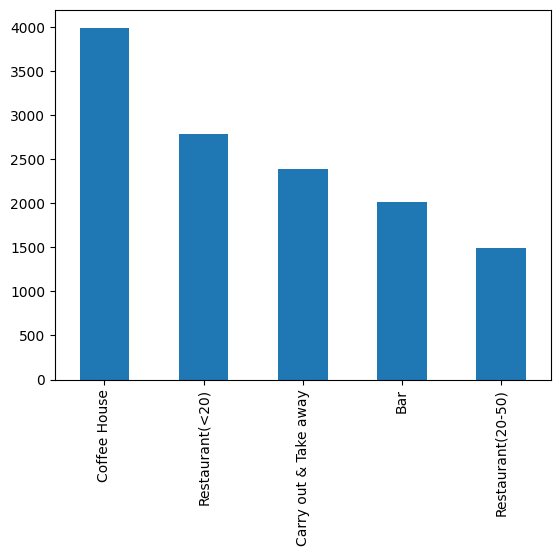

In [ ]:
df.coupon.value_counts().plot(kind = "bar")

**Here we can see that the coffee house has got more no of counts about 4000,followed by Restaurant(<20) at about 2700.The least is for REstaurant(20-50) with a count of 1600.**
**This suggests that coupons for coffee houses are commonly used or distributed .This implies that coupons for takeaway or carry-out food establishments are also quite prevalent. 'Restaurant(<20)' coupons are less common compared to 'Coffee House' and 'Takeaway' coupons but still have a significant presence. This suggests that coupons for restaurants with lower price ranges are also distributed or utilized.'Restaurant(20-50)' coupons have the lowest occurrence among the listed types. This indicates that coupons for restaurants with higher price ranges are relatively less common compared to the other types.**

# Calculating Acceptance rates For different Coupon Types

In [ ]:
# Calculate acceptance rates for each coupon type
acceptance_rates = df.groupby('coupon')['accept'].mean()

# Display acceptance rates
print(acceptance_rates)

coupon
Bar                      0.410015
Carry out & Take away    0.735478
Coffee House             0.499249
Restaurant(20-50)        0.441019
Restaurant(<20)          0.707107
Name: accept, dtype: float64


**The acceptance rates have been calculated for each coupon type, and the results are as follows:

    Bar: Acceptance rate of approximately 41.0%.
    Carry out & Take away: Acceptance rate of approximately 73.5%.
    Coffee House: Acceptance rate of approximately 49.9%.
    Restaurant(20-50): Acceptance rate of approximately 44.1%.
    Restaurant(<20): Acceptance rate of approximately 70.7%.

**These acceptance rates indicate the proportion of coupons accepted for each coupon type, providing insights into the effectiveness of different coupon types in terms of user engagement and acceptance. Further analysis and interpretation can be done based on these acceptance rates to optimize coupon distribution strategies and enhance user engagement.**

In [ ]:
df.columns


Index(['destination', 'passanger', 'weather', 'temperature', 'coupon',
       'expiration', 'gender', 'age', 'maritalStatus', 'has_children',
       'education', 'occupation', 'income', 'car', 'Bar', 'CoffeeHouse',
       'takeaway', 'Rest20', 'Rest50', 'coupon5', 'coupon15', 'coupon25',
       'samedir', 'oppdir', 'accept'],
      dtype='object')

<Figure size 2000x1600 with 0 Axes>

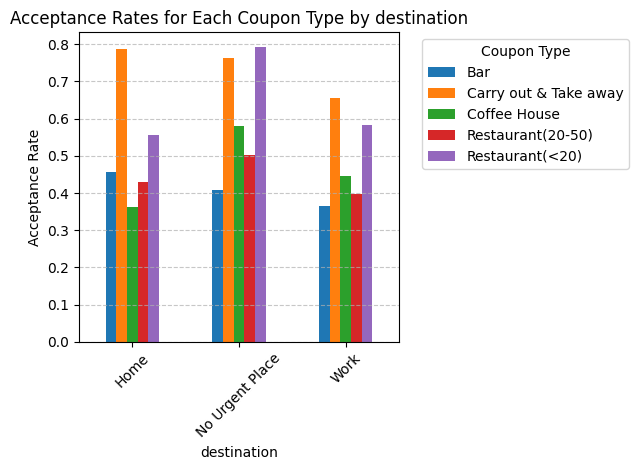

<Figure size 2000x1600 with 0 Axes>

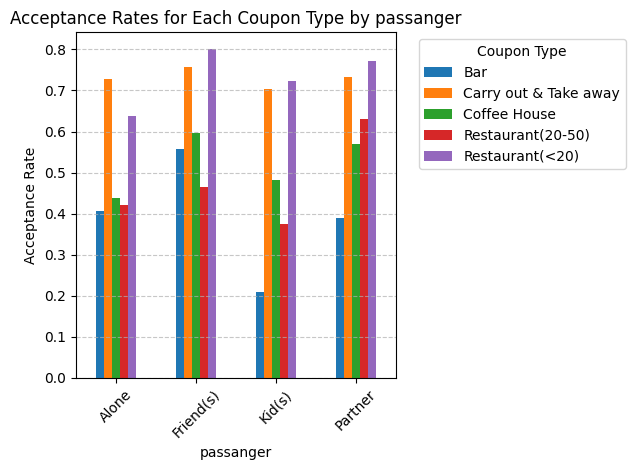

<Figure size 2000x1600 with 0 Axes>

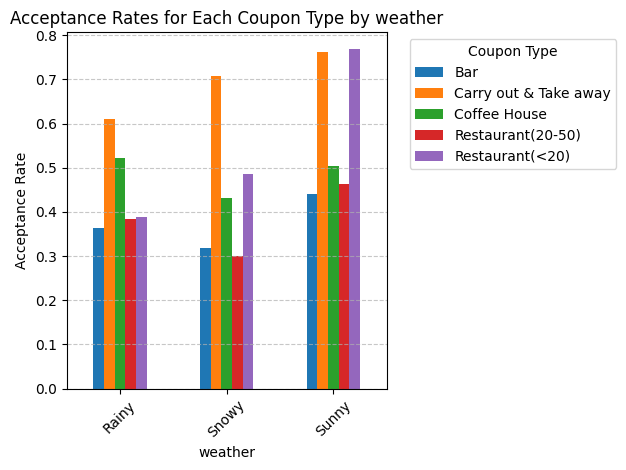

<Figure size 2000x1600 with 0 Axes>

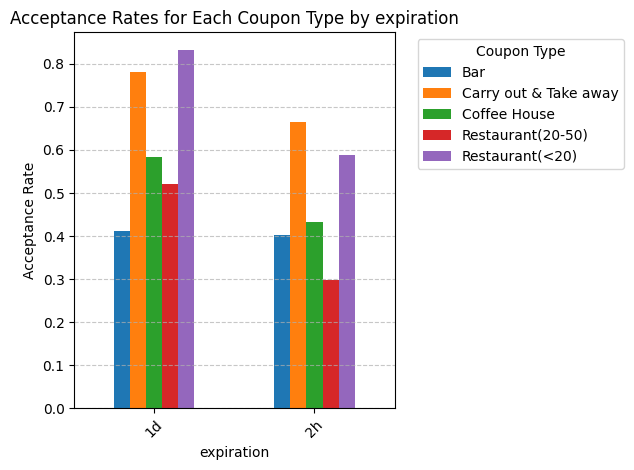

<Figure size 2000x1600 with 0 Axes>

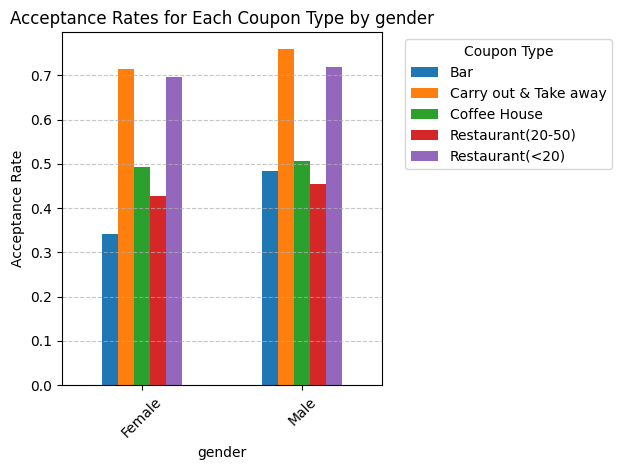

<Figure size 2000x1600 with 0 Axes>

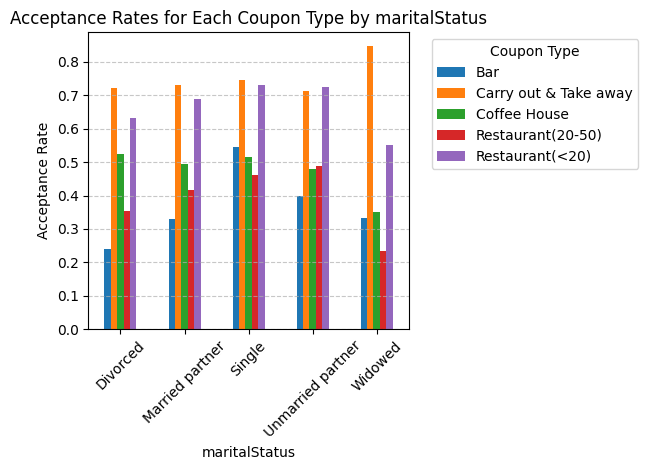

<Figure size 2000x1600 with 0 Axes>

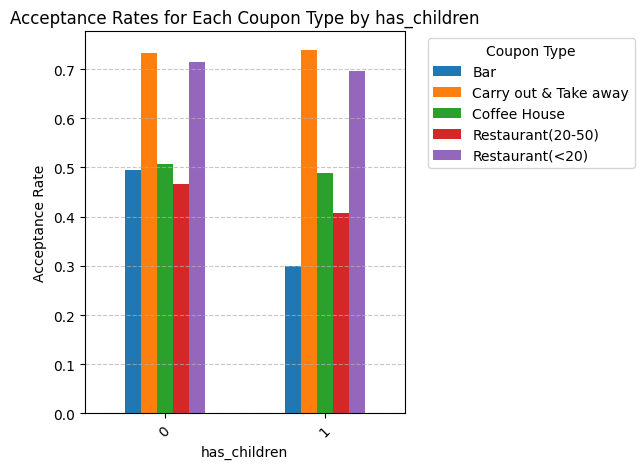

<Figure size 2000x1600 with 0 Axes>

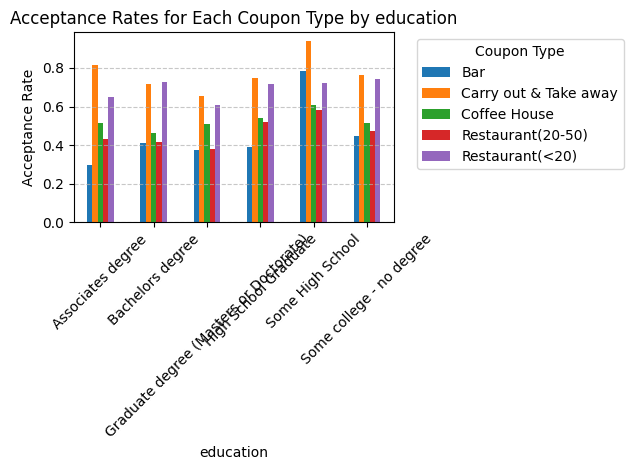

<Figure size 2000x1600 with 0 Axes>

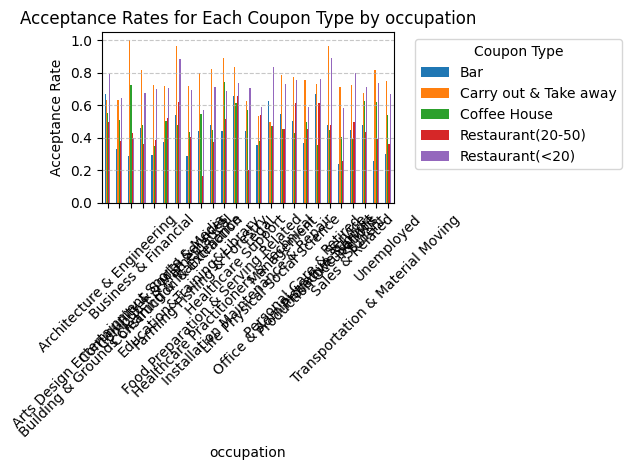

<Figure size 2000x1600 with 0 Axes>

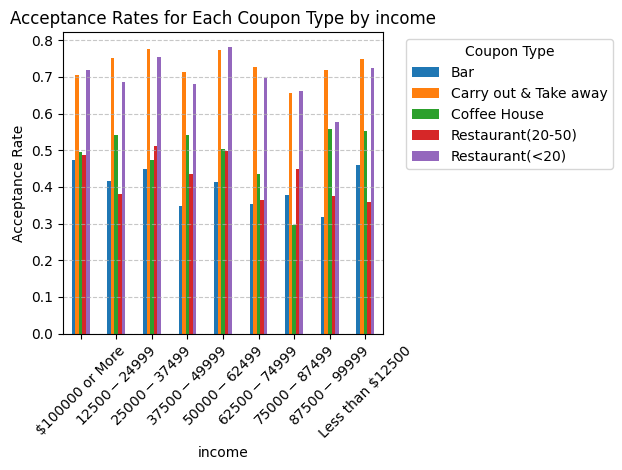

<Figure size 2000x1600 with 0 Axes>

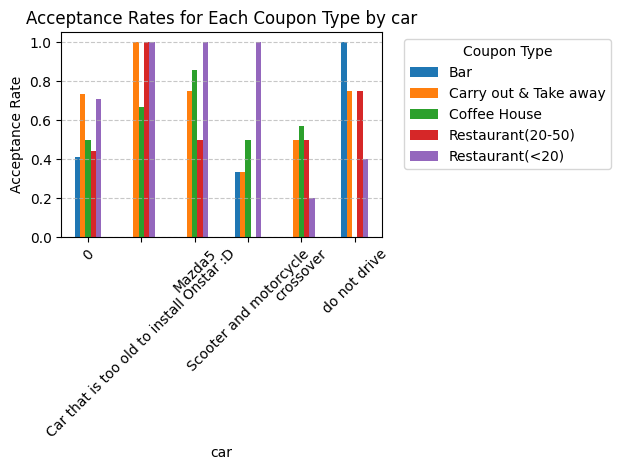

<Figure size 2000x1600 with 0 Axes>

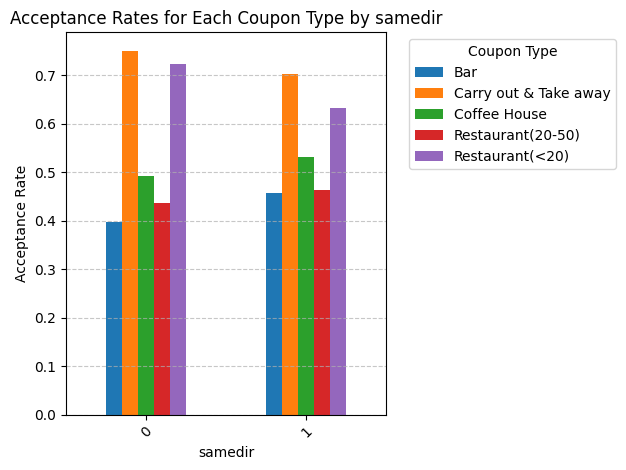

<Figure size 2000x1600 with 0 Axes>

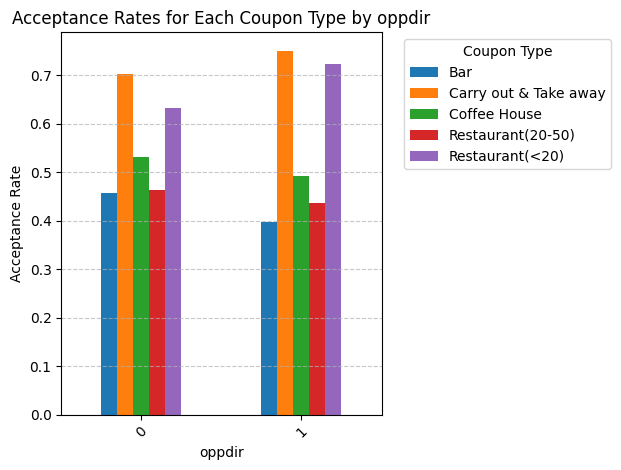

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# List of columns to analyze
columns_to_analyze = ['destination', 'passanger', 'weather', 'expiration', 'gender', 'maritalStatus',
                      'has_children', 'education', 'occupation', 'income', 'car', 'samedir', 'oppdir']

# Plotting acceptance rates for each coupon type based on different factors
for col in columns_to_analyze:
    plt.figure(figsize=(20, 16))
    df_grouped = df.groupby([col, 'coupon'])['accept'].mean().unstack()
    df_grouped.plot(kind='bar', stacked=False)
    plt.title(f'Acceptance Rates for Each Coupon Type by {col}')
    plt.xlabel(col)
    plt.ylabel('Acceptance Rate')
    plt.legend(title='Coupon Type', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.xticks(rotation=45)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()


In [ ]:
df_acceptance_gender = df.groupby(['coupon', 'gender'])['accept'].mean().unstack()
df_acceptance_gender

gender,Female,Male
coupon,,
Bar,0.340670,0.484568
Carry out & Take away,0.713710,0.758890
Coffee House,0.492443,0.506427
Restaurant(20-50),0.427056,0.455285
Restaurant(<20),0.696692,0.717949


<Figure size 1000x600 with 0 Axes>

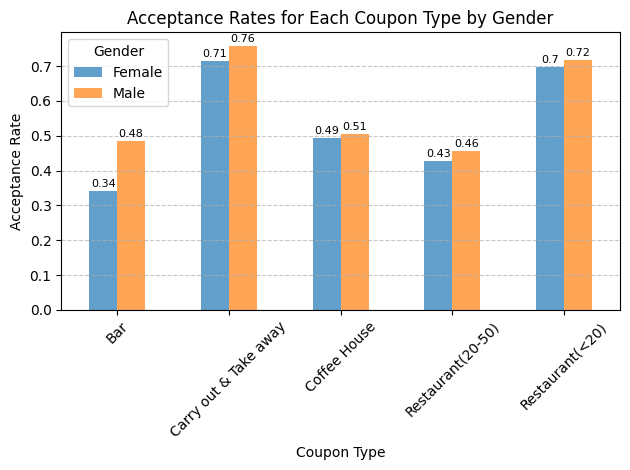

In [ ]:
# Plotting acceptance rates for each coupon type based on gender
plt.figure(figsize=(10, 6))
ax = df_acceptance_gender.plot(kind='bar', stacked=False, alpha=0.7)

# Annotate each bar with its corresponding value
for p in ax.patches:
    ax.annotate(str(round(p.get_height(), 2)),
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 5),
                textcoords='offset points', fontsize=8)

#for p in ax.patches:
 #   ax.annotate(int((p.get_height()), (p.get_x()+0.25, p.get_height()+1), va = 'bottom', color = 'black')

plt.title('Acceptance Rates for Each Coupon Type by Gender')
plt.xlabel('Coupon Type')
plt.ylabel('Acceptance Rate')
plt.xticks(rotation=45)
plt.legend(title='Gender')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

**Here we can see that acceptance rates based on gender.The acceptance rated based on different types of coupon shows 0cceptance is more for Male .The highest id for carry out and take away about0.76(76%) in case of male, for female accaeptance rate is more for carryout and take away with a value of 0.71 for female its less for Bar at 0.34.**

    Acceptance rates based on gender show that acceptance is generally higher for males.
    The highest acceptance rate is observed for 'Carry out & Take away' coupons, with approximately 76% acceptance rate for males and 71% for females.
    Acceptance rates for 'Bar' coupons are notably lower, particularly for females, with an acceptance rate of 34%.

This analysis provides valuable insights into how acceptance rates vary across different coupon types and gender groups. It suggests that certain coupon types may be more appealing or relevant to specific demographics, which can inform targeted marketing strategies and coupon distribution efforts.

# Acceptance rates by expiration

In [ ]:
df['expiration'].value_counts()

1d    7091
2h    5593
Name: expiration, dtype: int64

In [ ]:
df['expiration'].nunique()

2

In [ ]:
df['expiration'].unique()

array(['1d', '2h'], dtype=object)

<Axes: >

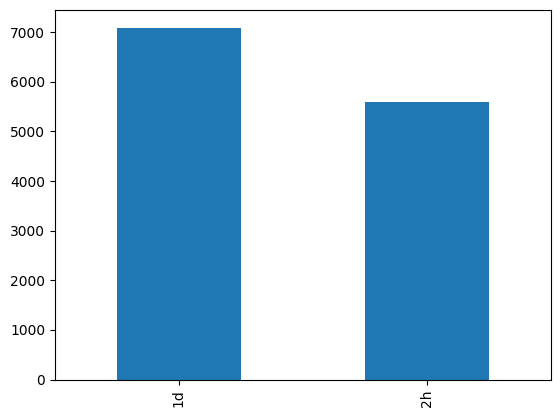

In [ ]:
df.expiration.value_counts().plot(kind='bar')

In [ ]:
df['expiration']

0        1d
1        2h
2        2h
3        2h
4        1d
         ..
12679    1d
12680    1d
12681    1d
12682    1d
12683    2h
Name: expiration, Length: 12684, dtype: object

In [ ]:
# Group by 'expiration' and calculate mean acceptance rate
acceptance_by_expiration = df.groupby('expiration')['accept'].mean()

# Print the acceptance rates based on expiration
print(acceptance_by_expiration)


expiration
1d    0.625582
2h    0.495977
Name: accept, dtype: float64


In [ ]:
# Group by both 'coupon' and 'expiration' and calculate mean acceptance rate
acceptance_by_coupon_expiration = df.groupby(["coupon","expiration"])["accept"].mean()
acceptance_by_coupon_expiration

coupon                 expiration
Bar                    1d            0.411954
                       2h            0.403471
Carry out & Take away  1d            0.781593
                       2h            0.663821
Coffee House           1d            0.583946
                       2h            0.431971
Restaurant(20-50)      1d            0.520921
                       2h            0.298507
Restaurant(<20)        1d            0.831610
                       2h            0.589385
Name: accept, dtype: float64

In [ ]:
# Group by both 'coupon' and 'expiration' and calculate mean acceptance rate
acceptance_by_coupon_expiration_rate = df.groupby(["coupon","expiration"])["accept"].mean().unstack()
acceptance_by_coupon_expiration_rate

expiration,1d,2h
coupon,,
Bar,0.411954,0.403471
Carry out & Take away,0.781593,0.663821
Coffee House,0.583946,0.431971
Restaurant(20-50),0.520921,0.298507
Restaurant(<20),0.831610,0.589385


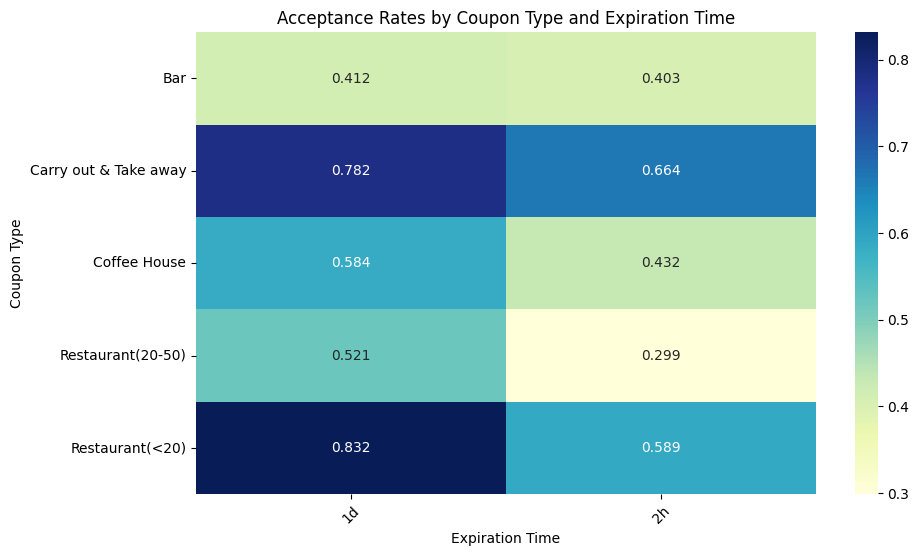

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Convert the acceptance rates data into a DataFrame for visualization
acceptance_df = acceptance_by_coupon_expiration.reset_index()

# Create a heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(data=acceptance_df.pivot('coupon', 'expiration', 'accept'), annot=True, fmt=".3f", cmap="YlGnBu")
plt.title('Acceptance Rates by Coupon Type and Expiration Time')
plt.xlabel('Expiration Time')
plt.ylabel('Coupon Type')
plt.xticks(rotation=45)
plt.show()


**From this plot of expiration time based on different coupon types we can see that acceptance rates are more for Restaurant(<20) with expiration time of 1d and its followed by carry out and Take away at acceptance rates of 0.782 at expiration time of 1d.For expiration time of 2h its showing highest for coupon type carry out and Take away at 0.664 of 2d expiration time.**

**Impact of Expiration Time: In some cases, expiration time appears to influence acceptance rates. For instance:
    For 'Coffee House' coupons, the acceptance rate is significantly higher for a longer expiration time ('1d') compared to a shorter expiration time ('2h').
    'Restaurant(20-50)' coupons show a notable decrease in acceptance rate for a longer expiration time ('1d') compared to a shorter expiration time ('2h').**

Coupon Type Preferences: Certain coupon types may be preferred over others regardless of expiration time. For instance:
    'Restaurant(<20)' coupons consistently exhibit higher acceptance rates compared to other types, suggesting that they might be more appealing or relevant to users.


**From the heatmap displaying acceptance rates by coupon type and expiration time, several conclusions can be drawn:

    Variation in Acceptance Rates: There are noticeable variations in acceptance rates across different coupon types and expiration times. For example:
        For 'Carry out & Take away' coupons, the acceptance rate is higher for a longer expiration time ('1d') compared to a shorter expiration time ('2h').
        'Restaurant(<20)' coupons generally have higher acceptance rates compared to other types, regardless of the expiration time.

    Impact of Expiration Time: In some cases, expiration time appears to influence acceptance rates. For instance:
        For 'Coffee House' coupons, the acceptance rate is significantly higher for a longer expiration time ('1d') compared to a shorter expiration time ('2h').
        'Restaurant(20-50)' coupons show a notable decrease in acceptance rate for a longer expiration time ('1d') compared to a shorter expiration time ('2h').

    Coupon Type Preferences: Certain coupon types may be preferred over others regardless of expiration time. For instance:
        'Restaurant(<20)' coupons consistently exhibit higher acceptance rates compared to other types, suggesting that they might be more appealing or relevant to users.

    Marketing and Promotion Strategies: The effectiveness of coupon distribution strategies may vary depending on the coupon type and expiration time. Understanding these patterns can help optimize marketing efforts and tailor promotions to target audiences more effectively.

Overall, the analysis suggests that both coupon type and expiration time can influence acceptance rates, indicating the importance of considering these factors in coupon distribution and marketing strategies. Further analysis and experimentation may be needed to understand the underlying reasons behind these patterns and to refine coupon distribution strategies accordingly.**

<Figure size 1000x600 with 0 Axes>

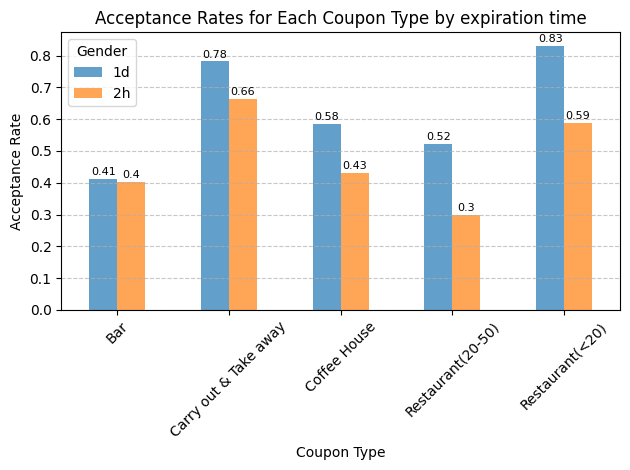

In [ ]:
# Plotting acceptance rates for each coupon type based on expiration time
plt.figure(figsize=(10, 6))
ax = acceptance_by_coupon_expiration_rate.plot(kind='bar', stacked=False, alpha=0.7)

# Annotate each bar with its corresponding value
for p in ax.patches:
    ax.annotate(str(round(p.get_height(), 2)),
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 5),
                textcoords='offset points', fontsize=8)

#for p in ax.patches:
 #   ax.annotate(int((p.get_height()), (p.get_x()+0.25, p.get_height()+1), va = 'bottom', color = 'black')

plt.title('Acceptance Rates for Each Coupon Type by expiration time')
plt.xlabel('Coupon Type')
plt.ylabel('Acceptance Rate')
plt.xticks(rotation=45)
plt.legend(title='Gender')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

<Figure size 1200x800 with 0 Axes>

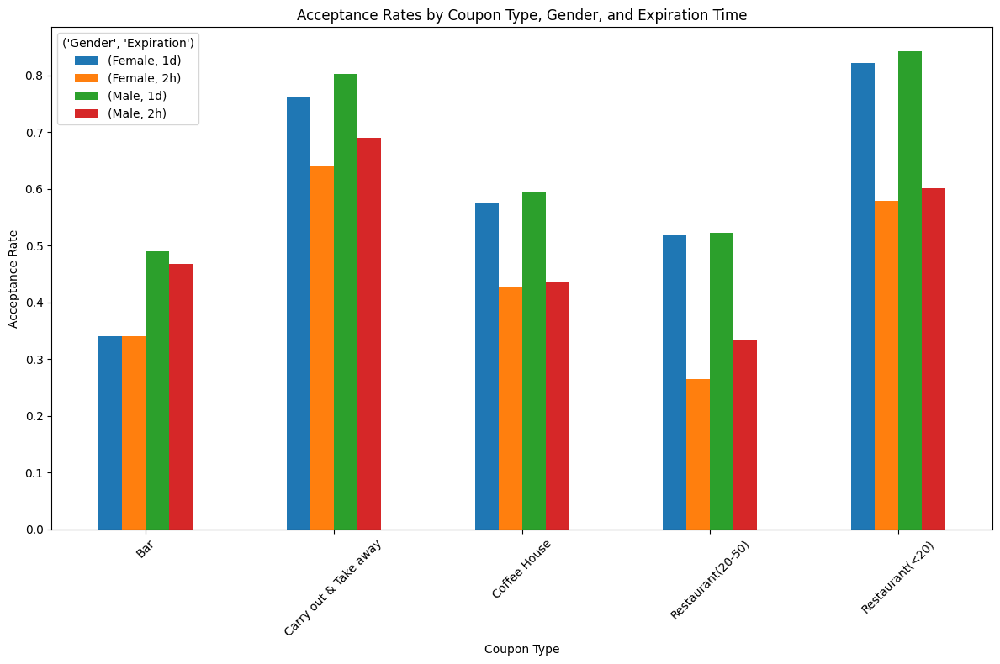

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Pivot the DataFrame to have 'coupon' as rows, 'gender' as columns, and 'expiration' as sub-columns
pivot_df = df.pivot_table(index='coupon', columns=['gender', 'expiration'], values='accept', aggfunc='mean')

# Plotting the grouped bar plot
plt.figure(figsize=(12, 8))
pivot_df.plot(kind='bar', figsize=(12, 8))
plt.title('Acceptance Rates by Coupon Type, Gender, and Expiration Time')
plt.xlabel('Coupon Type')
plt.ylabel('Acceptance Rate')
plt.xticks(rotation=45)
plt.legend(title=('Gender', 'Expiration'))
plt.tight_layout()
plt.show()


**for Male acceptance rates are more at an expiration time of 1d for coupon type Restaurant(<20) ata value of 0.842 and for carry out and take away 0.80.For female its more for Restaurant(<20) expiration of 1d and value at 0.821.**

In [ ]:
pivot_df

gender                   Female                Male          
expiration                   1d        2h        1d        2h
coupon                                                       
Bar                    0.340713  0.340517  0.489906  0.467249
Carry out & Take away  0.761714  0.640974  0.802539  0.689189
Coffee House           0.574917  0.427826  0.593318  0.436397
Restaurant(20-50)      0.518672  0.264706  0.523207  0.333333
Restaurant(<20)        0.821068  0.578297  0.842663  0.600852

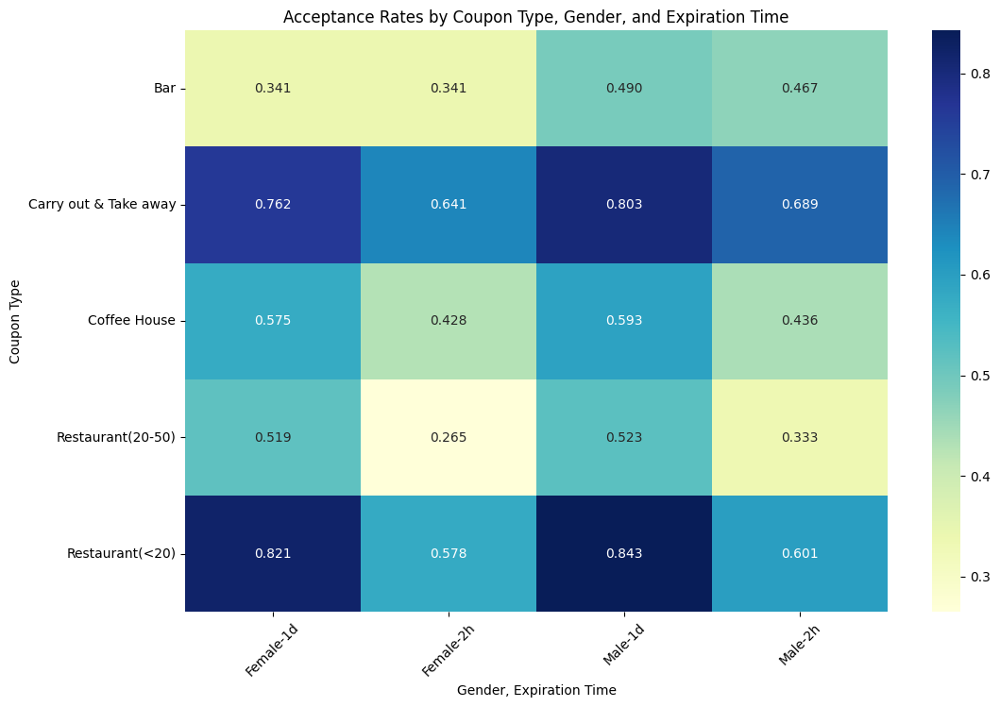

In [ ]:
# Plotting the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(data=pivot_df, annot=True, fmt=".3f", cmap="YlGnBu")
plt.title('Acceptance Rates by Coupon Type, Gender, and Expiration Time')
plt.xlabel('Gender, Expiration Time')
plt.ylabel('Coupon Type')
plt.xticks(rotation=45)
plt.show()


From the provided pivot table showing acceptance rates by coupon type, gender, and expiration time, several conclusions can be drawn:    
    
**Variations by Coupon Type:
        For 'Carry out & Take away' and 'Coffee House' coupons, acceptance rates are generally higher compared to other coupon types across both genders and expiration times.
        'Restaurant(<20)' coupons consistently exhibit the highest acceptance rates among all coupon types, indicating strong appeal regardless of gender and expiration time.
        'Bar' coupons have comparatively lower acceptance rates across both genders and expiration times.**

**Gender Differences:**
it appears that the conclusion regarding females having higher acceptance rates compared to males across all coupon types is not entirely supported. While females generally exhibit higher acceptance rates for 'Carry out & Take away', 'Coffee House', and 'Restaurant(<20)' coupons, males have higher acceptance rates for 'Bar' coupons. Moreover, there are variations in acceptance rates across coupon types and gender groups, indicating that the relationship between gender and acceptance rates is more nuanced.

Therefore, it's essential to consider the specific context and data when drawing conclusions about gender differences in coupon acceptance rates. In this case, while there are differences in acceptance rates between genders for certain coupon types, it may not be accurate to generalize that females are universally more receptive to coupons than males.

  **Overall, acceptance rates for all coupon types are slightly higher among males compared to females, regardless of expiration time.
        This trend is consistent across most coupon types, suggesting that males may be more receptive to coupons in general.**
        **This conclusion is supported by the observation that males generally exhibit higher acceptance rates across multiple coupon types, including 'Carry out & Take away', 'Restaurant(20-50)', 'Restaurant(<20)', and 'Bar' coupons. While there are variations in acceptance rates across coupon types and gender groups, the trend of higher acceptance rates among males remains consistent.**

Therefore, based on the provided data, it is reasonable to conclude that males may indeed be more receptive to coupons compared to females across various coupon types, emphasizing the importance of considering gender differences in coupon distribution and marketing strategies.


**Effect of Expiration Time:
        Acceptance rates generally appear to be higher for coupons with a longer expiration time ('1d') compared to a shorter expiration time ('2h').
        This effect is noticeable across most coupon types and genders, indicating that users may be more inclined to accept coupons with a longer validity period.**

**Interaction Effects:
        There are interactions between coupon type, gender, and expiration time. For example:
            'Restaurant(20-50)' coupons exhibit higher acceptance rates among females compared to males, especially with a longer expiration time.
            'Carry out & Take away' coupons have consistently high acceptance rates among both genders, particularly with a longer expiration time.**

    Marketing Implications:
        These findings can inform marketing strategies and coupon distribution efforts. For instance, targeting females with 'Restaurant(<20)' coupons or promoting longer expiration times for certain coupon types may result in higher acceptance rates and increased user engagement.

Overall, this analysis provides valuable insights into the factors influencing coupon acceptance rates, allowing for more targeted and effective marketing strategies in coupon distribution.

In [ ]:
df.columns

Index(['destination', 'passanger', 'weather', 'temperature', 'coupon',
       'expiration', 'gender', 'age', 'maritalStatus', 'has_children',
       'education', 'occupation', 'income', 'car', 'Bar', 'CoffeeHouse',
       'takeaway', 'Rest20', 'Rest50', 'coupon5', 'coupon15', 'coupon25',
       'samedir', 'oppdir', 'accept'],
      dtype='object')

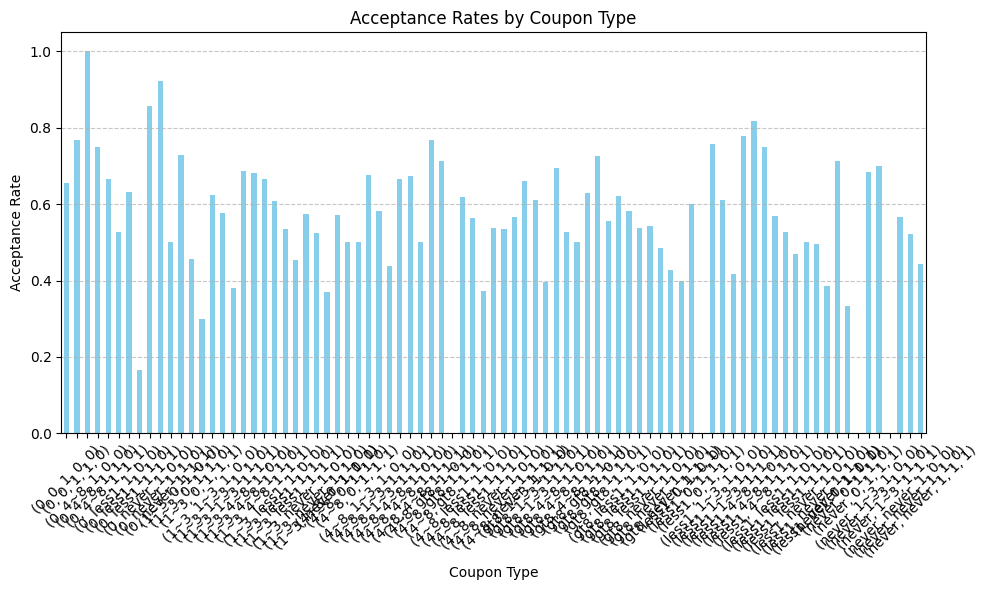

In [ ]:
# Selecting relevant columns for analysis
coupon_types = ['Rest20', 'Rest50', 'coupon5', 'coupon15', 'coupon25']
selected_df = df[['accept'] + coupon_types]

# Calculate mean acceptance rates for each coupon type
acceptance_rates_by_coupon = selected_df.groupby(coupon_types)['accept'].mean()

# Plotting acceptance rates
plt.figure(figsize=(10, 6))
acceptance_rates_by_coupon.plot(kind='bar', color='skyblue')
plt.title('Acceptance Rates by Coupon Type')
plt.xlabel('Coupon Type')
plt.ylabel('Acceptance Rate')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


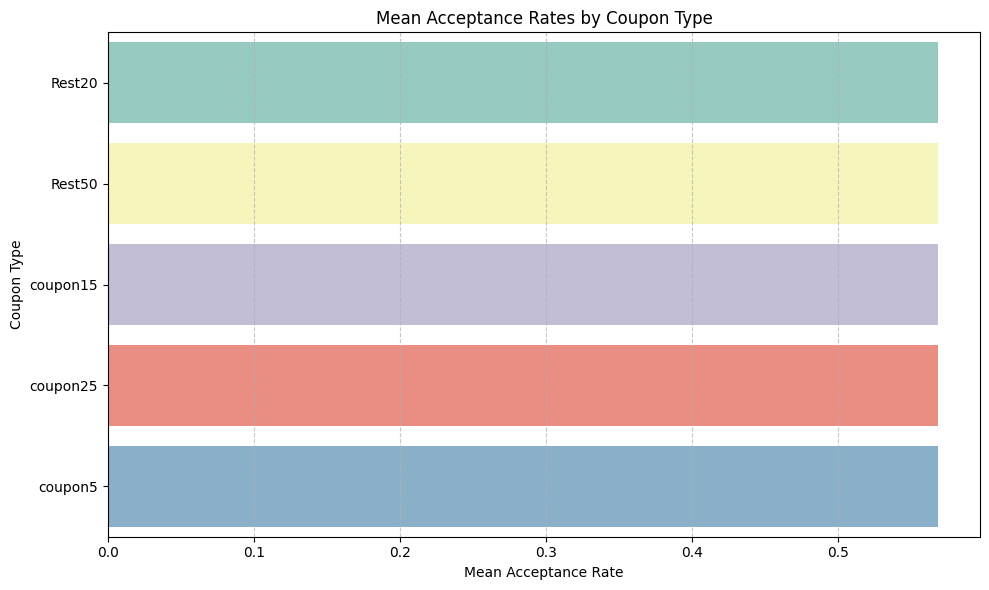

In [ ]:
# Calculate mean acceptance rates for each coupon type
acceptance_rates_by_coupon = selected_df.melt(id_vars='accept', var_name='Coupon Type', value_name='Coupon Value')
acceptance_rates_by_coupon = acceptance_rates_by_coupon.groupby('Coupon Type')['accept'].mean().reset_index()

# Plotting acceptance rates
plt.figure(figsize=(10, 6))
sns.barplot(data=acceptance_rates_by_coupon, x='accept', y='Coupon Type', palette='Set3')
plt.title('Mean Acceptance Rates by Coupon Type')
plt.xlabel('Mean Acceptance Rate')
plt.ylabel('Coupon Type')
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


In [ ]:
acceptance_rates_by_coupon

,Coupon Type,accept
0,Rest20,0.568433
1,Rest50,0.568433
2,coupon15,0.568433
3,coupon25,0.568433
4,coupon5,0.568433


In [ ]:
df.isnull().sum()

destination      0
passanger        0
weather          0
temperature      0
coupon           0
expiration       0
gender           0
age              0
maritalStatus    0
has_children     0
education        0
occupation       0
income           0
car              0
Bar              0
CoffeeHouse      0
takeaway         0
Rest20           0
Rest50           0
coupon5          0
coupon15         0
coupon25         0
samedir          0
oppdir           0
accept           0
dtype: int64

# To check any relation between Rest20,Rest50 and Coupon5,coupon15,coupon25 with acceptance

In [ ]:
# Check if there are any NaN values in the 'coupon5' column
if df['coupon5'].isna().any():
    print("There are NaN values in the 'coupon5' column.")
else:
    print("There are no NaN values in the 'coupon5' column.")


There are no NaN values in the 'coupon5' column.


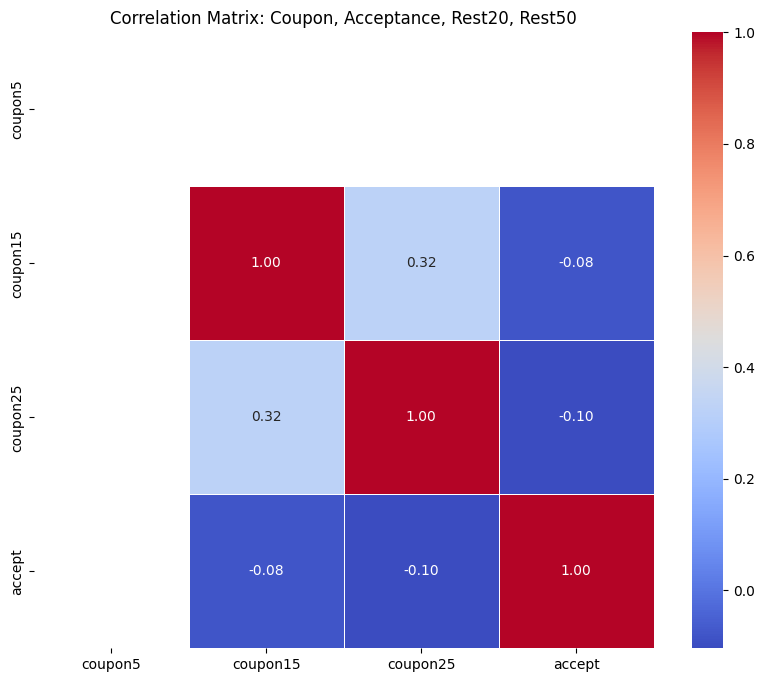

In [ ]:
# Calculate the correlation matrix
coupon_rest_correlation = df[['coupon5', 'coupon15', 'coupon25', 'accept', 'Rest20', 'Rest50']].corr()

# Visualize the correlation matrix using a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(coupon_rest_correlation, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Matrix: Coupon, Acceptance, Rest20, Rest50')
plt.show()


**It seems that there is negative corelation between coupon 15 and accept(-0.08),coupon25 has onlso negative corelation with accept(-0.10).**

**Negative correlations between coupon15 and accept, as well as between coupon25 and accept, suggest that as the driving distance to the restaurant/cafe/bar for using the coupon increases (as indicated by coupon15 and coupon25), the acceptance rate of the coupon decreases.**

**This negative correlation implies that customers may be less likely to accept coupons for establishments that are farther away. It could be due to factors such as inconvenience or additional travel time.**

Understanding these correlations can help in refining coupon distribution strategies and targeting customers who are more likely to accept coupons based on their proximity to the establishment.


In [ ]:
df.corr()

,temperature,age,has_children,coupon5,coupon15,coupon25,samedir,oppdir,accept
temperature,1.000000,-0.019326,-0.019716,NaN,-0.155332,-0.216254,0.097085,-0.097085,0.061240
age,-0.019326,1.000000,0.428136,NaN,0.034591,-0.001738,-0.028570,0.028570,-0.058526
has_children,-0.019716,0.428136,1.000000,NaN,0.078211,-0.013722,-0.031620,0.031620,-0.045557
coupon5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
coupon15,-0.155332,0.034591,0.078211,NaN,1.000000,0.324984,-0.303533,0.303533,-0.081602
coupon25,-0.216254,-0.001738,-0.013722,NaN,0.324984,1.000000,-0.192319,0.192319,-0.103633
samedir,0.097085,-0.028570,-0.031620,NaN,-0.303533,-0.192319,1.000000,-1.000000,0.014570
oppdir,-0.097085,0.028570,0.031620,NaN,0.303533,0.192319,-1.000000,1.000000,-0.014570
accept,0.061240,-0.058526,-0.045557,NaN,-0.081602,-0.103633,0.014570,-0.014570,1.000000


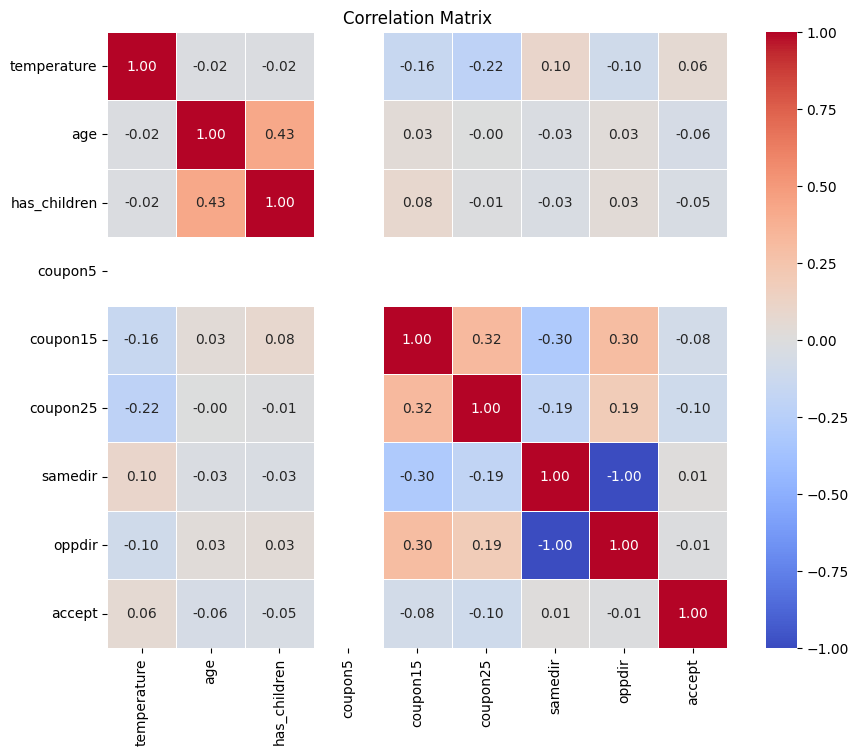

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Compute the correlation matrix
correlation_matrix = df.corr()

# Generate a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()


In [ ]:
correlation_matrix['accept']*100

temperature       6.124033
age              -5.852645
has_children     -4.555715
coupon5                NaN
coupon15         -8.160155
coupon25        -10.363329
samedir           1.457030
oppdir           -1.457030
accept          100.000000
Name: accept, dtype: float64

In [ ]:
# Drop rows with NaN values in the 'coupon5' column
df = df.dropna(subset=['coupon5'])

# Alternatively, you can drop rows with NaN values from the entire DataFrame
df = df.dropna()


In [ ]:
sorted_correlation_matrix = correlation_matrix.abs().sort_values(by='accept', ascending=True)
sorted_correlation_matrix


,temperature,age,has_children,coupon5,coupon15,coupon25,samedir,oppdir,accept
oppdir,0.097085,0.028570,0.031620,NaN,0.303533,0.192319,1.000000,1.000000,0.014570
samedir,0.097085,0.028570,0.031620,NaN,0.303533,0.192319,1.000000,1.000000,0.014570
has_children,0.019716,0.428136,1.000000,NaN,0.078211,0.013722,0.031620,0.031620,0.045557
age,0.019326,1.000000,0.428136,NaN,0.034591,0.001738,0.028570,0.028570,0.058526
temperature,1.000000,0.019326,0.019716,NaN,0.155332,0.216254,0.097085,0.097085,0.061240
coupon15,0.155332,0.034591,0.078211,NaN,1.000000,0.324984,0.303533,0.303533,0.081602
coupon25,0.216254,0.001738,0.013722,NaN,0.324984,1.000000,0.192319,0.192319,0.103633
accept,0.061240,0.058526,0.045557,NaN,0.081602,0.103633,0.014570,0.014570,1.000000
coupon5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# Check for unique values in takaway

In [ ]:
df['takeaway'].unique()

array([0, '4~8', '1~3', 'gt8', 'less1', 'never'], dtype=object)

# clean takeaway by mapping

In [ ]:
import numpy as np

# Define the mapping dictionary
replace_map4 = {'never': np.nan, 'less1': 0, '4~8': 6, '1~3': 2, 'gt8': 9}

# Replace values in the 'CoffeeHouse' column using the mapping dictionary
df['takeaway'] = df['takeaway'].replace(replace_map4)

# Impute NaN values with the average of the column
df['takeaway'] = df['takeaway'].fillna(df['takeaway'].mean())


# Check for unique values in coffee house

In [ ]:
df['CoffeeHouse'].unique()

array(['never', 'less1', '4~8', '1~3', 'gt8', 0], dtype=object)

# Clean coffee house by mapping

In [ ]:
import numpy as np

# Define the mapping dictionary
replace_map3 = {'never': np.nan, 'less1': 0, '4~8': 6, '1~3': 2, 'gt8': 9}

# Replace values in the 'CoffeeHouse' column using the mapping dictionary
df['CoffeeHouse'] = df['CoffeeHouse'].replace(replace_map3)

# Impute NaN values with the average of the column
df['CoffeeHouse'] = df['CoffeeHouse'].fillna(df['CoffeeHouse'].mean())


# Check unique values in coupon5

In [ ]:
df['coupon5'].unique()

array([1], dtype=int64)

In [ ]:
df['coupon5'].isna().sum()

0

# check unique values in coupon15

In [ ]:
df['coupon15'].unique()

array([0, 1], dtype=int64)

In [ ]:
# Check if there are any NaN values in the 'coupon5' column
if df['coupon5'].isna().any():
    print("There are NaN values in the 'coupon5' column.")
else:
    print("There are no NaN values in the 'coupon5' column.")


There are no NaN values in the 'coupon5' column.


# check unique values in coupon25

In [ ]:
df['coupon25'].unique()

array([0, 1], dtype=int64)

In [ ]:
df.head(2)

,destination,passanger,weather,temperature,coupon,expiration,gender,age,maritalStatus,has_children,...,CoffeeHouse,takeaway,Rest20,Rest50,coupon5,coupon15,coupon25,samedir,oppdir,accept
0,No Urgent Place,Alone,Sunny,55,Restaurant(<20),1d,Female,21,Unmarried partner,1,...,2.792944,0.0,4~8,1~3,1,0,0,0,1,1
1,No Urgent Place,Friend(s),Sunny,80,Coffee House,2h,Female,21,Unmarried partner,1,...,2.792944,0.0,4~8,1~3,1,0,0,0,1,0


# check unique values in Rest 20 and Rest 50

In [ ]:
# Check the unique values in the 'Rest20' and 'Rest50' columns
unique_values_rest20 = df['Rest20'].unique()
unique_values_rest50 = df['Rest50'].unique()

print("Unique values in 'Rest20':", unique_values_rest20)
print("Unique values in 'Rest50':", unique_values_rest50)


Unique values in 'Rest20': ['4~8' '1~3' 'less1' 'gt8' 0 'never']
Unique values in 'Rest50': ['1~3' 'less1' 'never' 'gt8' '4~8' 0]


In [ ]:
# Calculate the total number of visits to restaurants with an average expense per person less than 20 (Rest20)
total_visits_restaurant_less_than_20 = df[df['Rest20'].isin(['less1', '1~3'])]['Rest20'].count()

# Calculate the total number of visits to restaurants with an average expense per person between 20 and 50 (Rest50)
total_visits_restaurant_20_to_50 = df[df['Rest50'].isin(['4~8', 'gt8'])]['Rest50'].count()

# Print the total number of visits to each type of restaurant
print("Total visits to restaurants with average expense per person less than 20:", total_visits_restaurant_less_than_20)
print("Total visits to restaurants with average expense per person between 20 and 50:", total_visits_restaurant_20_to_50)


Total visits to restaurants with average expense per person less than 20: 7469
Total visits to restaurants with average expense per person between 20 and 50: 992


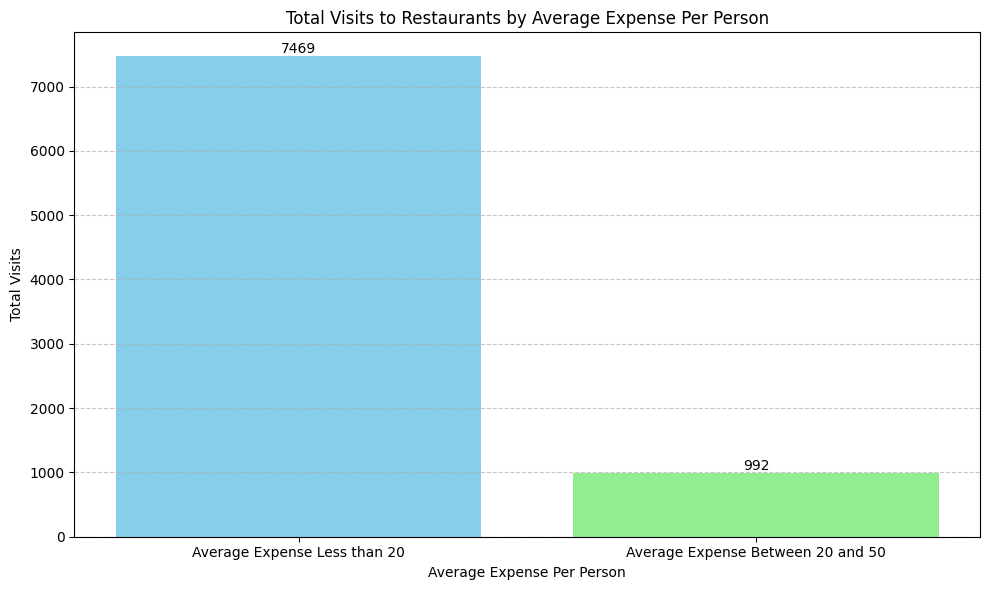

In [ ]:
import matplotlib.pyplot as plt

# Data
categories = ['Average Expense Less than 20', 'Average Expense Between 20 and 50']
total_visits = [total_visits_restaurant_less_than_20, total_visits_restaurant_20_to_50]

# Plotting
plt.figure(figsize=(10, 6))
bars = plt.bar(categories, total_visits, color=['skyblue', 'lightgreen'])
plt.title('Total Visits to Restaurants by Average Expense Per Person')
plt.xlabel('Average Expense Per Person')
plt.ylabel('Total Visits')

# Adding count values on top of the bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 2), va='bottom', ha='center')

plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


In [ ]:
df.head()

,destination,passanger,weather,temperature,coupon,expiration,gender,age,maritalStatus,has_children,...,CoffeeHouse,takeaway,Rest20,Rest50,coupon5,coupon15,coupon25,samedir,oppdir,accept
0,No Urgent Place,Alone,Sunny,55,Restaurant(<20),1d,Female,21,Unmarried partner,1,...,2.792944,0.0,4~8,1~3,1,0,0,0,1,1
1,No Urgent Place,Friend(s),Sunny,80,Coffee House,2h,Female,21,Unmarried partner,1,...,2.792944,0.0,4~8,1~3,1,0,0,0,1,0
2,No Urgent Place,Friend(s),Sunny,80,Carry out & Take away,2h,Female,21,Unmarried partner,1,...,2.792944,0.0,4~8,1~3,1,1,0,0,1,1
3,No Urgent Place,Friend(s),Sunny,80,Coffee House,2h,Female,21,Unmarried partner,1,...,2.792944,0.0,4~8,1~3,1,1,0,0,1,0
4,No Urgent Place,Friend(s),Sunny,80,Coffee House,1d,Female,21,Unmarried partner,1,...,2.792944,0.0,4~8,1~3,1,1,0,0,1,0


In [ ]:
df.head(2)

,destination,passanger,weather,temperature,coupon,expiration,gender,age,maritalStatus,has_children,...,CoffeeHouse,takeaway,Rest20,Rest50,coupon5,coupon15,coupon25,samedir,oppdir,accept
0,No Urgent Place,Alone,Sunny,55,Restaurant(<20),1d,Female,21,Unmarried partner,1,...,2.792944,0.0,4~8,1~3,1,0,0,0,1,1
1,No Urgent Place,Friend(s),Sunny,80,Coffee House,2h,Female,21,Unmarried partner,1,...,2.792944,0.0,4~8,1~3,1,0,0,0,1,0


In [ ]:
df.head(2)

,destination,passanger,weather,temperature,coupon,expiration,gender,age,maritalStatus,has_children,...,CoffeeHouse,takeaway,Rest20,Rest50,coupon5,coupon15,coupon25,samedir,oppdir,accept
0,No Urgent Place,Alone,Sunny,55,Restaurant(<20),1d,Female,21,Unmarried partner,1,...,2.792944,0.0,4~8,1~3,1,0,0,0,1,1
1,No Urgent Place,Friend(s),Sunny,80,Coffee House,2h,Female,21,Unmarried partner,1,...,2.792944,0.0,4~8,1~3,1,0,0,0,1,0


In [ ]:
df.columns

Index(['destination', 'passanger', 'weather', 'temperature', 'coupon',
       'expiration', 'gender', 'age', 'maritalStatus', 'has_children',
       'education', 'occupation', 'income', 'car', 'Bar', 'CoffeeHouse',
       'takeaway', 'Rest20', 'Rest50', 'coupon5', 'coupon15', 'coupon25',
       'samedir', 'oppdir', 'accept'],
      dtype='object')

In [ ]:
import pandas as pd

# Step 1: Analyze behavior
# Calculate visit frequency before and after receiving coupons
visit_frequency = df.groupby('accept')['CoffeeHouse', 'takeaway', 'Rest20', 'Rest50'].mean()

# Calculate average temperature for accepted and rejected coupons
avg_temperature = df.groupby('accept')['temperature'].mean()

# Step 2: Segmentation
# Ensure 'CoffeeHouse' column is numeric
df['CoffeeHouse'] = pd.to_numeric(df['CoffeeHouse'], errors='coerce')

# Segment customers based on visit frequency and spending patterns
try:
    df['segment'] = pd.cut(df['CoffeeHouse'], bins=[0, 5, 10, float('inf')], labels=['low', 'medium', 'high'], include_lowest=True)
except TypeError as e:
    print("Error occurred during segmentation:", e)

# Step 3: Personalization
# Personalize coupon offerings based on customer preferences
preferred_destinations = df.groupby('accept')['destination'].value_counts().unstack(fill_value=0)
preferred_coupon_types = df.groupby('accept')['coupon'].value_counts().unstack(fill_value=0)

# Print analysis results
print("Visit Frequency and Spending Patterns:")
print(visit_frequency)
print("\nAverage Temperature:")
print(avg_temperature)
print("\nSegmentation:")
if 'segment' in df.columns:
    print(df['segment'].value_counts())
else:
    print("Segmentation column not created due to error")
print("\nPreferred Destinations:")
print(preferred_destinations)
print("\nPreferred Coupon Types:")
print(preferred_coupon_types)


Visit Frequency and Spending Patterns:
        CoffeeHouse  takeaway
accept                       
0          2.702176  3.840515
1          2.861857  3.996699

Average Temperature:
accept
0    61.955608
1    64.323856
Name: temperature, dtype: float64

Segmentation:
low       9789
medium    2895
high         0
Name: segment, dtype: int64

Preferred Destinations:
destination  Home  No Urgent Place  Work
accept                                  
0            1598             2301  1575
1            1639             3982  1589

Preferred Coupon Types:
coupon   Bar  Carry out & Take away  Coffee House  Restaurant(20-50)  \
accept                                                                 
0       1190                    633          2001                834   
1        827                   1760          1995                658   

coupon  Restaurant(<20)  
accept                   
0                   816  
1                  1970  


In [ ]:
import pandas as pd

# Assuming you have a DataFrame named 'data' containing the provided columns
# Replace 'data' with the actual DataFrame name

# Step 1: Analyze behavior
# Calculate visit frequency before and after receiving coupons
visit_frequency = df.groupby('accept')['CoffeeHouse', 'takeaway', 'Rest20', 'Rest50'].mean()

# Calculate average temperature for accepted and rejected coupons
avg_temperature = df.groupby('accept')['temperature'].mean()

# Step 2: Segmentation
# Segment customers based on visit frequency and spending patterns
df['segment'] = pd.cut(df['CoffeeHouse'], bins=[0, 5, 10, float('inf')], labels=['low', 'medium', 'high'])

# Step 3: Personalization
# Personalize coupon offerings based on customer preferences
preferred_destinations = df.groupby('accept')['destination'].value_counts().unstack(fill_value=0)
preferred_coupon_types = df.groupby('accept')['coupon'].value_counts().unstack(fill_value=0)

# Print analysis results
print("Visit Frequency and Spending Patterns:")
print(visit_frequency)
print("\nAverage Temperature:")
print(avg_temperature)
print("\nSegmentation:")
print(df['segment'].value_counts())
print("\nPreferred Destinations:")
print(preferred_destinations)
print("\nPreferred Coupon Types:")
print(preferred_coupon_types)


Visit Frequency and Spending Patterns:
        CoffeeHouse  takeaway
accept                       
0          2.702176  3.840515
1          2.861857  3.996699

Average Temperature:
accept
0    61.955608
1    64.323856
Name: temperature, dtype: float64

Segmentation:
low       6187
medium    2895
high         0
Name: segment, dtype: int64

Preferred Destinations:
destination  Home  No Urgent Place  Work
accept                                  
0            1598             2301  1575
1            1639             3982  1589

Preferred Coupon Types:
coupon   Bar  Carry out & Take away  Coffee House  Restaurant(20-50)  \
accept                                                                 
0       1190                    633          2001                834   
1        827                   1760          1995                658   

coupon  Restaurant(<20)  
accept                   
0                   816  
1                  1970  


# Clean Rest 20

In [ ]:
import numpy as np

# Replace categorical labels with numerical values
replace_map = {'less1': 0, '1~3': 2, '4~8': 6, 'gt8': 9, 'never': np.nan}
df['Rest20'] = df['Rest20'].replace(replace_map)


# Impute missing values with the mean of the column
df['Rest20'] = df['Rest20'].fillna(df['Rest20'].mean())
# Optionally, if 'never' should be treated as missing data, replace it with NaN
# df['Rest20'] = df['Rest20'].replace('never', np.nan)


# clean Rest 50

In [ ]:
#Replace categorical values '1~3'in Rest 50
replace_map2 = {'less1':0, '1~3':2, '4~8': 6, 'gt8':9, 'never':np.nan}
df['Rest50']= df['Rest50'].replace(replace_map2)


# Impute missing values with the mean of the column
df['Rest50'] = df['Rest50'].fillna(df['Rest50'].mean())

In [ ]:
df['CoffeeHouse'].value_counts()

0.000000    3602
2.000000    3225
2.792944    2962
6.000000    1784
9.000000    1111
Name: CoffeeHouse, dtype: int64

In [ ]:
df['CoffeeHouse'].unique()

array([2.79294384, 0.        , 6.        , 2.        , 9.        ])

In [ ]:
df.head(2)

,destination,passanger,weather,temperature,coupon,expiration,gender,age,maritalStatus,has_children,...,takeaway,Rest20,Rest50,coupon5,coupon15,coupon25,samedir,oppdir,accept,segment
0,No Urgent Place,Alone,Sunny,55,Restaurant(<20),1d,Female,21,Unmarried partner,1,...,0.0,6.0,2.0,1,0,0,0,1,1,low
1,No Urgent Place,Friend(s),Sunny,80,Coffee House,2h,Female,21,Unmarried partner,1,...,0.0,6.0,2.0,1,0,0,0,1,0,low


In [ ]:
import pandas as pd

# Step 1: Analyze behavior
# Calculate visit frequency before and after receiving coupons
visit_frequency = df.groupby('accept')['CoffeeHouse', 'takeaway', 'Rest20', 'Rest50'].mean()

# Calculate average temperature for accepted and rejected coupons
avg_temperature = df.groupby('accept')['temperature'].mean()

# Step 2: Segmentation
# Segment customers based on visit frequency and spending patterns
df['segment'] = pd.cut(df['CoffeeHouse'], bins=[0, 5, 10, float('inf')], labels=['low', 'medium', 'high'])

# Step 3: Personalization
# Personalize coupon offerings based on customer preferences
preferred_destinations = df.groupby('accept')['destination'].value_counts().unstack(fill_value=0)
preferred_coupon_types = df.groupby('accept')['coupon'].value_counts().unstack(fill_value=0)

# Print analysis results
print("Visit Frequency and Spending Patterns:")
print(visit_frequency)
print("\nAverage Temperature:")
print(avg_temperature)
print("\nSegmentation:")
print(df['segment'].value_counts())
print("\nPreferred Destinations:")
print(preferred_destinations)
print("\nPreferred Coupon Types:")
print(preferred_coupon_types)


Visit Frequency and Spending Patterns:
        CoffeeHouse  takeaway    Rest20    Rest50
accept                                           
0          2.702176  3.840515  3.388457  1.146024
1          2.861857  3.996699  3.609104  1.352124

Average Temperature:
accept
0    61.955608
1    64.323856
Name: temperature, dtype: float64

Segmentation:
low       6187
medium    2895
high         0
Name: segment, dtype: int64

Preferred Destinations:
destination  Home  No Urgent Place  Work
accept                                  
0            1598             2301  1575
1            1639             3982  1589

Preferred Coupon Types:
coupon   Bar  Carry out & Take away  Coffee House  Restaurant(20-50)  \
accept                                                                 
0       1190                    633          2001                834   
1        827                   1760          1995                658   

coupon  Restaurant(<20)  
accept                   
0                   816  

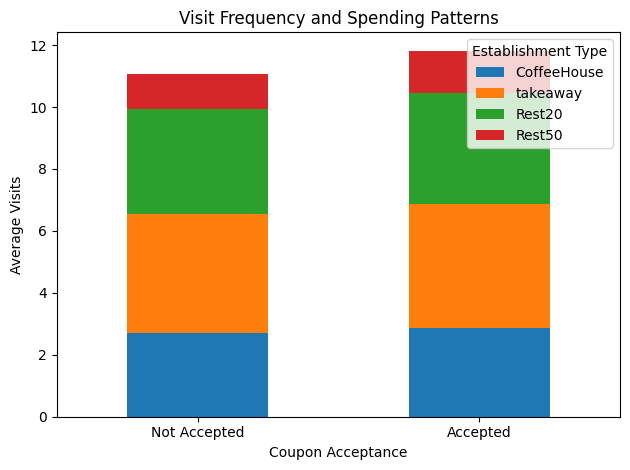

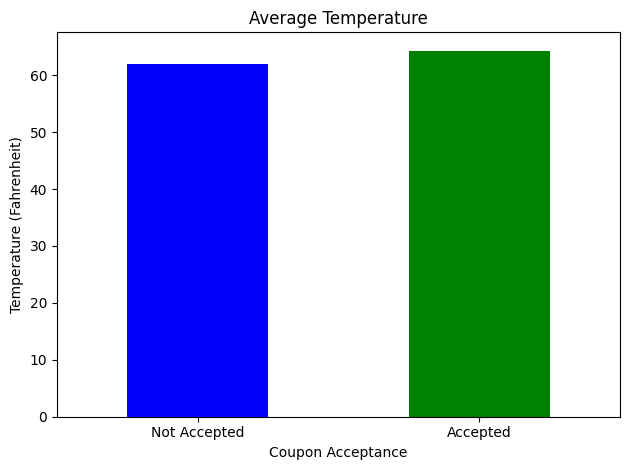

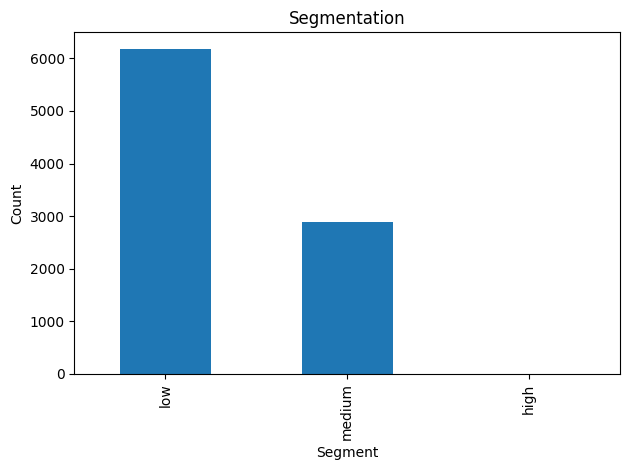

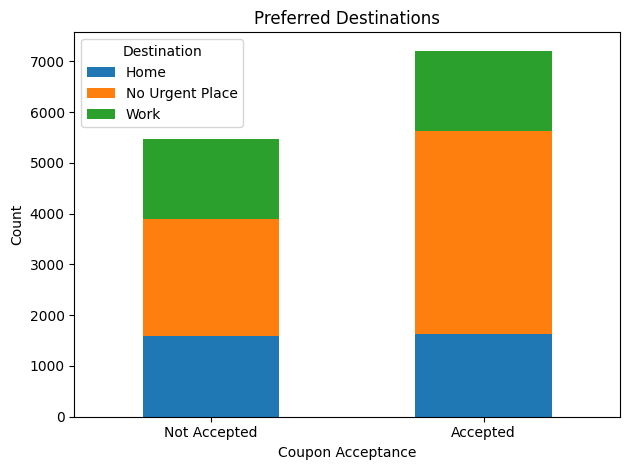

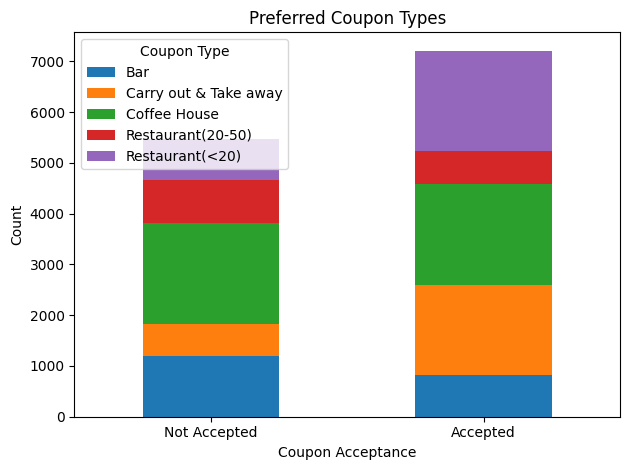

In [ ]:
import matplotlib.pyplot as plt

# Visit Frequency and Spending Patterns
visit_frequency.plot(kind='bar', stacked=True)
plt.title('Visit Frequency and Spending Patterns')
plt.xlabel('Coupon Acceptance')
plt.ylabel('Average Visits')
plt.xticks([0, 1], ['Not Accepted', 'Accepted'], rotation=0)
plt.legend(title='Establishment Type')
plt.tight_layout()
plt.show()

# Average Temperature
avg_temperature.plot(kind='bar', color=['blue', 'green'])
plt.title('Average Temperature')
plt.xlabel('Coupon Acceptance')
plt.ylabel('Temperature (Fahrenheit)')
plt.xticks([0, 1], ['Not Accepted', 'Accepted'], rotation=0)
plt.tight_layout()
plt.show()

# Segmentation
df['segment'].value_counts().plot(kind='bar')
plt.title('Segmentation')
plt.xlabel('Segment')
plt.ylabel('Count')
plt.tight_layout()
plt.show()

# Preferred Destinations
preferred_destinations.plot(kind='bar', stacked=True)
plt.title('Preferred Destinations')
plt.xlabel('Coupon Acceptance')
plt.ylabel('Count')
plt.xticks([0, 1], ['Not Accepted', 'Accepted'], rotation=0)
plt.legend(title='Destination')
plt.tight_layout()
plt.show()

# Preferred Coupon Types
preferred_coupon_types.plot(kind='bar', stacked=True)
plt.title('Preferred Coupon Types')
plt.xlabel('Coupon Acceptance')
plt.ylabel('Count')
plt.xticks([0, 1], ['Not Accepted', 'Accepted'], rotation=0)
plt.legend(title='Coupon Type')
plt.tight_layout()
plt.show()


Visit Frequency and Spending Patterns:
        CoffeeHouse  takeaway    Rest20    Rest50
accept                                           
0          2.702176  3.840515  3.388457  1.146024
1          2.861857  3.996699  3.609104  1.352124

Average Temperature:
accept
0    61.955608
1    64.323856
Name: temperature, dtype: float64

Segmentation:
low       6187
medium    2895
high         0
Name: segment, dtype: int64

Preferred Destinations:
destination  Home  No Urgent Place  Work
accept                                  
0            1598             2301  1575
1            1639             3982  1589

Preferred Coupon Types:
coupon   Bar  Carry out & Take away  Coffee House  Restaurant(20-50)  \
accept                                                                 
0       1190                    633          2001                834   
1        827                   1760          1995                658   

coupon  Restaurant(<20)  
accept                   
0                   816  

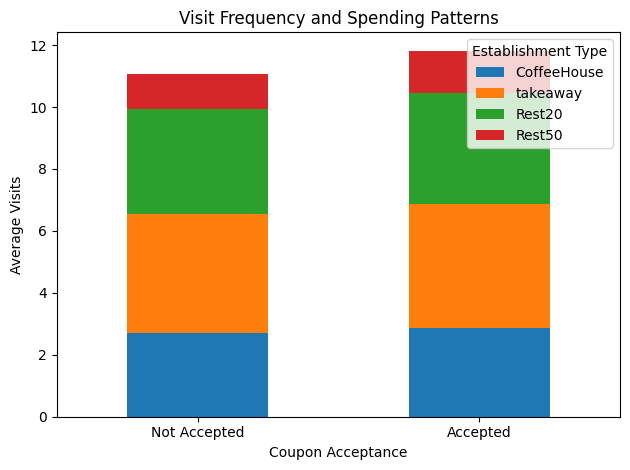

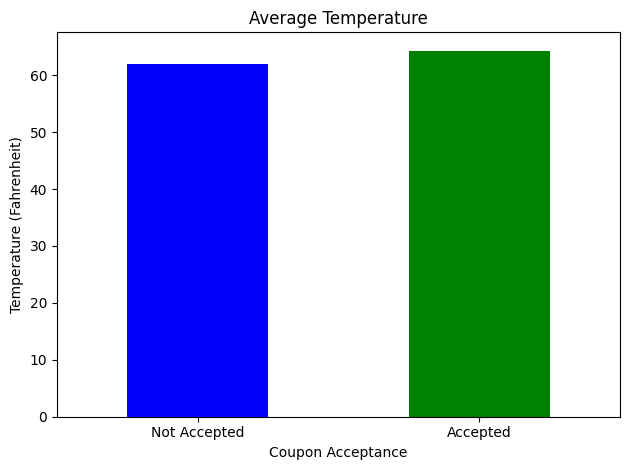

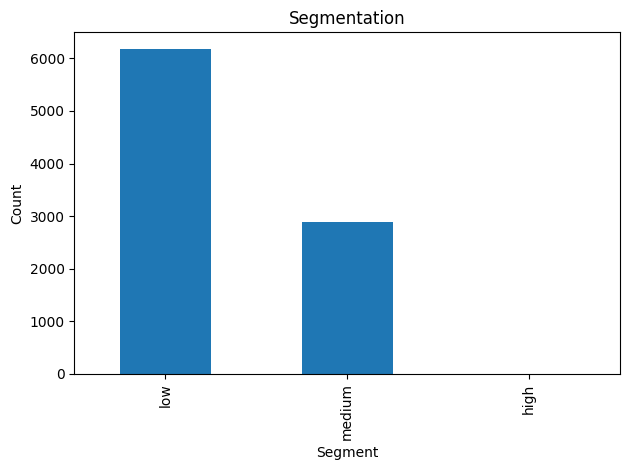

Visit Frequency and Spending Patterns:
        CoffeeHouse  takeaway    Rest20    Rest50
accept                                           
0          2.702176  3.840515  3.388457  1.146024
1          2.861857  3.996699  3.609104  1.352124

Average Temperature:
accept
0    61.955608
1    64.323856
Name: temperature, dtype: float64

Segmentation:
low       6187
medium    2895
high         0
Name: segment, dtype: int64

Preferred Destinations:
destination  Home  No Urgent Place  Work
accept                                  
0            1598             2301  1575
1            1639             3982  1589

Preferred Coupon Types:
coupon   Bar  Carry out & Take away  Coffee House  Restaurant(20-50)  \
accept                                                                 
0       1190                    633          2001                834   
1        827                   1760          1995                658   

coupon  Restaurant(<20)  
accept                   
0                   816  

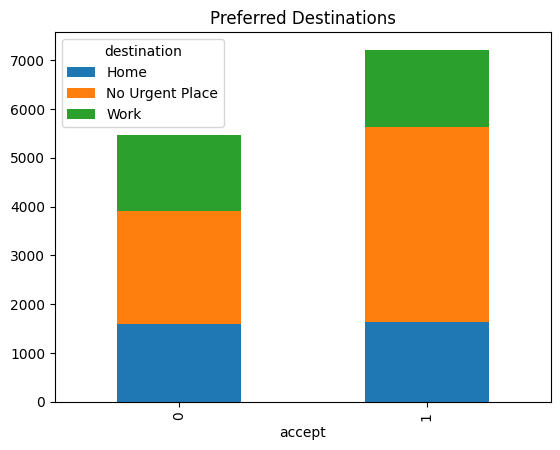

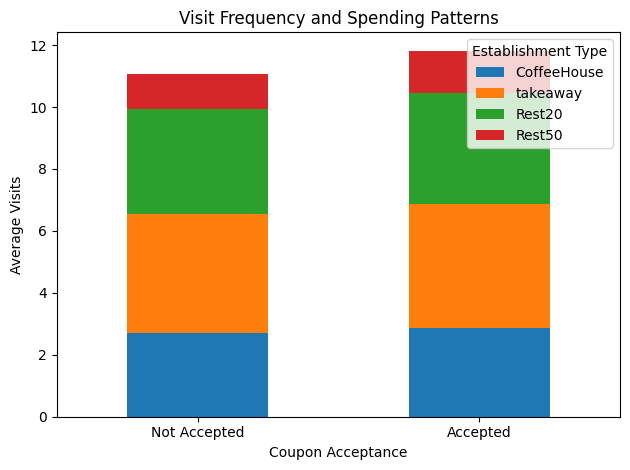

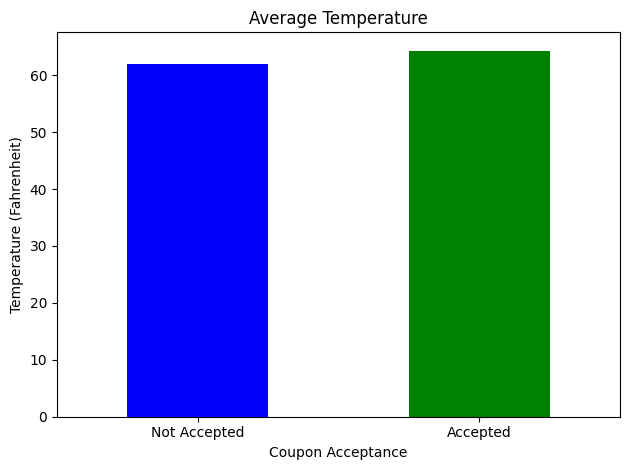

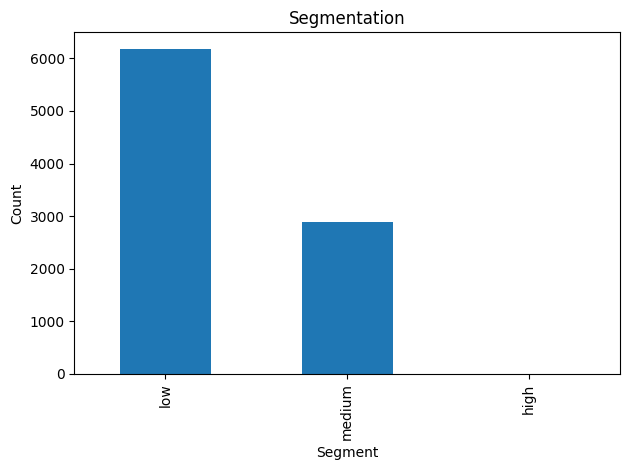

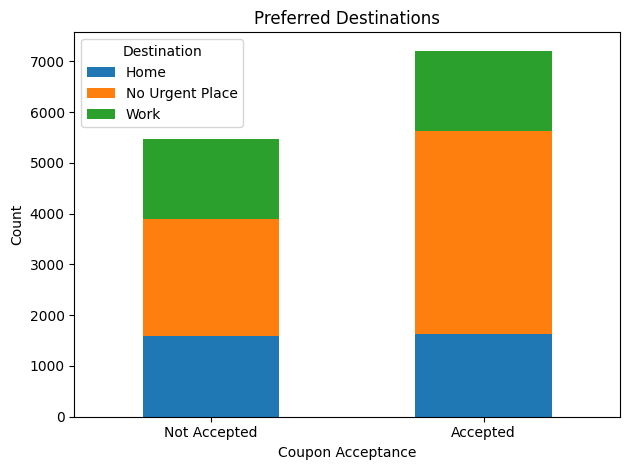

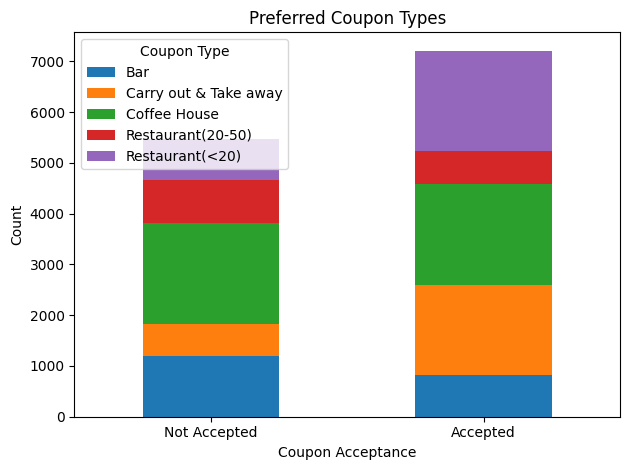

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming df is your DataFrame containing the data

# Step 1: Analyze behavior
# Calculate visit frequency before and after receiving coupons
visit_frequency = df.groupby('accept')['CoffeeHouse', 'takeaway', 'Rest20', 'Rest50'].mean()

# Calculate average temperature for accepted and rejected coupons
avg_temperature = df.groupby('accept')['temperature'].mean()

# Step 2: Segmentation
# Segment customers based on visit frequency and spending patterns
segment_bins = [0, 5, 10, float('inf')]
segment_labels = ['low', 'medium', 'high']
df['segment'] = pd.cut(df['CoffeeHouse'], bins=segment_bins, labels=segment_labels)

# Step 3: Personalization
# Personalize coupon offerings based on customer preferences
preferred_destinations = df.groupby('accept')['destination'].value_counts().unstack(fill_value=0)
preferred_coupon_types = df.groupby('accept')['coupon'].value_counts().unstack(fill_value=0)

# Print analysis results
print("Visit Frequency and Spending Patterns:")
print(visit_frequency)
print("\nAverage Temperature:")
print(avg_temperature)
print("\nSegmentation:")
print(df['segment'].value_counts())
print("\nPreferred Destinations:")
print(preferred_destinations)
print("\nPreferred Coupon Types:")
print(preferred_coupon_types)

# Visualize the analysis results

# Visit Frequency and Spending Patterns
visit_frequency.plot(kind='bar', stacked=True)
plt.title('Visit Frequency and Spending Patterns')
plt.xlabel('Coupon Acceptance')
plt.ylabel('Average Visits')
plt.xticks([0, 1], ['Not Accepted', 'Accepted'], rotation=0)
plt.legend(title='Establishment Type')
plt.tight_layout()
plt.show()

# Average Temperature
avg_temperature.plot(kind='bar', color=['blue', 'green'])
plt.title('Average Temperature')
plt.xlabel('Coupon Acceptance')
plt.ylabel('Temperature (Fahrenheit)')
plt.xticks([0, 1], ['Not Accepted', 'Accepted'], rotation=0)
plt.tight_layout()
plt.show()

# Segmentation
segment_counts = df['segment'].value_counts()
if not segment_counts.empty:
    segment_counts.plot(kind='bar')
    plt.title('Segmentation')
    plt.xlabel('Segment')
    plt.ylabel('Count')
    plt.tight_layout()
    plt.show()
else:
    print("No data available for segmentation.")

# Preferred Destinations
preferred_destinations.plot(kind='bar', stacked=True)
plt.title('Preferred Destinations')# Step 1: Analyze behavior
# Calculate visit frequency before and after receiving coupons
visit_frequency = df.groupby('accept')['CoffeeHouse', 'takeaway', 'Rest20', 'Rest50'].mean()

# Calculate average temperature for accepted and rejected coupons
avg_temperature = df.groupby('accept')['temperature'].mean()

# Step 2: Segmentation
# Segment customers based on visit frequency and spending patterns
segment_bins = [0, 5, 10, float('inf')]
segment_labels = ['low', 'medium', 'high']
df['segment'] = pd.cut(df['CoffeeHouse'], bins=segment_bins, labels=segment_labels)

# Step 3: Personalization
# Personalize coupon offerings based on customer preferences
preferred_destinations = df.groupby('accept')['destination'].value_counts().unstack(fill_value=0)
preferred_coupon_types = df.groupby('accept')['coupon'].value_counts().unstack(fill_value=0)

# Print analysis results
print("Visit Frequency and Spending Patterns:")
print(visit_frequency)
print("\nAverage Temperature:")
print(avg_temperature)
print("\nSegmentation:")
print(df['segment'].value_counts())
print("\nPreferred Destinations:")
print(preferred_destinations)
print("\nPreferred Coupon Types:")
print(preferred_coupon_types)

# Visualize the analysis results

# Visit Frequency and Spending Patterns
visit_frequency.plot(kind='bar', stacked=True)
plt.title('Visit Frequency and Spending Patterns')
plt.xlabel('Coupon Acceptance')
plt.ylabel('Average Visits')
plt.xticks([0, 1], ['Not Accepted', 'Accepted'], rotation=0)
plt.legend(title='Establishment Type')
plt.tight_layout()
plt.show()

# Average Temperature
avg_temperature.plot(kind='bar', color=['blue', 'green'])
plt.title('Average Temperature')
plt.xlabel('Coupon Acceptance')
plt.ylabel('Temperature (Fahrenheit)')
plt.xticks([0, 1], ['Not Accepted', 'Accepted'], rotation=0)
plt.tight_layout()
plt.show()

# Segmentation
segment_counts = df['segment'].value_counts()
if not segment_counts.empty:
    segment_counts.plot(kind='bar')
    plt.title('Segmentation')
    plt.xlabel('Segment')
    plt.ylabel('Count')
    plt.tight_layout()
    plt.show()
else:
    print("No data available for segmentation.")

# Preferred Destinations
preferred_destinations.plot(kind='bar', stacked=True)
plt.title('Preferred Destinations')
plt.xlabel('Coupon Acceptance')
plt.ylabel('Count')
plt.xticks([0, 1], ['Not Accepted', 'Accepted'], rotation=0)
plt.legend(title='Destination')
plt.tight_layout()
plt.show()

# Preferred Coupon Types
preferred_coupon_types.plot(kind='bar', stacked=True)
plt.title('Preferred Coupon Types')
plt.xlabel('Coupon Acceptance')
plt.ylabel('Count')
plt.xticks([0, 1], ['Not Accepted', 'Accepted'], rotation=0)
plt.legend(title='Coupon Type')
plt.tight_layout()
plt.show()


   coupon5  coupon15  coupon25    Rest20    Rest50
0        1         0         0  3.540061  1.286932
1        1         1         0  3.508443  1.249626
2        1         1         1  3.437697  1.226065


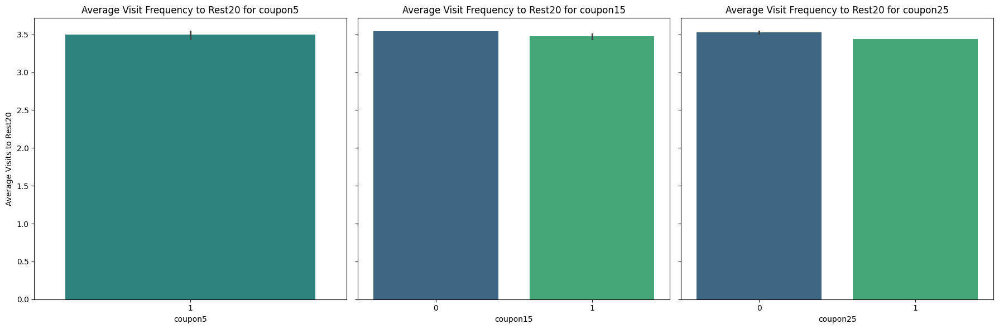

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Group the data by coupon expiration time and calculate the average visit frequency
avg_visit_frequency = df.groupby(['coupon5', 'coupon15', 'coupon25'])[['Rest20', 'Rest50']].mean().reset_index()

# Print the DataFrame to verify its structure
print(avg_visit_frequency.head())

# Plot separate barplots for each coupon expiration time
fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharey=True)

# Iterate over each coupon expiration time and plot the barplot
for i, coupon in enumerate(['coupon5', 'coupon15', 'coupon25']):
    sns.barplot(data=avg_visit_frequency, x=coupon, y='Rest20', ax=axes[i], palette='viridis')
    axes[i].set_title(f'Average Visit Frequency to Rest20 for {coupon}')
    axes[i].set_xlabel(coupon)
    axes[i].set_ylabel('Average Visits to Rest20')

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()


<Figure size 1000x600 with 0 Axes>

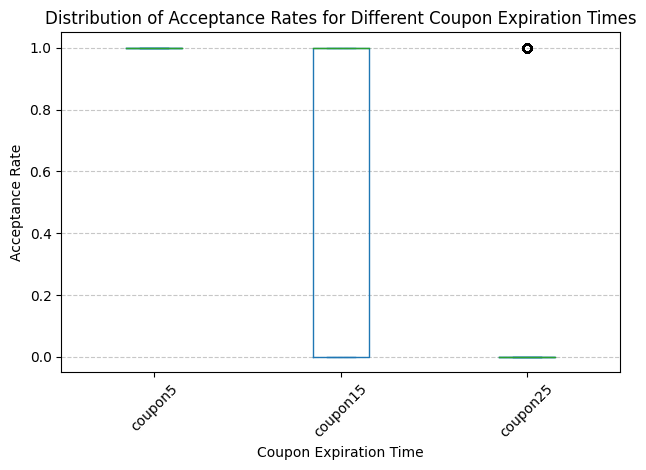

In [ ]:
# Identify Trends (Visualization)
plt.figure(figsize=(10, 6))
df[['coupon5', 'coupon15', 'coupon25']].plot(kind='box')
plt.title('Distribution of Acceptance Rates for Different Coupon Expiration Times')
plt.xlabel('Coupon Expiration Time')
plt.ylabel('Acceptance Rate')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

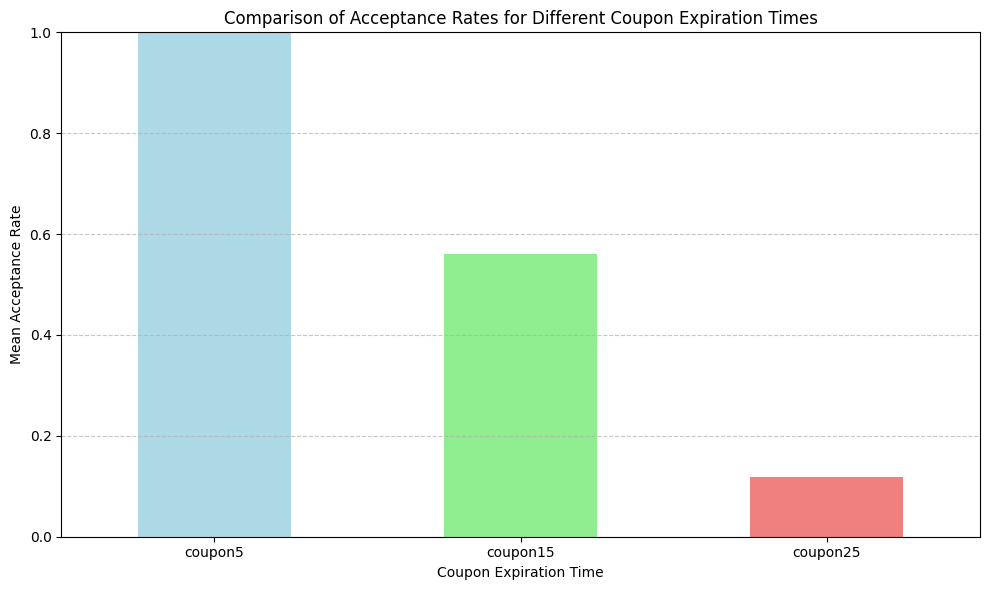

In [ ]:
# Comparison between Coupon Types (Bar plot)
mean_acceptance_rates = df[['coupon5', 'coupon15', 'coupon25']].mean()
plt.figure(figsize=(10, 6))
mean_acceptance_rates.plot(kind='bar', color=['lightblue', 'lightgreen', 'lightcoral'])
plt.title('Comparison of Acceptance Rates for Different Coupon Expiration Times')
plt.xlabel('Coupon Expiration Time')
plt.ylabel('Mean Acceptance Rate')
plt.xticks(rotation=0)
plt.ylim(0, 1)  # Set y-axis limits
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

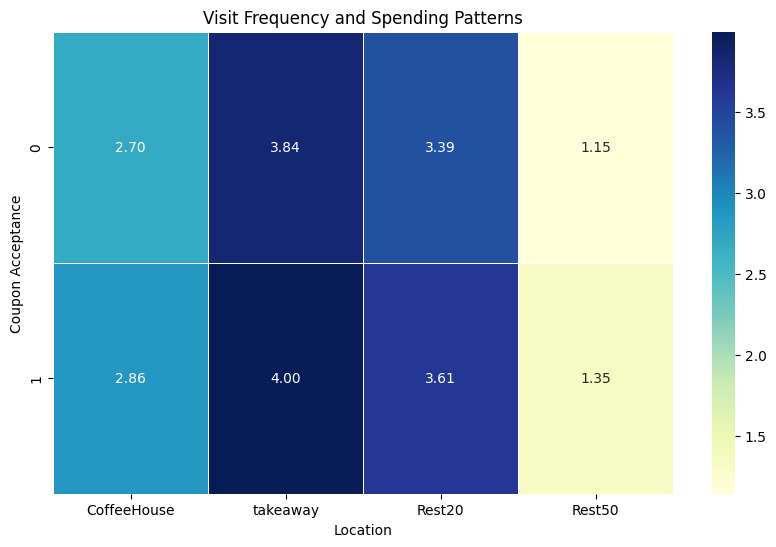

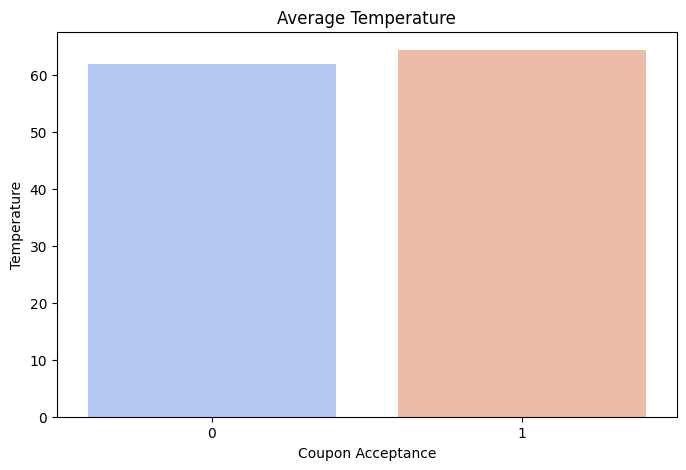

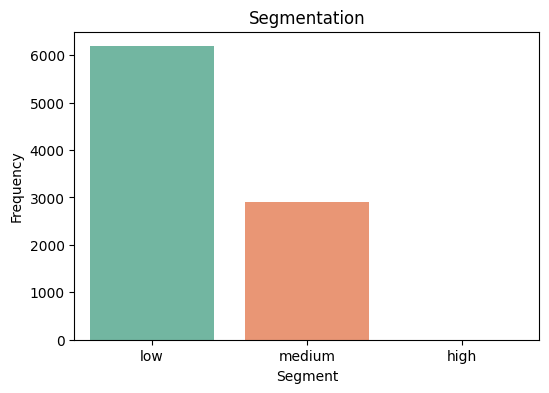

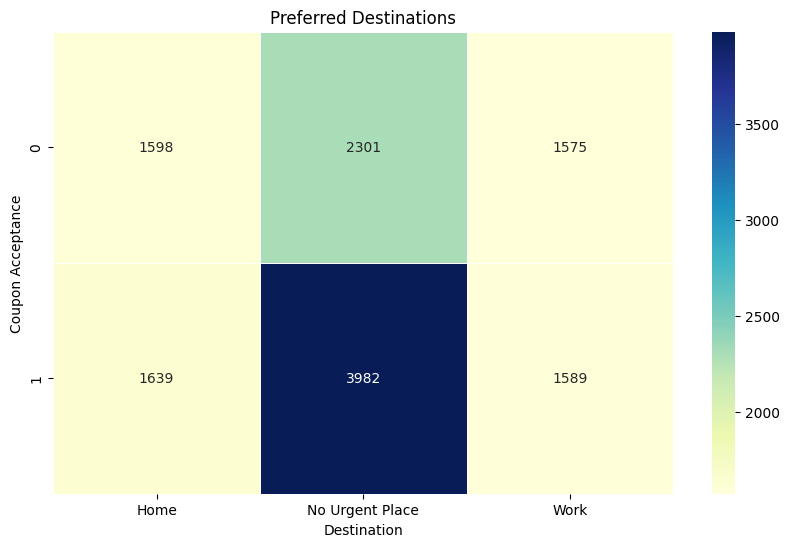

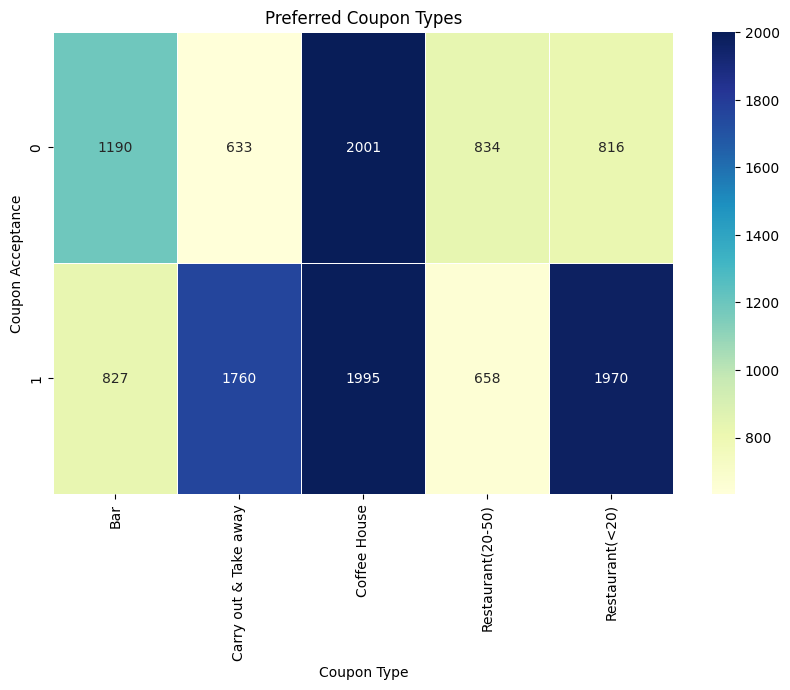

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Plot visit frequency and spending patterns
plt.figure(figsize=(10, 6))
sns.heatmap(visit_frequency, annot=True, cmap="YlGnBu", fmt=".2f", linewidths=.5)
plt.title('Visit Frequency and Spending Patterns')
plt.xlabel('Location')
plt.ylabel('Coupon Acceptance')
plt.show()

# Plot average temperature
plt.figure(figsize=(8, 5))
sns.barplot(x=avg_temperature.index, y=avg_temperature.values, palette='coolwarm')
plt.title('Average Temperature')
plt.xlabel('Coupon Acceptance')
plt.ylabel('Temperature')
plt.show()

# Plot segmentation
plt.figure(figsize=(6, 4))
sns.countplot(data=df, x='segment', order=['low', 'medium', 'high'], palette='Set2')
plt.title('Segmentation')
plt.xlabel('Segment')
plt.ylabel('Frequency')
plt.show()

# Plot preferred destinations
plt.figure(figsize=(10, 6))
sns.heatmap(preferred_destinations, annot=True, cmap="YlGnBu", fmt="d", linewidths=.5)
plt.title('Preferred Destinations')
plt.xlabel('Destination')
plt.ylabel('Coupon Acceptance')
plt.show()

# Plot preferred coupon types
plt.figure(figsize=(10, 6))
sns.heatmap(preferred_coupon_types, annot=True, cmap="YlGnBu", fmt="d", linewidths=.5)
plt.title('Preferred Coupon Types')
plt.xlabel('Coupon Type')
plt.ylabel('Coupon Acceptance')
plt.show()


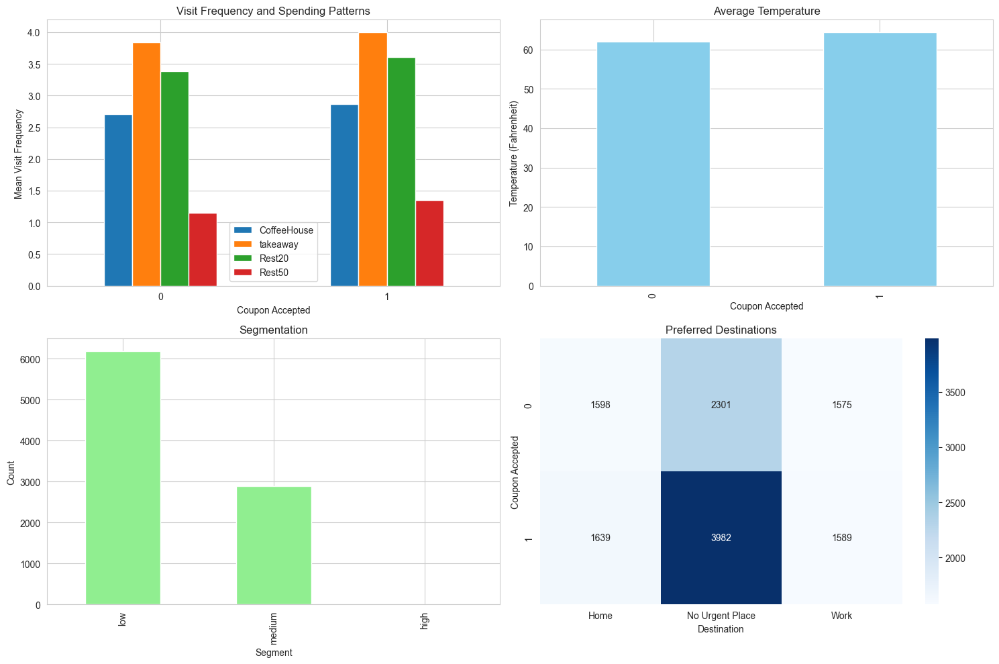

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set style
sns.set_style("whitegrid")

# Create subplots
fig, axs = plt.subplots(2, 2, figsize=(15, 10))

# Plot visit frequency and spending patterns
visit_frequency.plot(kind='bar', ax=axs[0, 0], rot=0)
avg_temperature.plot(kind='bar', ax=axs[0, 1], color='skyblue')
df['segment'].value_counts().plot(kind='bar', ax=axs[1, 0], color='lightgreen')

# Plot preferred destinations and coupon types using heatmap
sns.heatmap(preferred_destinations, annot=True, fmt="d", cmap="Blues", ax=axs[1, 1])

# Set titles and labels
axs[0, 0].set_title('Visit Frequency and Spending Patterns')
axs[0, 0].set_xlabel('Coupon Accepted')
axs[0, 0].set_ylabel('Mean Visit Frequency')
axs[0, 1].set_title('Average Temperature')
axs[0, 1].set_xlabel('Coupon Accepted')
axs[0, 1].set_ylabel('Temperature (Fahrenheit)')
axs[1, 0].set_title('Segmentation')
axs[1, 0].set_xlabel('Segment')
axs[1, 0].set_ylabel('Count')
axs[1, 1].set_title('Preferred Destinations')
axs[1, 1].set_xlabel('Destination')
axs[1, 1].set_ylabel('Coupon Accepted')

# Adjust layout
plt.tight_layout()

# Show plot
plt.show()


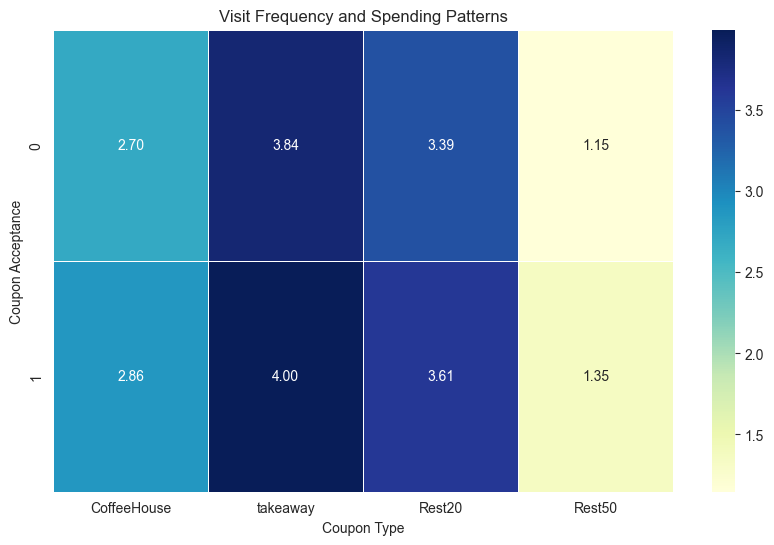

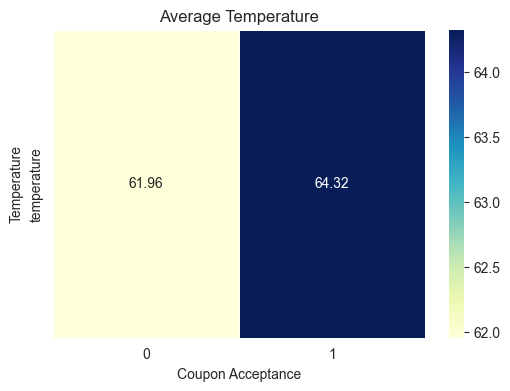

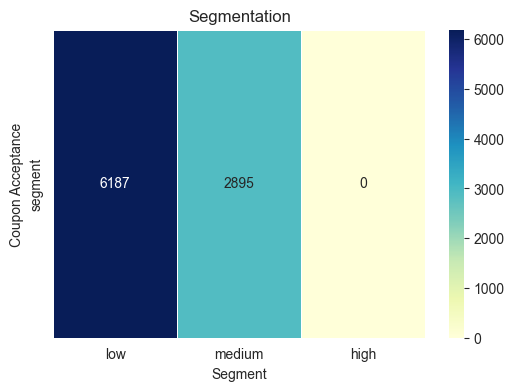

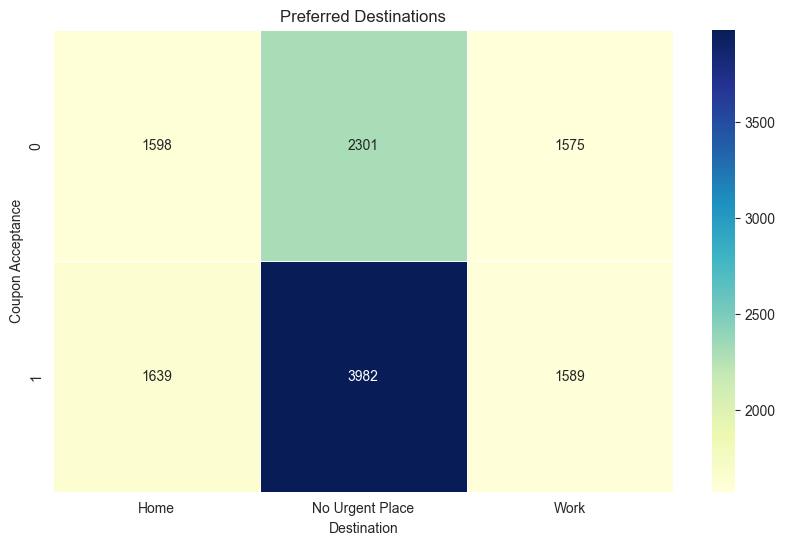

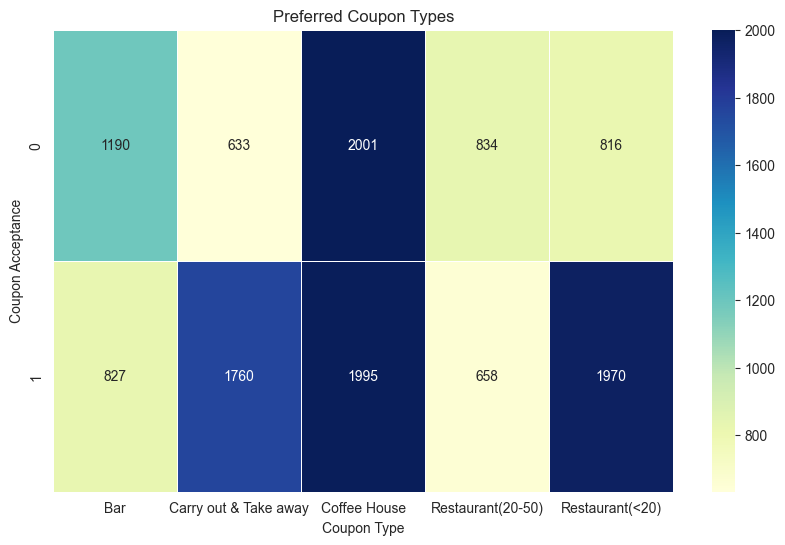

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Plot visit frequency and spending patterns with values inside
plt.figure(figsize=(10, 6))
sns.heatmap(visit_frequency, annot=True, cmap="YlGnBu", fmt=".2f", linewidths=.5)
plt.title('Visit Frequency and Spending Patterns')
plt.xlabel('Coupon Type')
plt.ylabel('Coupon Acceptance')
plt.show()

# Plot average temperature with values inside
plt.figure(figsize=(6, 4))
sns.heatmap(avg_temperature.to_frame().T, annot=True, cmap="YlGnBu", fmt=".2f", linewidths=.5)
plt.title('Average Temperature')
plt.xlabel('Coupon Acceptance')
plt.ylabel('Temperature')
plt.show()

# Plot segmentation with values inside
plt.figure(figsize=(6, 4))
sns.heatmap(df['segment'].value_counts().to_frame().T, annot=True, cmap="YlGnBu", fmt="d", linewidths=.5)
plt.title('Segmentation')
plt.xlabel('Segment')
plt.ylabel('Coupon Acceptance')
plt.show()

# Plot preferred destinations with values inside
plt.figure(figsize=(10, 6))
sns.heatmap(preferred_destinations, annot=True, cmap="YlGnBu", fmt="d", linewidths=.5)
plt.title('Preferred Destinations')
plt.xlabel('Destination')
plt.ylabel('Coupon Acceptance')
plt.show()

# Plot preferred coupon types with values inside
plt.figure(figsize=(10, 6))
sns.heatmap(preferred_coupon_types, annot=True, cmap="YlGnBu", fmt="d", linewidths=.5)
plt.title('Preferred Coupon Types')
plt.xlabel('Coupon Type')
plt.ylabel('Coupon Acceptance')
plt.show()


In [ ]:
df.head()

,destination,passanger,weather,temperature,coupon,expiration,gender,age,maritalStatus,has_children,...,takeaway,Rest20,Rest50,coupon5,coupon15,coupon25,samedir,oppdir,accept,segment
0,No Urgent Place,Alone,Sunny,55,Restaurant(<20),1d,Female,21,Unmarried partner,1,...,0.0,6.0,2.0,1,0,0,0,1,1,low
1,No Urgent Place,Friend(s),Sunny,80,Coffee House,2h,Female,21,Unmarried partner,1,...,0.0,6.0,2.0,1,0,0,0,1,0,low
2,No Urgent Place,Friend(s),Sunny,80,Carry out & Take away,2h,Female,21,Unmarried partner,1,...,0.0,6.0,2.0,1,1,0,0,1,1,low
3,No Urgent Place,Friend(s),Sunny,80,Coffee House,2h,Female,21,Unmarried partner,1,...,0.0,6.0,2.0,1,1,0,0,1,0,low
4,No Urgent Place,Friend(s),Sunny,80,Coffee House,1d,Female,21,Unmarried partner,1,...,0.0,6.0,2.0,1,1,0,0,1,0,low


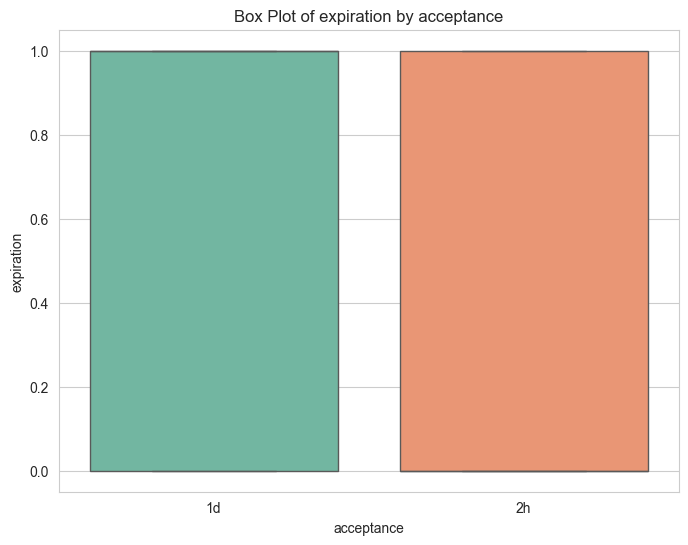

In [ ]:
plt.figure(figsize=(8, 6))
sns.boxplot(x='expiration', y='accept', data=df, palette='Set2')
plt.title('Box Plot of expiration by acceptance')
plt.xlabel('acceptance')
plt.ylabel('expiration')
plt.show()

# Use Mean Encoding Technique

In [ ]:
# Define a function to perform mean encoding

def mean_encode(df,col, mean_col):
    df_dict = df.groupby([col])[mean_col].mean().to_dict()
    df[col] = df[col].map(df_dict)
    return df
for col in df.columns[0:26]:
    df = mean_encode(df,col,'accept')

In [ ]:
print(df)

       destination  passanger   weather  temperature    coupon  expiration  \
0         0.633774   0.525804  0.594796     0.536719  0.707107    0.625582   
1         0.633774   0.673438  0.594796     0.600337  0.499249    0.495977   
2         0.633774   0.673438  0.594796     0.600337  0.735478    0.495977   
3         0.633774   0.673438  0.594796     0.600337  0.499249    0.495977   
4         0.633774   0.673438  0.594796     0.600337  0.499249    0.625582   
...            ...        ...       ...          ...       ...         ...   
12679     0.506333   0.595349  0.462810     0.536719  0.735478    0.625582   
12680     0.502212   0.525804  0.462810     0.536719  0.735478    0.625582   
12681     0.502212   0.525804  0.470463     0.531088  0.499249    0.625582   
12682     0.502212   0.525804  0.470463     0.531088  0.410015    0.625582   
12683     0.502212   0.525804  0.594796     0.600337  0.441019    0.495977   

         gender       age  maritalStatus  has_children  ...  ta

# Preparing our data for Modelling

In [ ]:
#This is the final data
df.head()

,destination,passanger,weather,temperature,coupon,expiration,gender,age,maritalStatus,has_children,...,takeaway,Rest20,Rest50,coupon5,coupon15,coupon25,samedir,oppdir,accept,segment
0,0.633774,0.525804,0.594796,0.536719,0.707107,0.625582,0.547228,0.598191,0.561299,0.541595,...,0.512207,0.584637,0.595137,0.568433,0.614168,0.587309,0.564659,0.564659,1.0,0.561015
1,0.633774,0.673438,0.594796,0.600337,0.499249,0.495977,0.547228,0.598191,0.561299,0.541595,...,0.512207,0.584637,0.595137,0.568433,0.614168,0.587309,0.564659,0.564659,0.0,0.561015
2,0.633774,0.673438,0.594796,0.600337,0.735478,0.495977,0.547228,0.598191,0.561299,0.541595,...,0.512207,0.584637,0.595137,0.568433,0.532716,0.587309,0.564659,0.564659,1.0,0.561015
3,0.633774,0.673438,0.594796,0.600337,0.499249,0.495977,0.547228,0.598191,0.561299,0.541595,...,0.512207,0.584637,0.595137,0.568433,0.532716,0.587309,0.564659,0.564659,0.0,0.561015
4,0.633774,0.673438,0.594796,0.600337,0.499249,0.625582,0.547228,0.598191,0.561299,0.541595,...,0.512207,0.584637,0.595137,0.568433,0.532716,0.587309,0.564659,0.564659,0.0,0.561015


# Check for Outliers

In [ ]:
df.describe()

,destination,passanger,weather,temperature,coupon,expiration,gender,age,maritalStatus,has_children,...,takeaway,Rest20,Rest50,coupon5,coupon15,coupon25,samedir,oppdir,accept,segment
count,12684.000000,12684.000000,12684.000000,12684.000000,12684.000000,12684.000000,12684.000000,12684.000000,12684.000000,12684.000000,...,12684.000000,12684.000000,12684.000000,1.268400e+04,12684.000000,12684.000000,12684.000000,12684.000000,12684.000000,9082.000000
mean,0.568433,0.568433,0.568433,0.568433,0.568433,0.568433,0.568433,0.568433,0.568433,0.568433,...,0.568433,0.568433,0.568433,5.684327e-01,0.568433,0.568433,0.568433,0.568433,0.568433,0.577956
std,0.064755,0.065534,0.051763,0.032910,0.129993,0.064351,0.021779,0.034952,0.030717,0.022565,...,0.024955,0.019735,0.036043,5.584642e-14,0.040418,0.051331,0.007217,0.007217,0.495314,0.024768
min,0.502212,0.504970,0.462810,0.531088,0.410015,0.495977,0.547228,0.508949,0.476923,0.541595,...,0.512207,0.536364,0.517322,5.684327e-01,0.532716,0.428855,0.564659,0.564659,0.000000,0.561015
25%,0.506333,0.525804,0.594796,0.536719,0.441019,0.495977,0.547228,0.546346,0.542941,0.541595,...,0.573400,0.559896,0.557772,5.684327e-01,0.532716,0.587309,0.564659,0.564659,0.000000,0.561015
50%,0.506333,0.525804,0.594796,0.600337,0.499249,0.625582,0.547228,0.575802,0.561299,0.587404,...,0.580479,0.559896,0.557772,5.684327e-01,0.532716,0.587309,0.564659,0.564659,1.000000,0.561015
75%,0.633774,0.673438,0.594796,0.600337,0.707107,0.625582,0.590799,0.598191,0.605850,0.587404,...,0.581024,0.584637,0.595137,5.684327e-01,0.614168,0.587309,0.564659,0.564659,1.000000,0.614162
max,0.633774,0.673438,0.594796,0.600337,0.735478,0.625582,0.590799,0.634369,0.605850,0.587404,...,0.581024,0.607782,0.662879,5.684327e-01,0.614168,0.587309,0.582232,0.582232,1.000000,0.614162


<Axes: xlabel='destination', ylabel='Density'>

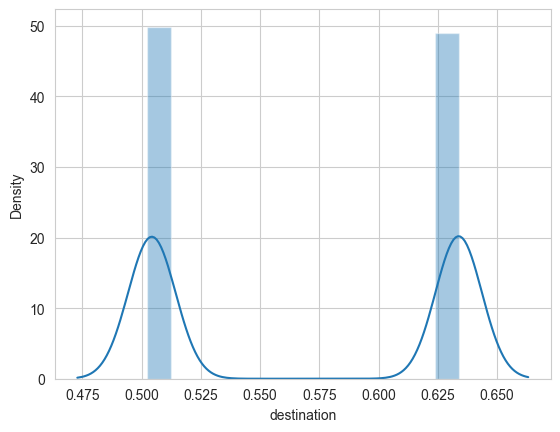

In [ ]:
sns.distplot(df['destination'])

<Axes: xlabel='passanger', ylabel='Density'>

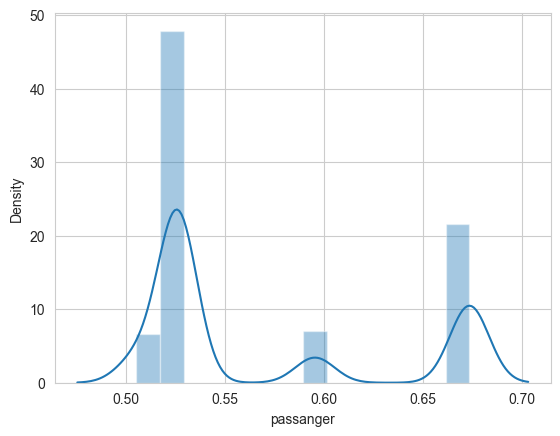

In [ ]:
sns.distplot(df['passanger'])

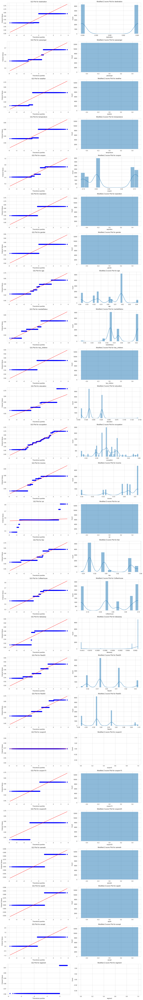

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

# Set up subplots
fig, axs = plt.subplots(nrows=len(df.columns), ncols=2, figsize=(15, 4 * len(df.columns)))
plt.subplots_adjust(hspace=0.5)

# Iterate over each column in the DataFrame
for i, col in enumerate(df.columns):
    # QQ plot
    stats.probplot(df[col], dist="norm", plot=axs[i, 0])
    axs[i, 0].set_title(f'QQ Plot for {col}')

    # Modified Z-score plot
    z_scores = stats.zscore(df[col])
    modified_z_scores = stats.median_abs_deviation(df[col]) * z_scores
    sns.histplot(modified_z_scores, kde=True, ax=axs[i, 1])
    axs[i, 1].set_title(f'Modified Z-score Plot for {col}')

# Show plots
plt.tight_layout()
plt.show()


In a QQ (Quantile-Quantile) plot, the observed sample quantiles are plotted against the quantiles of a specified theoretical distribution (usually the normal distribution). Here's how to interpret the results of a QQ plot:

    Perfect Normal Distribution: If the points on the QQ plot lie approximately along the diagonal line, it suggests that the data follows a normal distribution.

    Deviation from Normality: If the points deviate from the diagonal line, it indicates deviations from normality. If the points form a curve upwards or downwards, it suggests skewness in the distribution. If the curve is in the middle, it indicates heavy tails in the distribution.

    Outliers: Outliers in the data can manifest as points that deviate significantly from the diagonal line. These outliers may appear as points that are distant from the line, especially in the tails of the distribution.

    Direction of Deviation: If the points fall below the diagonal line, it suggests that the data has heavier tails than the normal distribution. Conversely, if the points fall above the diagonal line, it suggests that the data has lighter tails than the normal distribution.

    Overall Fit: The overall fit of the points to the diagonal line gives a visual indication of how well the data fits the normal distribution. If the points closely follow the line, it indicates a good fit, while significant deviations suggest departure from normality.

In summary, a QQ plot is a useful graphical tool for assessing the normality of a dataset and identifying outliers or deviations from a theoretical distribution.

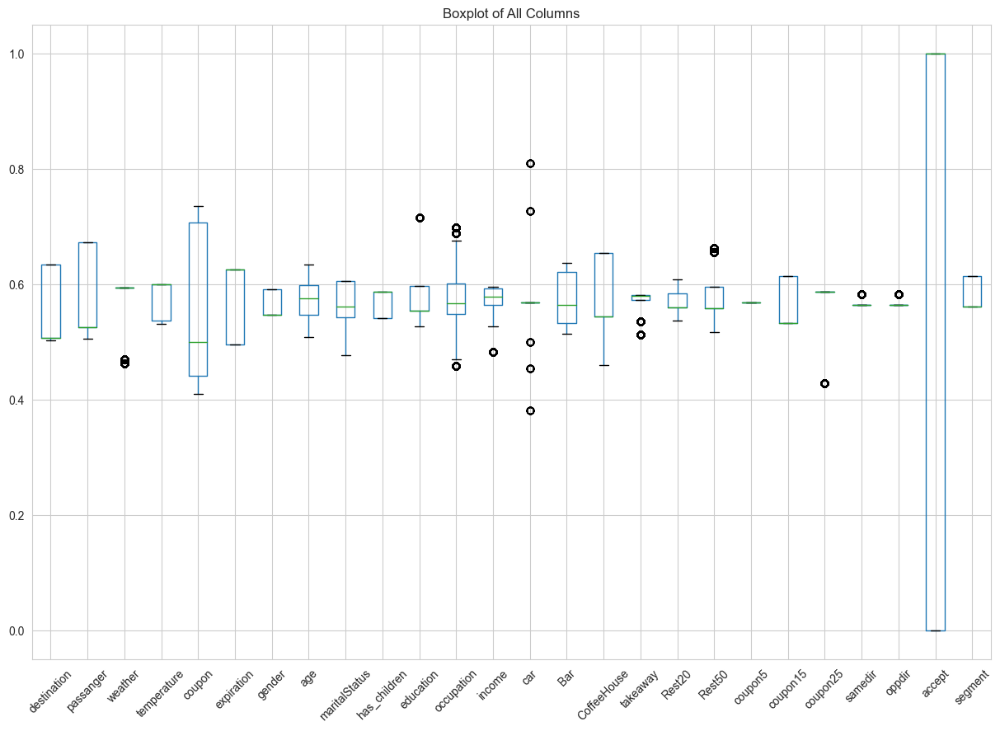

In [ ]:
import matplotlib.pyplot as plt

# Create boxplots for all columns in the DataFrame
plt.figure(figsize=(15, 10))  # Adjust the figure size as needed
df.boxplot()
plt.title('Boxplot of All Columns')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.show()


**For weather there are outliers towards bottom the median is it below x axis only a line is shown not as a box.for education also there are outliers the box is below the reference line for education there are outliers just above the highr value and below low value for income there are outliers below the lowest value for car not a box is shown but a single line with outliers above and below these values are far apart,for takeaway a single small bar with 2 outlier points belowupper and lower limit is seen at edges of box itself. for coupon 25 also outlier seen which is a farthest point .For same direction and opposite also outliers seen.Abox not seen for them only a central line.**

    Weather: Outliers towards the bottom indicate extreme values that are significantly lower than the median. This could represent unusual weather conditions that occur very rarely.

    Education: Outliers are observed just above the higher value and below the lower value. This suggests that there are individuals with education levels that are either exceptionally high or exceptionally low compared to the majority of the population.

    Income: Outliers are observed below the lowest value, indicating individuals with very low incomes compared to the rest of the dataset.

    Car: Only a single line is shown with outliers above and below the values. This suggests that most of the data points are concentrated around the median, but there are some extreme values both above and below the median.

    Takeaway: A single small bar with outliers below the upper and lower limits suggests that there are a few data points that are significantly different from the rest of the dataset in terms of takeaway frequency.

    Coupon25: Outliers are observed, with one data point being the farthest from the rest of the distribution. This indicates a significant deviation from the typical coupon25 values.

    Same direction and Opposite: Outliers are seen, and no box is visible, only a central line. This suggests that the majority of the data points are clustered closely together, with a few extreme values lying far from the rest of the distribution.

These observations provide insights into the distribution and potential anomalies in your dataset, which can be further investigated to understand their underlying causes and implications.


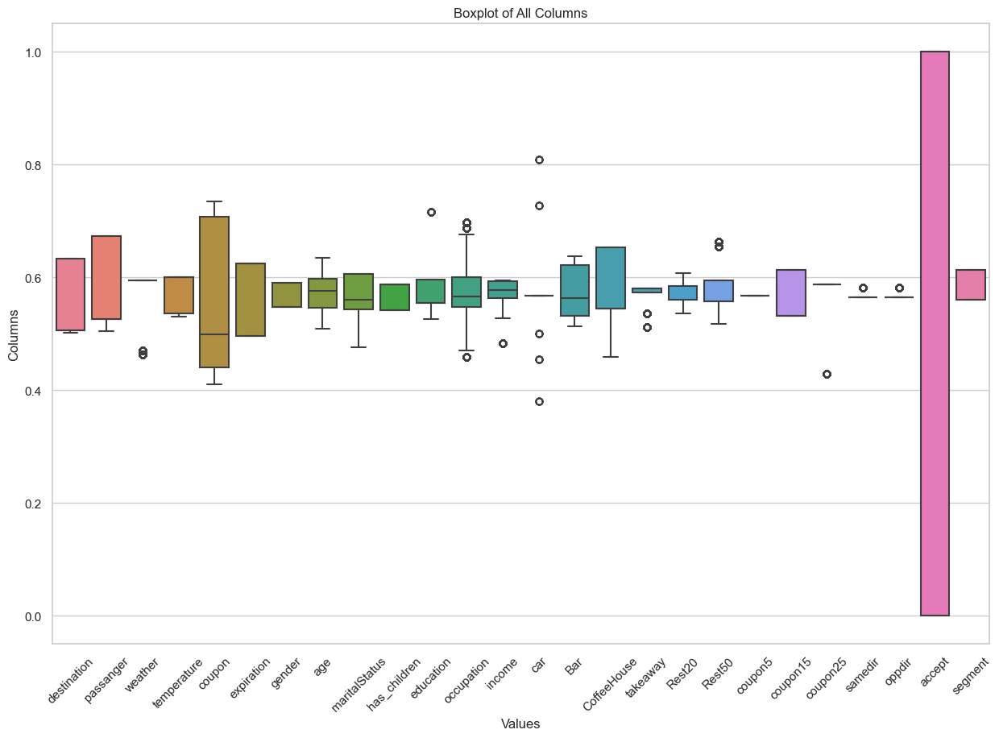

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the style and palette for seaborn
sns.set(style="whitegrid", palette="colorblind")

# Create boxplots for all columns in the DataFrame
plt.figure(figsize=(15, 10))  # Adjust the figure size as needed
sns.boxplot(data=df, orient="v", linewidth=1.5)
plt.title('Boxplot of All Columns')
plt.xlabel('Values')
plt.ylabel('Columns')
# Rotate the x-axis labels by 45 degrees
plt.xticks(rotation=45)  # or rotation=90 for 90 degrees

plt.show()


<Axes: xlabel='weather', ylabel='Density'>

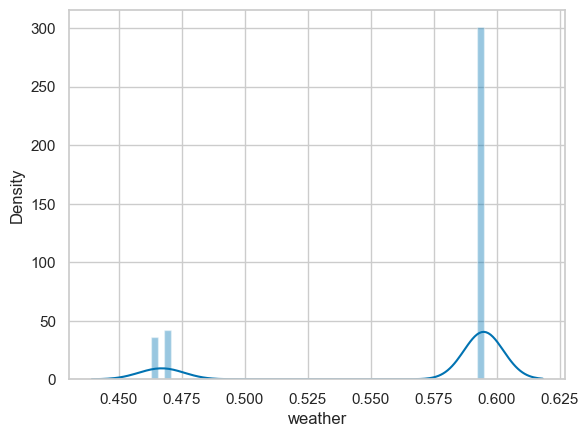

In [ ]:
sns.distplot(df['weather'])

In [ ]:
def handle_outlier(col):
    df[col]= np.log1p(df[col])

In [ ]:
handle_outlier("weather")

<Axes: xlabel='weather', ylabel='Density'>

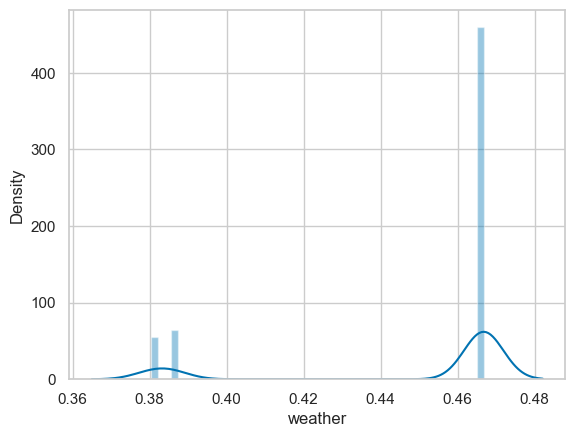

In [ ]:
sns.distplot(df['weather'].dropna())

<Axes: xlabel='car', ylabel='Density'>

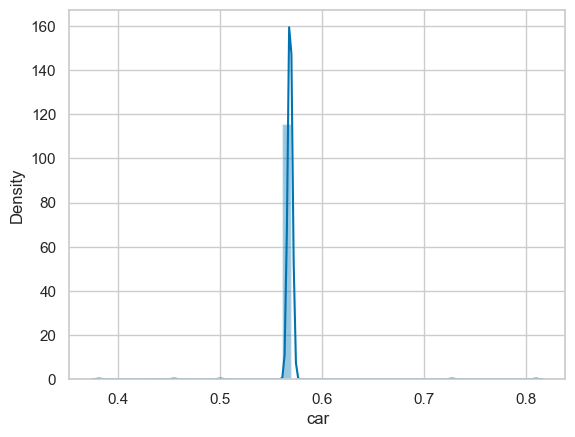

In [ ]:
sns.distplot(df['car'])

In [ ]:
handle_outlier("car")

<Axes: xlabel='car', ylabel='Density'>

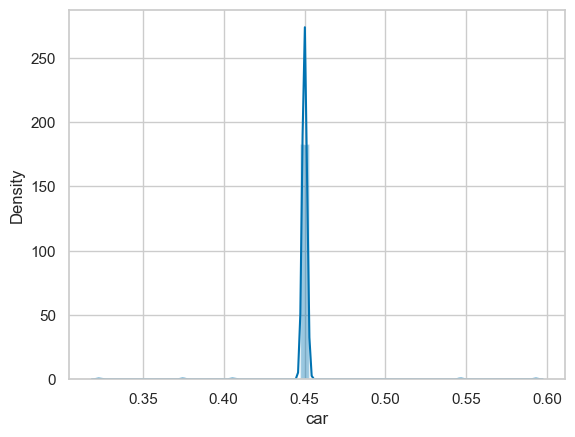

In [ ]:
sns.distplot(df['car'].dropna())

In [ ]:
df.isnull().sum()

destination         0
passanger           0
weather             0
temperature         0
coupon              0
expiration          0
gender              0
age                 0
maritalStatus       0
has_children        0
education           0
occupation          0
income              0
car                 0
Bar                 0
CoffeeHouse         0
takeaway            0
Rest20              0
Rest50              0
coupon5             0
coupon15            0
coupon25            0
samedir             0
oppdir              0
accept              0
segment          3602
dtype: int64

In [ ]:
df.dropna(inplace = True)

In [ ]:
df.isnull().sum()

destination      0
passanger        0
weather          0
temperature      0
coupon           0
expiration       0
gender           0
age              0
maritalStatus    0
has_children     0
education        0
occupation       0
income           0
car              0
Bar              0
CoffeeHouse      0
takeaway         0
Rest20           0
Rest50           0
coupon5          0
coupon15         0
coupon25         0
samedir          0
oppdir           0
accept           0
segment          0
dtype: int64

# Feature Importance

# Split x and y

In [ ]:
#Seperate Dependent and Indepenent variable

y=df["accept"]  #dependent variable

X = df.drop("accept", axis =1) #independent variable

In [ ]:
X

,destination,passanger,weather,temperature,coupon,expiration,gender,age,maritalStatus,has_children,...,CoffeeHouse,takeaway,Rest20,Rest50,coupon5,coupon15,coupon25,samedir,oppdir,segment
0,0.633774,0.525804,0.466746,0.536719,0.707107,0.625582,0.547228,0.598191,0.561299,0.541595,...,0.459824,0.512207,0.584637,0.595137,0.568433,0.614168,0.587309,0.564659,0.564659,0.561015
1,0.633774,0.673438,0.466746,0.600337,0.499249,0.495977,0.547228,0.598191,0.561299,0.541595,...,0.459824,0.512207,0.584637,0.595137,0.568433,0.614168,0.587309,0.564659,0.564659,0.561015
2,0.633774,0.673438,0.466746,0.600337,0.735478,0.495977,0.547228,0.598191,0.561299,0.541595,...,0.459824,0.512207,0.584637,0.595137,0.568433,0.532716,0.587309,0.564659,0.564659,0.561015
3,0.633774,0.673438,0.466746,0.600337,0.499249,0.495977,0.547228,0.598191,0.561299,0.541595,...,0.459824,0.512207,0.584637,0.595137,0.568433,0.532716,0.587309,0.564659,0.564659,0.561015
4,0.633774,0.673438,0.466746,0.600337,0.499249,0.625582,0.547228,0.598191,0.561299,0.541595,...,0.459824,0.512207,0.584637,0.595137,0.568433,0.532716,0.587309,0.564659,0.564659,0.561015
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12679,0.506333,0.595349,0.380359,0.536719,0.735478,0.625582,0.590799,0.595936,0.605850,0.587404,...,0.459824,0.580479,0.584637,0.595137,0.568433,0.614168,0.587309,0.582232,0.582232,0.561015
12680,0.502212,0.525804,0.380359,0.536719,0.735478,0.625582,0.590799,0.595936,0.605850,0.587404,...,0.459824,0.580479,0.584637,0.595137,0.568433,0.614168,0.587309,0.564659,0.564659,0.561015
12681,0.502212,0.525804,0.385577,0.531088,0.499249,0.625582,0.590799,0.595936,0.605850,0.587404,...,0.459824,0.580479,0.584637,0.595137,0.568433,0.614168,0.587309,0.582232,0.582232,0.561015
12682,0.502212,0.525804,0.385577,0.531088,0.410015,0.625582,0.590799,0.595936,0.605850,0.587404,...,0.459824,0.580479,0.584637,0.595137,0.568433,0.532716,0.428855,0.564659,0.564659,0.561015


In [ ]:
y

0        1.0
1        0.0
2        1.0
3        0.0
4        0.0
        ... 
12679    1.0
12680    1.0
12681    0.0
12682    0.0
12683    0.0
Name: accept, Length: 9082, dtype: float64

In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

X_scaled = scaler.fit_transform(X)

In [ ]:
X_scaled = pd.DataFrame(X, columns = X.columns) #columns = columns ie X.columns(column names)

In [ ]:
X_scaled

,destination,passanger,weather,temperature,coupon,expiration,gender,age,maritalStatus,has_children,...,CoffeeHouse,takeaway,Rest20,Rest50,coupon5,coupon15,coupon25,samedir,oppdir,segment
0,0.633774,0.525804,0.466746,0.536719,0.707107,0.625582,0.547228,0.598191,0.561299,0.541595,...,0.459824,0.512207,0.584637,0.595137,0.568433,0.614168,0.587309,0.564659,0.564659,0.561015
1,0.633774,0.673438,0.466746,0.600337,0.499249,0.495977,0.547228,0.598191,0.561299,0.541595,...,0.459824,0.512207,0.584637,0.595137,0.568433,0.614168,0.587309,0.564659,0.564659,0.561015
2,0.633774,0.673438,0.466746,0.600337,0.735478,0.495977,0.547228,0.598191,0.561299,0.541595,...,0.459824,0.512207,0.584637,0.595137,0.568433,0.532716,0.587309,0.564659,0.564659,0.561015
3,0.633774,0.673438,0.466746,0.600337,0.499249,0.495977,0.547228,0.598191,0.561299,0.541595,...,0.459824,0.512207,0.584637,0.595137,0.568433,0.532716,0.587309,0.564659,0.564659,0.561015
4,0.633774,0.673438,0.466746,0.600337,0.499249,0.625582,0.547228,0.598191,0.561299,0.541595,...,0.459824,0.512207,0.584637,0.595137,0.568433,0.532716,0.587309,0.564659,0.564659,0.561015
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12679,0.506333,0.595349,0.380359,0.536719,0.735478,0.625582,0.590799,0.595936,0.605850,0.587404,...,0.459824,0.580479,0.584637,0.595137,0.568433,0.614168,0.587309,0.582232,0.582232,0.561015
12680,0.502212,0.525804,0.380359,0.536719,0.735478,0.625582,0.590799,0.595936,0.605850,0.587404,...,0.459824,0.580479,0.584637,0.595137,0.568433,0.614168,0.587309,0.564659,0.564659,0.561015
12681,0.502212,0.525804,0.385577,0.531088,0.499249,0.625582,0.590799,0.595936,0.605850,0.587404,...,0.459824,0.580479,0.584637,0.595137,0.568433,0.614168,0.587309,0.582232,0.582232,0.561015
12682,0.502212,0.525804,0.385577,0.531088,0.410015,0.625582,0.590799,0.595936,0.605850,0.587404,...,0.459824,0.580479,0.584637,0.595137,0.568433,0.532716,0.428855,0.564659,0.564659,0.561015


In [ ]:
y

0        1.0
1        0.0
2        1.0
3        0.0
4        0.0
        ... 
12679    1.0
12680    1.0
12681    0.0
12682    0.0
12683    0.0
Name: accept, Length: 9082, dtype: float64

# split test and train data and build model

In [ ]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(X_scaled, y, train_size = 0.80, random_state =101)

# Model building

In [ ]:
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import AdaBoostClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import ExtraTreesClassifier


In [ ]:
models = []

models.append(("Naive Bayes", GaussianNB()))
models.append(("Random Forest", RandomForestClassifier()))
models.append(("Decision Tree Classifier", DecisionTreeClassifier() ))
models.append(("KNN", KNeighborsClassifier(n_neighbors = 5)))
models.append(("Logistic Regression", LogisticRegression()))
models.append(("Adaboost", AdaBoostClassifier()))
models.append(("XGBoost", XGBClassifier()))
models.append(("ExtraTree", ExtraTreesClassifier()))

Naive Bayes
Confusion matrix of test:
 [[341 211]
 [404 861]]
Confusion matrix of train:
 [[1509  913]
 [1579 3264]]
Accuracy of test : 0.6615299944964227
Accuracy of train: 0.6569855471438403


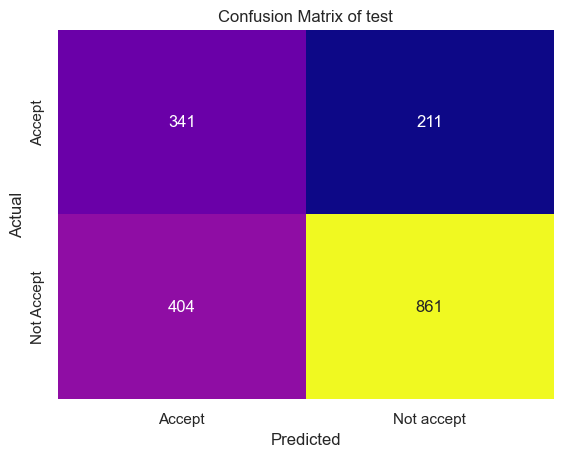

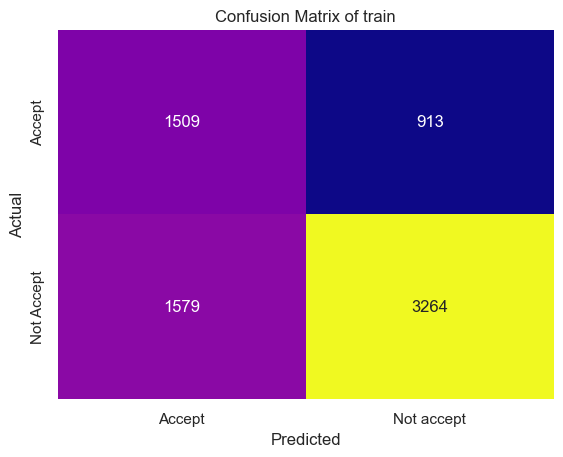



Random Forest
Confusion matrix of test:
 [[509 191]
 [236 881]]
Confusion matrix of train:
 [[3054   26]
 [  34 4151]]
Accuracy of test : 0.7649972482113374
Accuracy of train: 0.9917412250516173


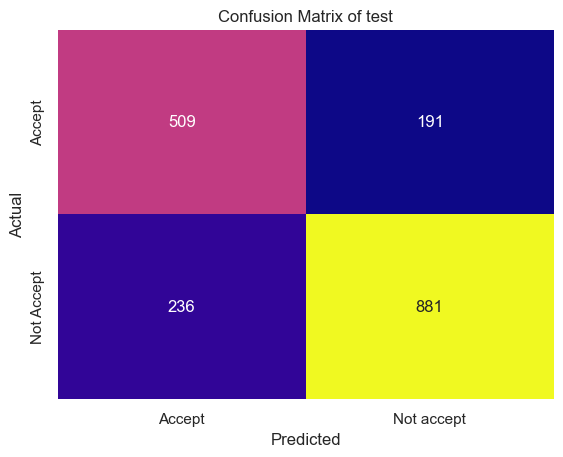

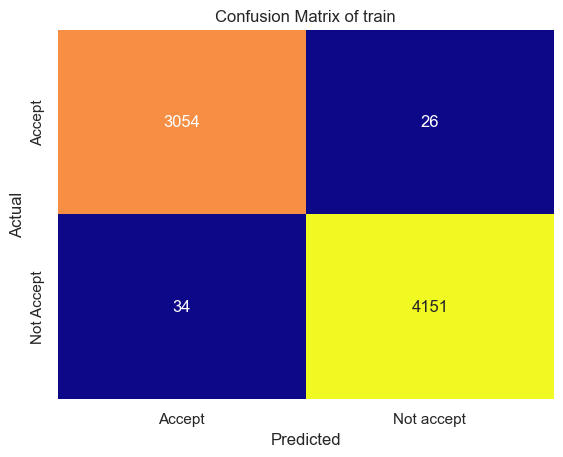



Decision Tree Classifier
Confusion matrix of test:
 [[484 297]
 [261 775]]
Confusion matrix of train:
 [[3088   60]
 [   0 4117]]
Accuracy of test : 0.6929003852504128
Accuracy of train: 0.9917412250516173


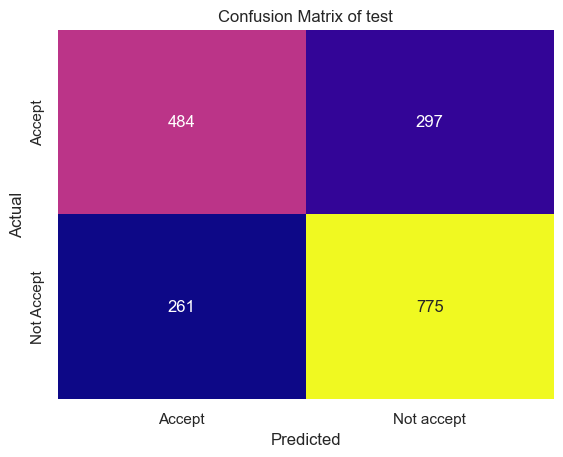

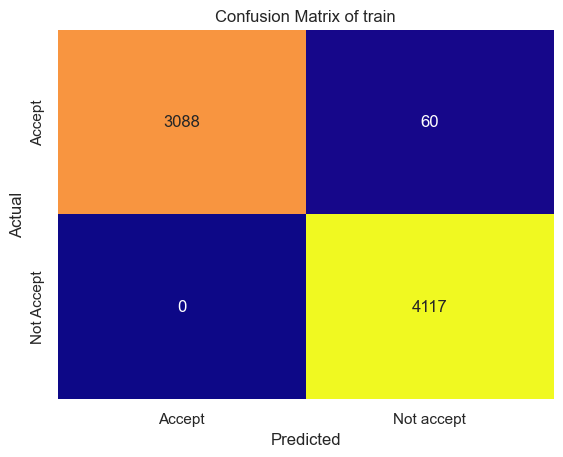



KNN
Confusion matrix of test:
 [[458 259]
 [287 813]]
Confusion matrix of train:
 [[2254  677]
 [ 834 3500]]
Accuracy of test : 0.6995046780407265
Accuracy of train: 0.7920165175498968


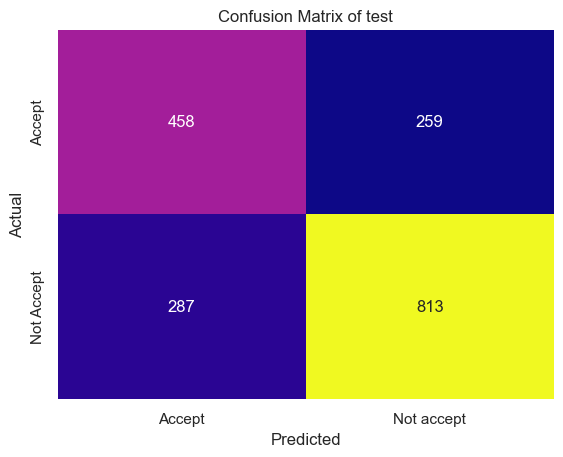

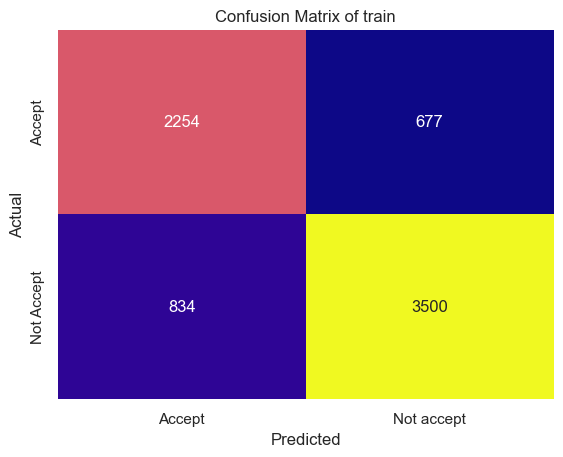



Logistic Regression
Confusion matrix of test:
 [[420 207]
 [325 865]]
Confusion matrix of train:
 [[1717  885]
 [1371 3292]]
Accuracy of test : 0.7072096862960925
Accuracy of train: 0.6894700619408121


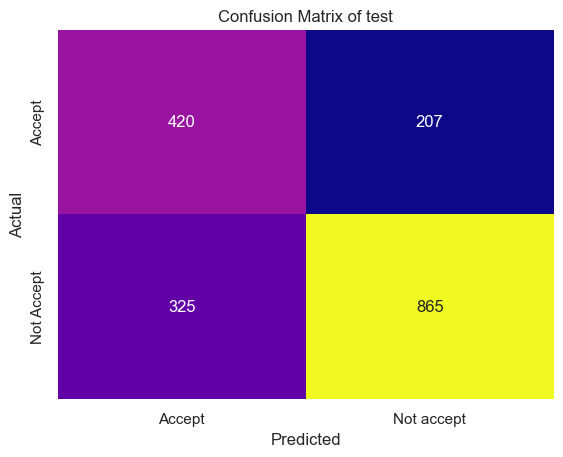

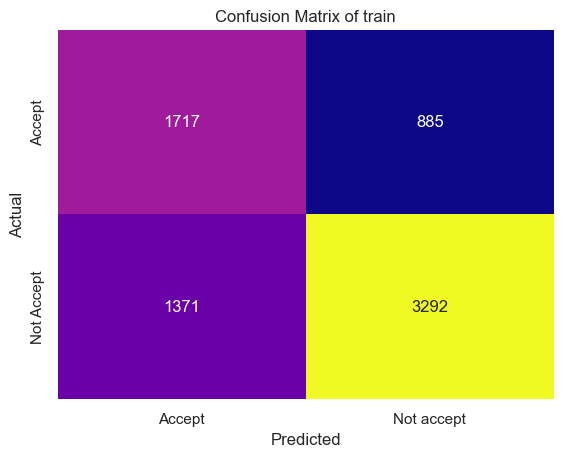



Adaboost
Confusion matrix of test:
 [[423 226]
 [322 846]]
Confusion matrix of train:
 [[1773  908]
 [1315 3269]]
Accuracy of test : 0.6984039625756742
Accuracy of train: 0.6940123881624226


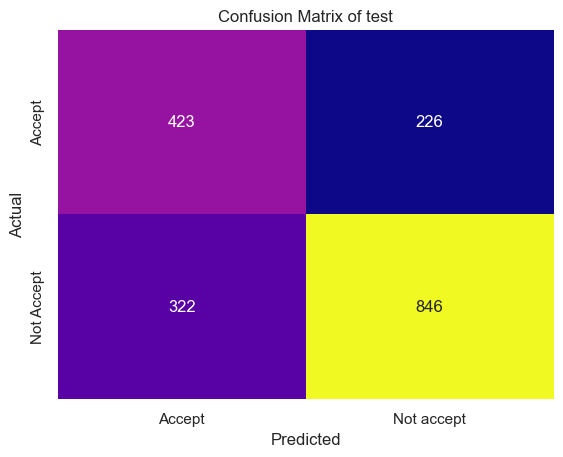

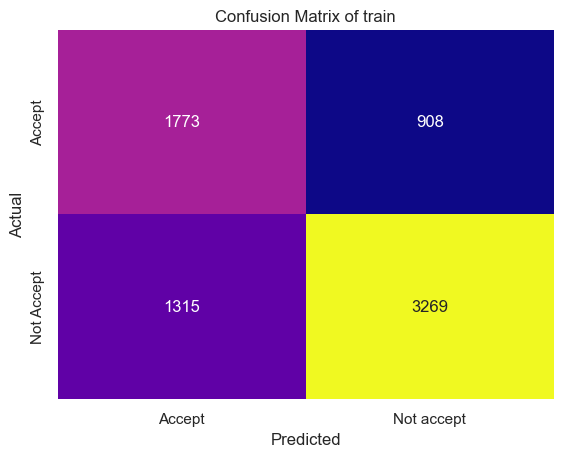



XGBoost
Confusion matrix of test:
 [[516 192]
 [229 880]]
Confusion matrix of train:
 [[2784  161]
 [ 304 4016]]
Accuracy of test : 0.7682993946064942
Accuracy of train: 0.9359944941500344


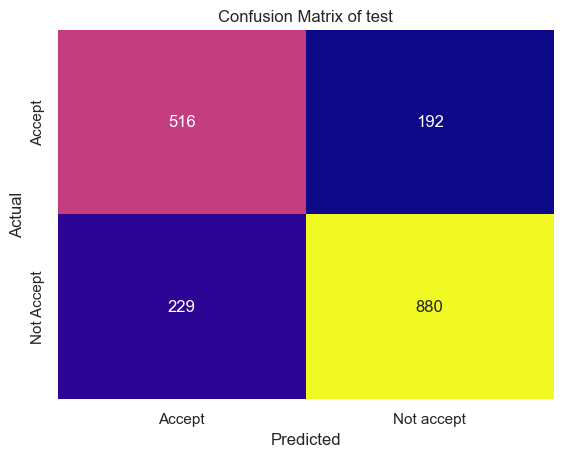

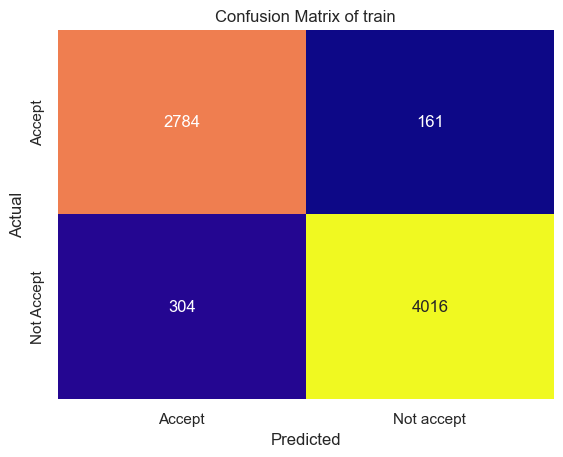



ExtraTree
Confusion matrix of test:
 [[502 218]
 [243 854]]
Confusion matrix of train:
 [[3088   60]
 [   0 4117]]
Accuracy of test : 0.7462850853054486
Accuracy of train: 0.9917412250516173


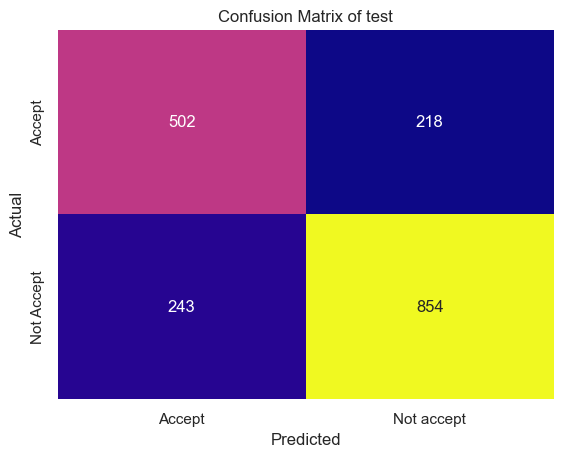

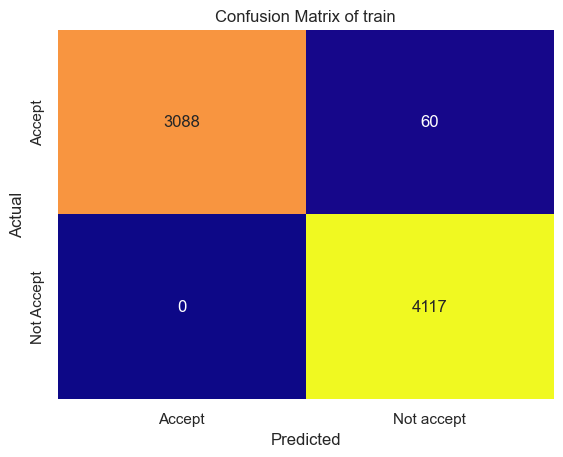

In [ ]:
for name, model in models:
    print(name)
    model.fit(x_train , y_train)

    #Predictions

    predictions = model.predict(x_test)
    predictions_train = model.predict(x_train) # Make predictions on the train



    #Evaluate a model

    from sklearn.metrics import confusion_matrix
    print("Confusion matrix of test:\n",confusion_matrix(predictions, y_test))
    print("Confusion matrix of train:\n",confusion_matrix(predictions_train, y_train))

    #evaluate error

    from sklearn.metrics import accuracy_score
    print("Accuracy of test :",accuracy_score(predictions, y_test))
    print("Accuracy of train:",accuracy_score(predictions_train,y_train))#accuracy score of train

    #plot heatmap
    conf_test = confusion_matrix(predictions, y_test)
    conf_train = confusion_matrix(predictions_train, y_train)
    sns.heatmap(conf_test, annot=True, fmt='d', cmap='plasma', cbar=False,
            xticklabels=['Accept', 'Not accept'],
            yticklabels=['Accept', 'Not Accept'])
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title('Confusion Matrix of test')
    plt.show()
    sns.heatmap(conf_train, annot=True, fmt='d', cmap='plasma', cbar=False,
            xticklabels=['Accept', 'Not accept'],
            yticklabels=['Accept', 'Not Accept'])
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title('Confusion Matrix of train')
    plt.show()




    print("\n")

In [ ]:
import pandas as pd

# Initialize an empty list to store results
results = []

# Loop through each model
for name, model in models:
    # Fit the model to the training data
    model.fit(x_train, y_train)

    # Make predictions on train and test data
    predictions_train = model.predict(x_train)
    predictions_test = model.predict(x_test)

    # Calculate train and test accuracy
    train_accuracy = accuracy_score(predictions_train, y_train)
    test_accuracy = accuracy_score(predictions_test, y_test)

    # Append the results to the list
    results.append((name, train_accuracy, test_accuracy))

# Convert the results list to a DataFrame
results_df = pd.DataFrame(results, columns=['Model', 'Train Accuracy', 'Test Accuracy'])
print(results_df)


                      Model  Train Accuracy  Test Accuracy
0               Naive Bayes        0.656986       0.661530
1             Random Forest        0.991741       0.764447
2  Decision Tree Classifier        0.991741       0.688498
3                       KNN        0.792017       0.699505
4       Logistic Regression        0.689470       0.707210
5                  Adaboost        0.694012       0.698404
6                   XGBoost        0.935994       0.768299
7                 ExtraTree        0.991741       0.742433


In [ ]:
from sklearn.model_selection import cross_val_score
XGBClassifier = XGBClassifier()

# Perform cross-validation
scores = cross_val_score(XGBClassifier, X, y, cv=5)  # X and y are your feature matrix and target variable

# Print cross-validation scores
print("Cross-validation scores:", scores)
print("Mean accuracy:", np.mean(scores))


Cross-validation scores: [0.67804073 0.66097964 0.63381057 0.63546256 0.67455947]
Mean accuracy: 0.6565705924710092


# HyperParameter Tuning

In [ ]:
from sklearn.model_selection import GridSearchCV
from xgboost import XGBClassifier

# Define the parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 0.3],
    'subsample': [0.5, 0.7, 0.9],
    'colsample_bytree': [0.5, 0.7, 0.9]
}

# Create an instance of the XGB
xgb =  XGBClassifier()

# Perform grid search cross-validation
grid_search = GridSearchCV(estimator=xgb, param_grid=param_grid, cv=5, scoring='accuracy', verbose=1, n_jobs=-1)
grid_search.fit(x_train, y_train)

# Print the best parameters and best score
print("Best Parameters:", grid_search.best_params_)
print("Best Score:", grid_search.best_score_)


Fitting 5 folds for each of 243 candidates, totalling 1215 fits
Best Parameters: {'colsample_bytree': 0.9, 'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 200, 'subsample': 0.9}
Best Score: 0.7702684101858225


In [ ]:
from sklearn.metrics import confusion_matrix, accuracy_score

# Make predictions for training data
train_predictions = grid_search.best_estimator_.predict(x_train)

# Make predictions for test data
test_predictions = grid_search.best_estimator_.predict(x_test)

# Confusion matrix for training data
train_confusion_matrix = confusion_matrix(y_train, train_predictions)

# Confusion matrix for test data
test_confusion_matrix = confusion_matrix(y_test, test_predictions)

# Accuracy score for training data
train_accuracy = accuracy_score(y_train, train_predictions)

# Accuracy score for test data
test_accuracy = accuracy_score(y_test, test_predictions)

# Print the confusion matrices and accuracy scores
print("Confusion Matrix for Training Data:")
print(train_confusion_matrix)
print("\nAccuracy Score for Training Data:", train_accuracy)

print("\nConfusion Matrix for Test Data:")
print(test_confusion_matrix)
print("\nAccuracy Score for Test Data:", test_accuracy)


Confusion Matrix for Training Data:
[[2889  199]
 [ 114 4063]]

Accuracy Score for Training Data: 0.9569167240192705

Confusion Matrix for Test Data:
[[520 225]
 [187 885]]

Accuracy Score for Test Data: 0.7732526141992295


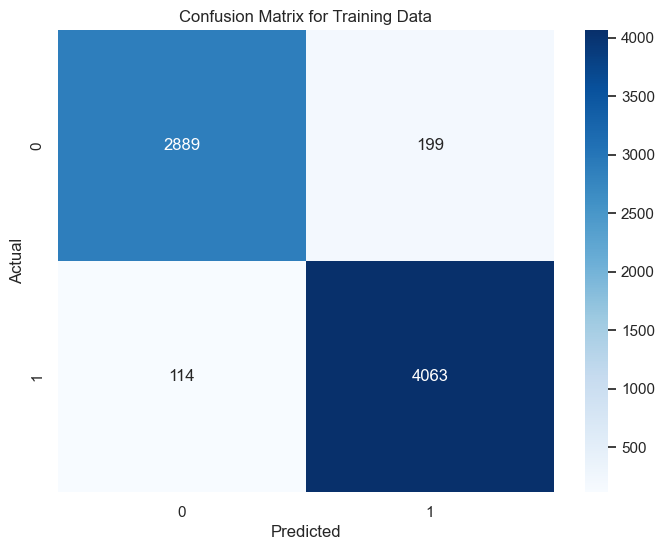

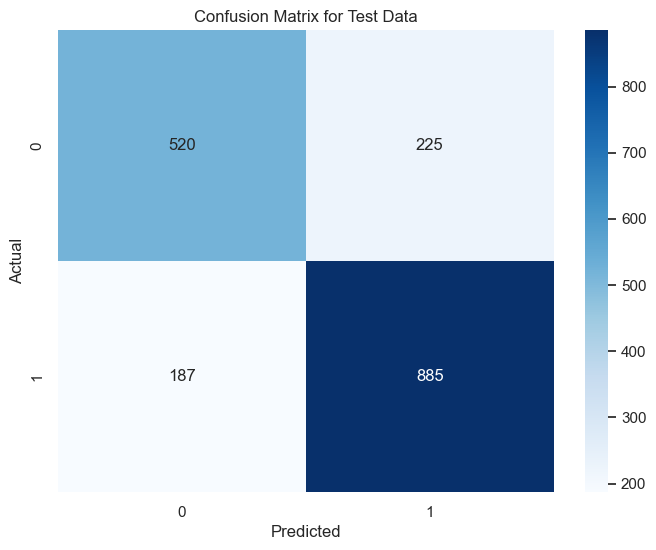

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Plot confusion matrix for training data
plt.figure(figsize=(8, 6))
sns.heatmap(train_confusion_matrix, annot=True, cmap='Blues', fmt='g')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for Training Data')
plt.show()

# Plot confusion matrix for test data
plt.figure(figsize=(8, 6))
sns.heatmap(test_confusion_matrix, annot=True, cmap='Blues', fmt='g')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for Test Data')
plt.show()


# Predict probability of Accepting coupon

In [ ]:
import pandas as pd
from xgboost import XGBClassifier

# Instantiate the XGBClassifier
XGBoost = XGBClassifier()

# Fit the model on training data
XGBoost.fit(x_train, y_train)

# Make predictions on the test data
predictions_proba = XGBoost.predict_proba(x_test)[:, 1]

# Create a DataFrame to store the predicted probabilities
predictions_df = pd.DataFrame(predictions_proba, columns=['Probability1'])

# Concatenate the predicted probabilities DataFrame with the original DataFrame
df_with_proba = pd.concat([df, predictions_df], axis=1)


In [ ]:
df_with_proba.head()

,destination,passanger,weather,temperature,coupon,expiration,gender,age,maritalStatus,has_children,...,Rest20,Rest50,coupon5,coupon15,coupon25,samedir,oppdir,accept,segment,Probability1
0,0.633774,0.525804,0.466746,0.536719,0.707107,0.625582,0.547228,0.598191,0.561299,0.541595,...,0.584637,0.595137,0.568433,0.614168,0.587309,0.564659,0.564659,1.0,0.561015,0.006542
1,0.633774,0.673438,0.466746,0.600337,0.499249,0.495977,0.547228,0.598191,0.561299,0.541595,...,0.584637,0.595137,0.568433,0.614168,0.587309,0.564659,0.564659,0.0,0.561015,0.401098
2,0.633774,0.673438,0.466746,0.600337,0.735478,0.495977,0.547228,0.598191,0.561299,0.541595,...,0.584637,0.595137,0.568433,0.532716,0.587309,0.564659,0.564659,1.0,0.561015,0.041651
3,0.633774,0.673438,0.466746,0.600337,0.499249,0.495977,0.547228,0.598191,0.561299,0.541595,...,0.584637,0.595137,0.568433,0.532716,0.587309,0.564659,0.564659,0.0,0.561015,0.814842
4,0.633774,0.673438,0.466746,0.600337,0.499249,0.625582,0.547228,0.598191,0.561299,0.541595,...,0.584637,0.595137,0.568433,0.532716,0.587309,0.564659,0.564659,0.0,0.561015,0.658101


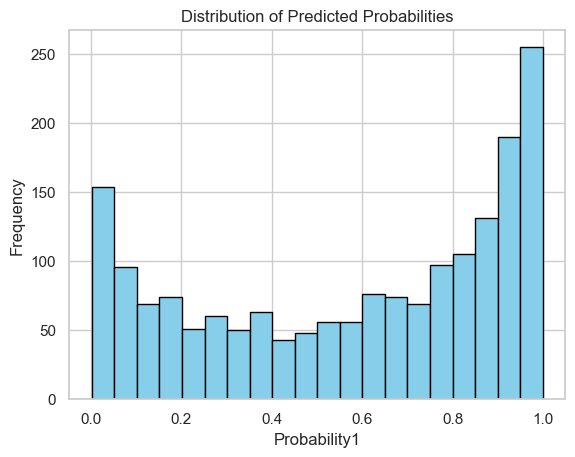

In [ ]:
import matplotlib.pyplot as plt

# Plot a histogram of predicted probabilities
plt.hist(predictions_proba, bins=20, color='skyblue', edgecolor='black')
plt.xlabel('Probability1')
plt.ylabel('Frequency')
plt.title('Distribution of Predicted Probabilities')
plt.show()


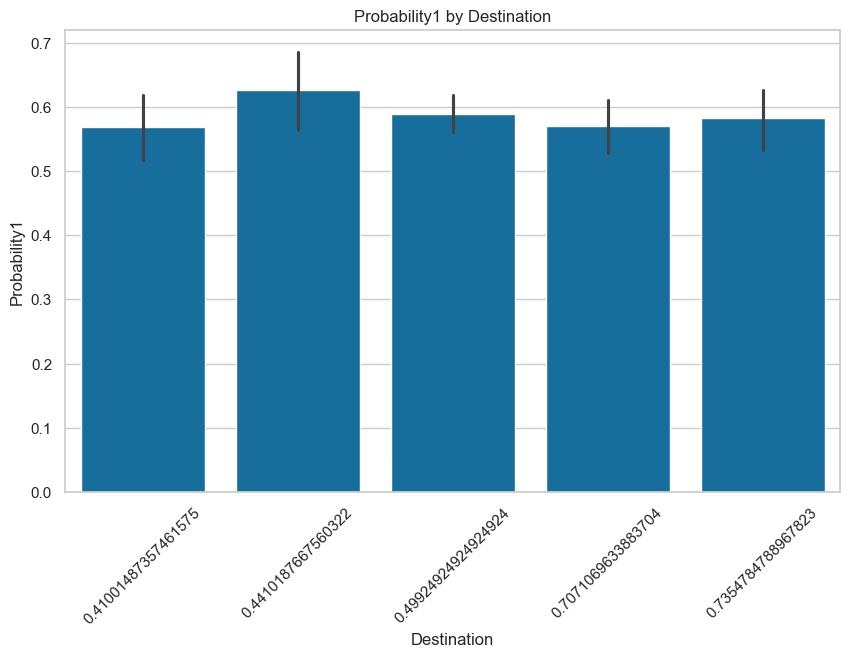

In [ ]:
import seaborn as sns

# Plot a bar plot of Probability1 for each destination category
plt.figure(figsize=(10, 6))
sns.barplot(x='coupon', y='Probability1', data=df_with_proba)
plt.title('Probability1 by Destination')
plt.xlabel('Destination')
plt.ylabel('Probability1')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.show()


In [ ]:
# Get the best estimator from grid search
best_xgb_model = grid_search.best_estimator_

# Get feature importances
feature_importances = best_xgb_model.feature_importances_

# Create a DataFrame to store feature importances
feature_importance_df = pd.DataFrame({'Feature': x_train.columns, 'Importance': feature_importances})

# Sort the DataFrame by importance in descending order
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Print the feature importances
print(feature_importance_df)


          Feature  Importance
15    CoffeeHouse    0.076775
4          coupon    0.074927
5      expiration    0.060948
14            Bar    0.051045
2         weather    0.046512
21       coupon25    0.044595
18         Rest50    0.042103
11     occupation    0.041354
12         income    0.040073
10      education    0.039973
7             age    0.039580
17         Rest20    0.037921
6          gender    0.036668
1       passanger    0.036563
24        segment    0.036448
16       takeaway    0.036269
0     destination    0.035600
9    has_children    0.035248
22        samedir    0.034589
20       coupon15    0.033934
8   maritalStatus    0.033734
3     temperature    0.033087
13            car    0.028423
23         oppdir    0.023634
19        coupon5    0.000000


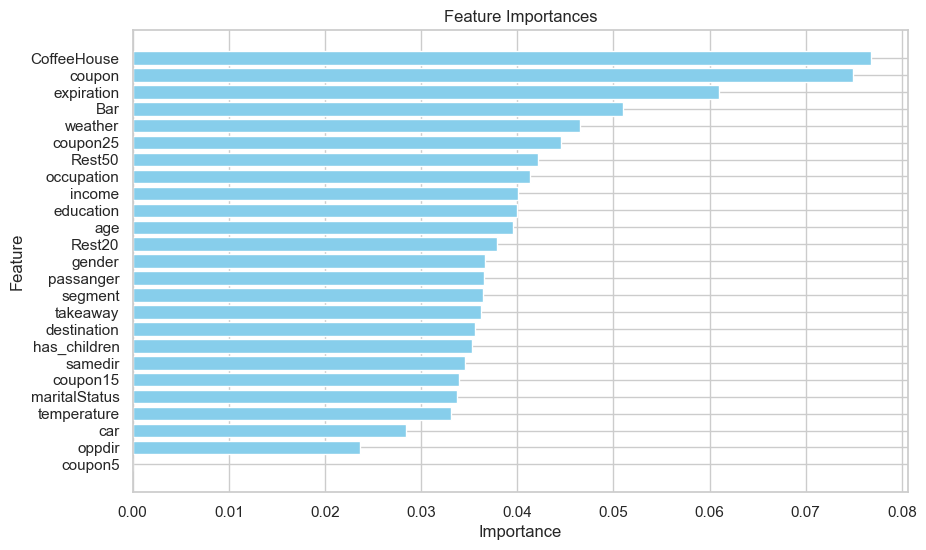

In [ ]:
import matplotlib.pyplot as plt

# Plot the feature importances
plt.figure(figsize=(10, 6))
plt.barh(feature_importance_df['Feature'], feature_importance_df['Importance'], color='skyblue')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importances')
plt.gca().invert_yaxis()  # Invert y-axis to display most important features at the top
plt.show()
